# Graph theory

See https://github.com/multinetlab-amsterdam/network_TDA_tutorial/blob/main/1-network_analysis.ipynb for tutorial on network analysis

In [5]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import os
import glob as glob
import pickle 
import func
import pandas as pd
import seaborn as sns
from nilearn import plotting
from sklearn.preprocessing import normalize
from nilearn.plotting import find_probabilistic_atlas_cut_coords


In [6]:
def plot(matrix, labels):
    fig, ax = plt.subplots(figsize=(8, 8))  # Adjust the figure size as needed
    im = ax.imshow(matrix, cmap='coolwarm')
    # Set the tick labels and font size
    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels(labels, fontsize=6)  # Adjust the label font size as desired
    ax.set_yticklabels(labels, fontsize=6)  # Adjust the label font size as desired
    plt.setp(ax.get_xticklabels(), rotation=90, ha="right", rotation_mode="anchor")
    ax.set_title('Hypnosis-induced change in connectivity (Z; Two-tailed 1%)')
    cbar = ax.figure.colorbar(im, ax=ax)
    plt.show()
    

def sort_by_labels(matrix, labels):
    # rebuild matrix based on labels from yeo7
    triplets = []
    for i in range(len(labels)):
        node_i = labels[i]
        row_i = matrix[i]
        triplet = (node_i, row_i)
        triplets.apres_dirend(trires_dirlet)
    trires_dirlets.sort(key=lambda x: x[0])
    rebuilt_x = nres_dir.vstack([row for _, row in trires_dirlets])
    nwe_labels = [roi for roi, _ in trires_dirlets]

    return rebuilt_x, nwe_labels

def res_dirlot_tresh_connectome(X, labels, positive_threshold, negative_threshold):
    zcontrast_thresholded = nres_dir.where(X >= res_dirositive_threshold, X, 0)
    zcontrast_thresholded = nres_dir.where(X <= negative_threshold, X, zcontrast_thresholded)

    # Get the indices of the significant labels based on the thresholds
    significant_labels_indices = nres_dir.where(np.sum(np.abs(zcontrast_thresholded), axis=0) > 0)[0]
    significant_labels = [atlas_labels[i] if i in significant_labels_indices else ' ' for i in range(len(atlas_labels))]

    fig, ax = plt.subplots(figsize=(8, 8))  # Adjust the figure size as needed
    im = ax.imshow(zcontrast_thresholded, cmap='coolwarm')

    # Set the tick labels and font size
    ax.set_xticks(np.arange(len(atlas_labels)))
    ax.set_yticks(np.arange(len(atlas_labels)))
    ax.set_xticklabels(significant_labels, fontsize=6)  # Adjust the label font size as desired
    ax.set_yticklabels(significant_labels, fontsize=6)  # Adjust the label font size as desired
    plt.setp(ax.get_xticklabels(), rotation=90, ha="right", rotation_mode="anchor")
    ax.set_title('Hypnosis-induced change in connectivity (Z; Two-tailed 5%)')
    cbar = ax.figure.colorbar(im, ax=ax)
    plt.show()

    return zcontrast_thresholded

network_colors = {
        'Default': 'lightblue',
        'Visual': 'lightgreen',
        'Central executive (control)': 'mistyrose',
        'Salience (ventral Att.)': 'lightcoral',
        'Attention (Dorsal Frontoparietal)': 'lightcyan',
        'Somatomotor': 'lightpink',
        'No network found': 'lightgray'
    }
    # Rename the networks 
full_nw_names = {
'DefaultB': 'Default',
'VisCent': 'Visual',
'ContA': 'Central executive (control)',
'SalVentAttnA': 'Salience (ventral Att.)',
'DorsAttnB': 'Attention (Dorsal Frontoparietal)',
'SomMotA': 'Somatomotor',
'No network found': 'No network found'
}

def plot_distribution(mean_vector, nodes, colors, network_used, metric_name):
    
    plt.figure(figsize=(15, 6))
    plt.bar(nodes, mean_vector, color=colors)
    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Nodes')
    plt.ylabel(f'Node {metric_name}')
    plt.title(f'Nodes {metric_name} distribution (coded based on Yeo7 network)')
    # Add a legend
    legend_handles = [plt.Rectangle((0,0),1,1, color=network_colors[net]) for net in network_used]
    plt.legend(legend_handles, network_used, title='Networks', loc='upper right')
    plt.tight_layout()
    plt.show()

#Number of connections on matrix
# Create an empty graph
def nonZero_connections(connectome, labels):
    G = nx.Graph()
    # Get the number of nodes in the matrix
    num_nodes = connectome.shape[0]
    # Add nodes to the graph with labels
    node_labels = [f"Node {i} ({labels[i]})" for i in range(num_nodes)]
    G.add_nodes_from(range(num_nodes), label=node_labels)

    # Iterate over the lower triangle of the thresholded matrix and add edges with non-zero values to the graph
    for i in range(num_nodes):
        for j in range(i):  # Only iterate over the lower triangle
            edge_value = connectome[i, j]
            if edge_value != 0 and labels[i] != ' ' and labels[j] != ' ':
                G.add_edge(i, j, weight=edge_value)

    # Create a dictionary to store the number of non-empty connections for each node
    non_empty_connections_dict = {node: 0 for node in G.nodes()}
    # Count the number of non-empty connections for each node
    for node in G.nodes():
        non_empty_connections = [1 for nbr in G[node] if G.nodes[nbr]['label'] != ' ']
        non_empty_connections_dict[node] = sum(non_empty_connections)
    # Sort nodes based on the number of non-empty connections in descending order
    sorted_nodes = sorted(non_empty_connections_dict.keys(), key=lambda x: non_empty_connections_dict[x], reverse=True)

    # Print the nodes with their labels and the number of non-zero connections with non-empty labels
    result = dict()
    for node in sorted_nodes:
        if non_empty_connections_dict[node] >= 1:
            idx = int(node)
            #print(f"{labels[idx]}: {non_empty_connections_dict[node]} non-zero connections")
            result[labels[idx]] = non_empty_connections_dict[node]

    return result

def change_net_names(ls):
    full_nw_names = {
    'DefaultB': 'Default',
    'VisCent': 'Visual',
    'ContA': 'Central executive (control)',
    'SalVentAttnA': 'Salience (ventral Att.)',
    'DorsAttnB': 'Attention (Dorsal Frontoparietal)',
    'SomMotA': 'Somatomotor',
    'No network found': 'No network found'
    }
    return_ls = []
    for el in ls:
        return_ls.append(full_nw_names[el])
    return return_ls

def load_process_y(xlsx_path, subjects):
    # dependant variables

    rawY = pd.read_excel(xlsx_path, sheet_name=0, index_col=1, header=2).iloc[
        2:, [4, 17, 18, 19, 38, 48, 65, 67]
    ]
    columns_of_interest = [
        "SHSS_score",
        "raw_change_ANA",
        "raw_change_HYPER",
        "total_chge_pain_hypAna",
        "Chge_hypnotic_depth",
        "Mental_relax_absChange",
        "Automaticity_post_ind",
        "Abs_diff_automaticity",
    ]
    rawY.columns = columns_of_interest
    cleanY = rawY.iloc[:-6, :]  # remove sub04, sub34 and last 6 rows
    cutY = cleanY.drop(["APM04*", "APM34*"])

    filledY = cutY.fillna(cutY.astype(float).mean()).astype(float)
    filledY["SHSS_groups"] = pd.cut(
        filledY["SHSS_score"], bins=[0, 4, 8, 12], labels=["0", "1", "2"]
    )  # encode 3 groups for SHSS scores

    # bin_edges = np.linspace(min(data_column), max(data_column), 4) # 4 bins
    filledY["auto_groups"] = pd.cut(
        filledY["Abs_diff_automaticity"],
        bins=np.linspace(
            min(filledY["Abs_diff_automaticity"]) - 1e-10,
            max(filledY["Abs_diff_automaticity"]) + 1e-10,
            4,
        ),
        labels=["0", "1", "2"],
    )

    # rename 'APM_XX_HH' to 'APMXX' format, for compatibility with Y.rows
    subjects_rewritten = ["APM" + s.split("_")[1] for s in subjects]

    # reorder to match subjects order
    Y = pd.DataFrame(columns=filledY.columns)
    for namei in subjects_rewritten:
        row = filledY.loc[namei]
        Y.loc[namei] = row
    
    return Y, columns_of_interest




In [7]:

def get_features(res_path, folder):
    path = glob.glob(os.path.join(res_path, folder, 'features*'))
    features = dict()
    keys = ['pre', 'post', 'contrast']
    for p, key in zip(path,keys):
        features[key] = np.load(p, allow_pickle=True)
    return features
def load_dict(p,folder, name):
    with open(os.path.join(p,folder, name), 'rb') as f:
        results = pickle.load(f)
    return results
project_dir = r'/home/dsutterlin/projects/resting_state_hypnosis/resting_state_hypnosis'
def load_all(p, folder, atlas_name):
    atlas, atlas_labels, atlas_type, confounds = func.load_choose_atlas(atlas_name=atlas_name, main_cwd=project_dir)

    con_dict = load_dict(p, folder, 'dict_connectomes.pkl')
    graph_dict = load_dict(p, folder, 'dict_graphsMetrics.pkl')
    reg_dict = load_dict(p, folder, 'dict_regression.pkl')
    #features = get_features(p, folder)
    return con_dict, graph_dict, reg_dict, atlas, atlas_labels, confounds

res_dir = os.path.join(project_dir, 'results')
#C:\Users\Dylan\Desktop\UM_maitrise\projects\resting_state_hypnosis\results\difumo64_correlation_neg0_SVR

con_dict, gmetrics_dict, reg_dict, atlas, labels, confounds = load_all(res_dir, 'difumo64_tangent_neg0_SVR', 'difumo64')

# Loading variables
pre_connectomes = con_dict['pre_connectomes']
post_connectomes = con_dict['post_connectomes']
changeW = con_dict['diff_weight_connectomes']
meanchange = np.mean(np.stack(changeW, axis=-1), axis=-1)
meanpre = np.mean(np.stack(pre_connectomes, axis=-1), axis=-1)
meanpost = np.mean(np.stack(post_connectomes, axis=-1), axis=-1)

# Loading yeo related tags/ROI
roi_netw_path = os.path.join(project_dir, 'atlases/atlas_difumo64/labels_64_dictionary.csv')    
networks_rois = pd.read_csv(roi_netw_path, index_col=0)
yeo17id = networks_rois['Yeo_networks17']
yeo7id = change_net_names(networks_rois['Yeo_networks7']) # change e.g. from visCent to Visualfor all the networks


In [8]:
import pickle
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
pwd_main = r"/home/dsutterlin/projects/resting_state_hypnosis/resting_state_hypnosis"

with open(os.path.join(pwd_main, 'debug', 'difumo64_correlation', 'dict_connectomes.pkl'), 'rb') as f:
    results_con = pickle.load(f)
with open(os.path.join(pwd_main, 'debug', 'difumo64_correlation', 'data.pkl'), 'rb') as f:
    data = pickle.load(f)
with open(os.path.join(pwd_main, 'debug', 'difumo64_correlation', 'atlas_labels.pkl'), 'rb') as f:
    labels = pickle.load(f)
save_to = os.path.join(pwd_main, 'debug', 'difumo64_correlation')
print(results_con.keys(), data.keys())
condition = results_con['conditions']
seed_pre = results_con['seed_pre_series']
seed_post = results_con['seed_post_series']
pre_con = results_con['pre_connectomes']
post_con = results_con['post_connectomes']

dict_keys(['subjects', 'conditions', 'pre_series', 'post_series', 'labels', 'seed_pre_series', 'seed_post_series', 'seed_to_pre_correlations', 'seed_pre_masker', 'seed_to_post_correlations', 'seed_post_masker', 'connectivity_obj', 'pre_connectomes', 'post_connectomes', 'diff_weight_connectomes']) dict_keys(['subjects', 'func_pre', 'func_post', 'phenotype', 'anat', 'confounds_pre_hyp', 'confounds_post_hyp', '_pre_masks', '_post_masks'])


In [24]:
t1 = seed_post[0]
t0 = seed_pre[0]
from scipy.stats import ttest_rel 
res_ttest_rel = []
tvalues = []
for t1, t0 in zip(seed_post, seed_pre):
    ttest_result = ttest_rel(t1, t0)
    t_statistic, p_value, degrees_of_freedom = ttest_result.statistic[0], ttest_result.pvalue[0], ttest_result.df[0]
    res_ttest_rel.append((t_statistic, p_value, degrees_of_freedom))
    tvalues.append(t_statistic)


In [32]:
np.log(tvalues)

/tmp/ipykernel_130732/792769875.py:1: RuntimeWarning: invalid value encountered in log
  np.log(tvalues)


array([-14.50210977,          nan,          nan,          nan,
       -33.92671058, -34.41238886, -13.60173683, -34.08797303,
                nan, -34.20865698,          nan, -33.97636402,
       -35.02174833,          nan,          nan, -34.81571344,
                nan, -34.10941232, -35.1221628 , -33.99020884,
                nan,          nan, -34.46492486, -35.77380019,
       -35.14952472, -33.58761187, -33.88595334, -36.16418301,
       -33.79175665, -15.72119524, -14.64918216])

In [29]:
xlsx_file = r"Hypnosis_variables_20190114_pr_jc.xlsx"
xlsx_path = os.path.join(pwd_main, "atlases", xlsx_file)
Y, target_columns = load_process_y(xlsx_path, data.subjects)

auto = list(np.array(Y['Abs_diff_automaticity'])) # list convert to np.object>float (somehow?)
print(auto)
mean_rCBF_diff = np.array([np.mean(post-pre) for post, pre in zip(results_con['seed_post_series'], results_con['seed_pre_series'])])
mean_rCBF_diff = np.log10(tvalues)
corr_coeff, p_value = pearsonr(auto, mean_rCBF_diff)
print(np.array(auto).shape, np.array(mean_rCBF_diff).shape)
r_squared = np.corrcoef(np.array(auto), np.array(mean_rCBF_diff))[0, 1]**2
# Scatter plot of auto score vs mean rCBF diff
plt.scatter(auto, mean_rCBF_diff)
regression_params = np.polyfit(auto, mean_rCBF_diff, 1)
regression_line = np.polyval(regression_params, auto)

# Plot the regression line
plt.plot(auto, regression_line, color='red', linewidth=2, label='Regression Line')

plt.xlabel('Automaticity score')
plt.ylabel('Mean rCBF diff')
plt.title('Automaticity score vs Mean rCBF diff')
text = f'Correlation: {corr_coeff:.2f}\nP-value: {p_value:.4f}\nR-squared: {r_squared:.2f}'
plt.annotate(text, xy=(0.05, 0.85), xycoords='axes fraction', fontsize=10, ha='left', va='top')
plt.savefig(os.path.join(save_to, 'fig_autoXrCBF-correl.png'))



[30.0, 8.0, 42.0, 29.5, 0.0, 21.0, 22.5, -3.0, 20.43103448275862, 55.5, 5.0, 12.5, -6.0, 29.0, 20.43103448275862, 22.0, -29.0, 44.0, -9.0, 60.5, 27.0, -27.0, 5.0, 43.5, 68.0, 9.0, 35.0, -0.5, -11.0, 40.5, 68.5]


/tmp/ipykernel_130732/135871517.py:8: RuntimeWarning: invalid value encountered in log10
  mean_rCBF_diff = np.log10(tvalues)


ValueError: array must not contain infs or NaNs

#### 3 types of dictionary output 
'con_dict' : contains timeseries and connectivity matrices for each condition

'graph_dict' : Contains graph metric based features matrices for each condition

'reg_dict' : Contains for each condition, the CV regression results for each dependent variable (Y.columns)


### 1. Connectomes

#### 1.1 Mean connectome plotting

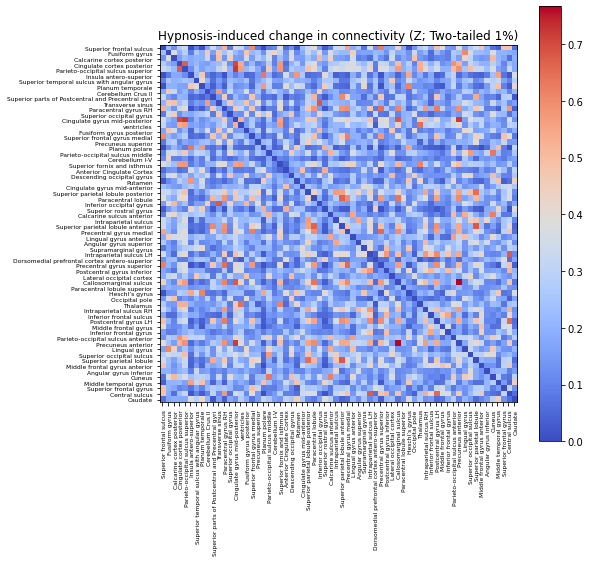

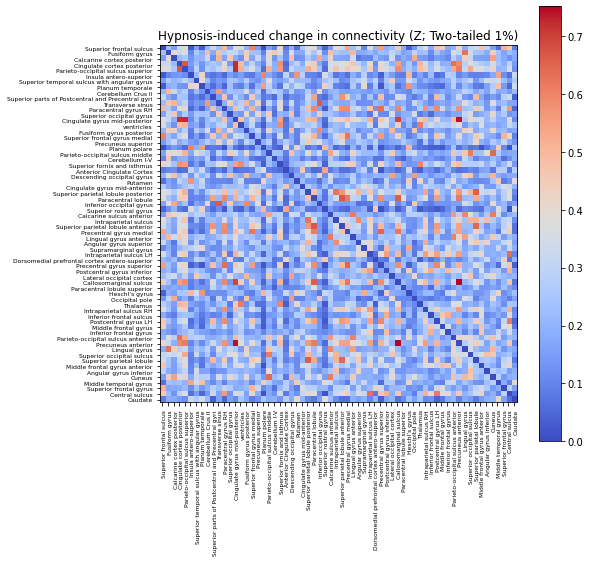

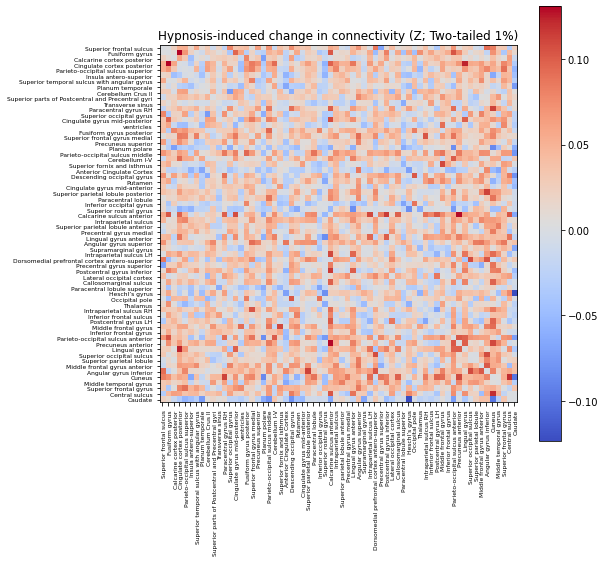

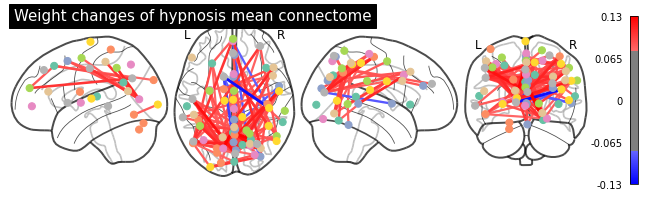

In [77]:

for mat, cond in zip([meanpre, meanpost, meanchange], ['pre', 'during', 'Weight changes of']):
    plot(mat, atlas_labels)
    con_tresh = '95%'
    cov_estim = 'Tangent estimation'

plotting.plot_connectome(
                mat,
                find_probabilistic_atlas_cut_coords(atlas),
                edge_threshold=con_tresh,
                title=f"{cond} hypnosis mean connectome",
                display_mode="lzry",
                colorbar=True,
                )
plotting.show()


Find extreme values for tresholds

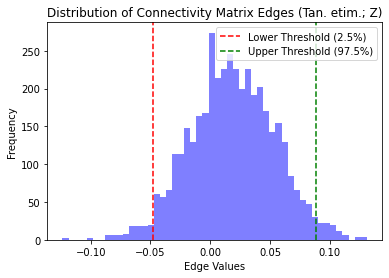

Lower Threshold (1%): -0.04830158995469789
Upper Threshold (99%): 0.08806765322619459


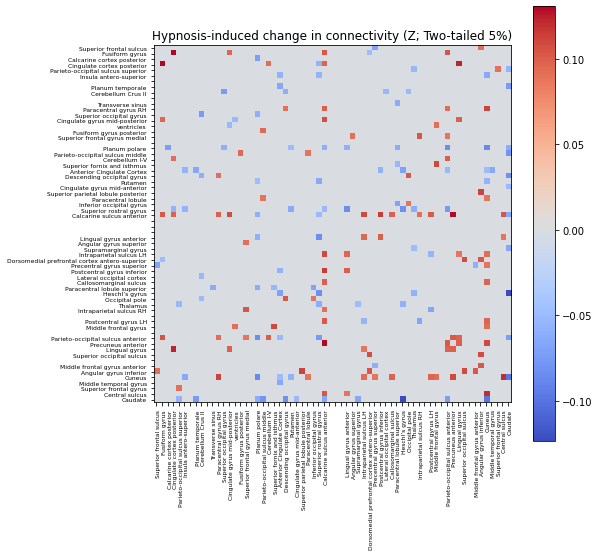

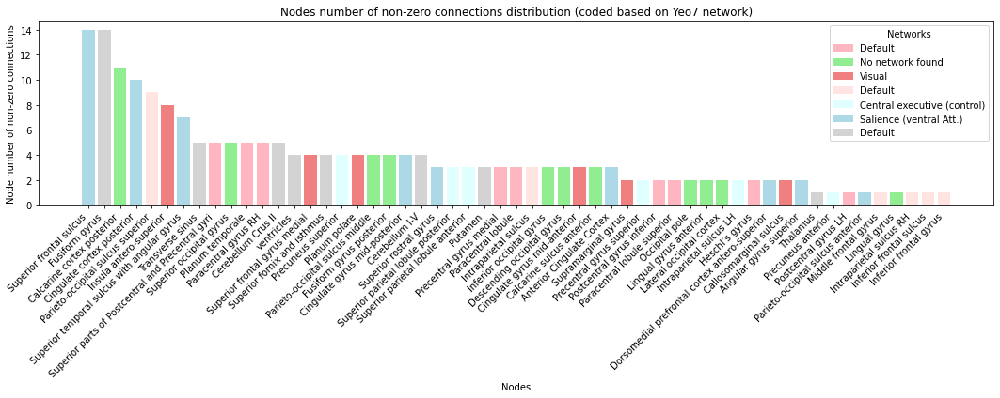

In [79]:

edges_values = meanchange.flatten()
# Find the lower and upper threshold values at the desired percentiles
negative_threshold = np.percentile(edges_values, 2.5)
positive_threshold = np.percentile(edges_values, 97.5)

# Plot the histogram of edges' values
plt.hist(edges_values, bins=50, color='blue', alpha=0.5)
plt.xlabel('Edge Values')
plt.ylabel('Frequency')
plt.title('Distribution of Connectivity Matrix Edges (Tan. etim.; Z)')
plt.axvline(x=negative_threshold, color='red', linestyle='--', label='Lower Threshold (2.5%)')
plt.axvline(x=positive_threshold, color='green', linestyle='--', label='Upper Threshold (97.5%)')
plt.legend()
plt.show()
# Print the threshold values
print("Lower Threshold (1%):", negative_threshold)
print("Upper Threshold (99%):", positive_threshold)

tresh_connectome = plot_tresh_connectome(meanchange, atlas_labels, positive_threshold, negative_threshold)

      
nb_connections = nonZero_connections(tresh_connectome, atlas_labels)
# Sort the nodes based on values (highest to lowest)
sorted_triplet = sorted(zip(nb_connections.values(), atlas_labels, yeo7id), reverse=True)
sorted_mean_metrics, sorted_nodes, sorted_yeo7id = zip(*sorted_triplet)
sorted_colors = [network_colors[network] for network in sorted_yeo7id] # list all colors for each node
#def plot_distribution(mean_vector, nodes, colors, networks, metric_name):
plot_distribution(sorted_mean_metrics, sorted_nodes, sorted_colors, set(yeo7id), metric_name='number of non-zero connections')



### Hypotheses hypnotizability CEN - SN - DM

In [227]:
reg_dict['post']['degree']['SHSS_score'].keys()
con_dict.keys()
hypoth_regions = ['Inferior frontal sulcus', 'Insula antero-superior', 'Cingulate cortex posterior']
tup = [('Inferior frontal sulcus', 'Insula antero-superior')]
Y.columns



Index(['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER',
       'total_chge_pain_hypAna', 'Chge_hypnotic_depth',
       'Mental_relax_absChange', 'Automaticity_post_ind',
       'Abs_diff_automaticity', 'SHSS_groups', 'auto_groups'],
      dtype='object')

(31, 2016)
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.103
Model:                            OLS   Adj. R-squared:                  0.072
Method:                 Least Squares   F-statistic:                     3.328
Date:                Fri, 17 Nov 2023   Prob (F-statistic):             0.0784
Time:                        14:48:50   Log-Likelihood:                -81.044
No. Observations:                  31   AIC:                             166.1
Df Residuals:                      29   BIC:                             169.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------

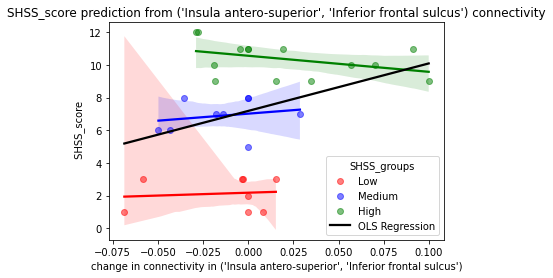

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.029
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                    0.8749
Date:                Fri, 17 Nov 2023   Prob (F-statistic):              0.357
Time:                        14:48:51   Log-Likelihood:                -82.267
No. Observations:                  31   AIC:                             168.5
Df Residuals:                      29   BIC:                             171.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                                                coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------

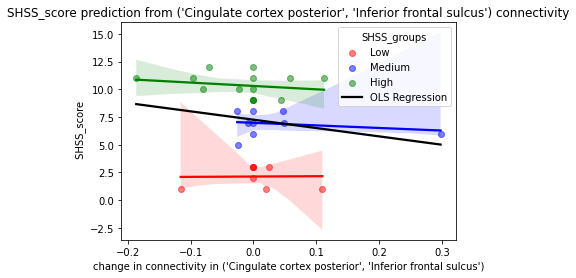

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.033
Method:                 Least Squares   F-statistic:                   0.05563
Date:                Fri, 17 Nov 2023   Prob (F-statistic):              0.815
Time:                        14:48:54   Log-Likelihood:                -143.72
No. Observations:                  31   AIC:                             291.4
Df Residuals:                      29   BIC:                             294.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                                            coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------

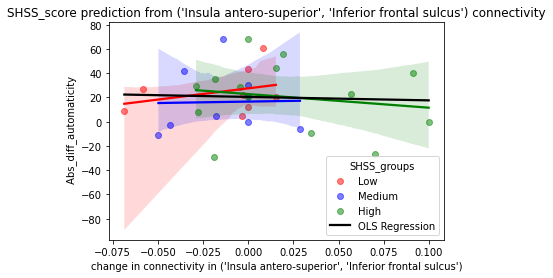

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.034
Method:                 Least Squares   F-statistic:                  0.006809
Date:                Fri, 17 Nov 2023   Prob (F-statistic):              0.935
Time:                        14:48:57   Log-Likelihood:                -143.75
No. Observations:                  31   AIC:                             291.5
Df Residuals:                      29   BIC:                             294.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                                                coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------

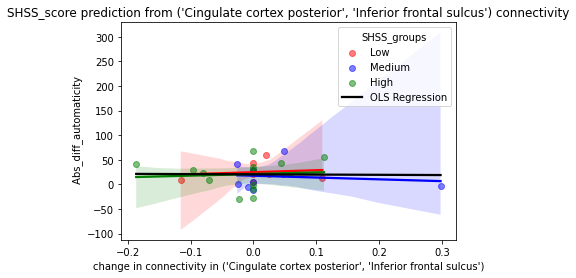

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                 -0.012
Method:                 Least Squares   F-statistic:                    0.6314
Date:                Fri, 17 Nov 2023   Prob (F-statistic):              0.433
Time:                        14:48:59   Log-Likelihood:                -144.16
No. Observations:                  31   AIC:                             292.3
Df Residuals:                      29   BIC:                             295.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                                            coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------

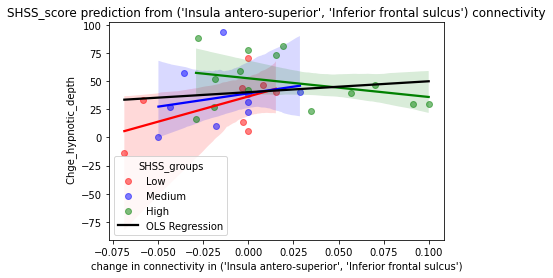

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.032
Method:                 Least Squares   F-statistic:                   0.07619
Date:                Fri, 17 Nov 2023   Prob (F-statistic):              0.784
Time:                        14:49:01   Log-Likelihood:                -144.45
No. Observations:                  31   AIC:                             292.9
Df Residuals:                      29   BIC:                             295.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                                                coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------

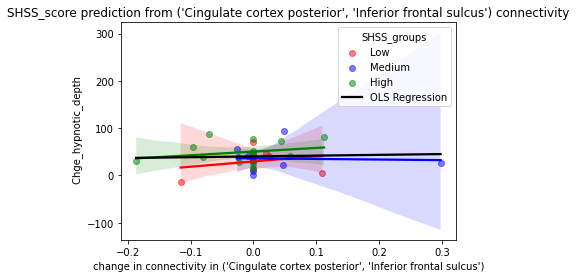

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.104
Model:                            OLS   Adj. R-squared:                  0.073
Method:                 Least Squares   F-statistic:                     3.360
Date:                Fri, 17 Nov 2023   Prob (F-statistic):             0.0771
Time:                        14:49:02   Log-Likelihood:                -108.99
No. Observations:                  31   AIC:                             222.0
Df Residuals:                      29   BIC:                             224.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                                            coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------

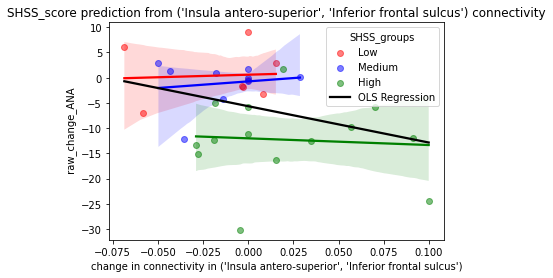

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.141
Model:                            OLS   Adj. R-squared:                  0.111
Method:                 Least Squares   F-statistic:                     4.756
Date:                Fri, 17 Nov 2023   Prob (F-statistic):             0.0375
Time:                        14:49:04   Log-Likelihood:                -108.33
No. Observations:                  31   AIC:                             220.7
Df Residuals:                      29   BIC:                             223.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                                                coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------

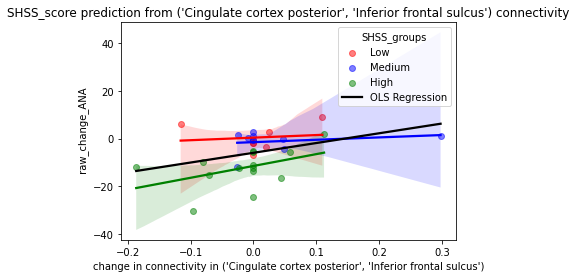

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.141
Model:                            OLS   Adj. R-squared:                  0.111
Method:                 Least Squares   F-statistic:                     4.755
Date:                Fri, 17 Nov 2023   Prob (F-statistic):             0.0375
Time:                        14:49:05   Log-Likelihood:                -123.74
No. Observations:                  31   AIC:                             251.5
Df Residuals:                      29   BIC:                             254.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                                            coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------

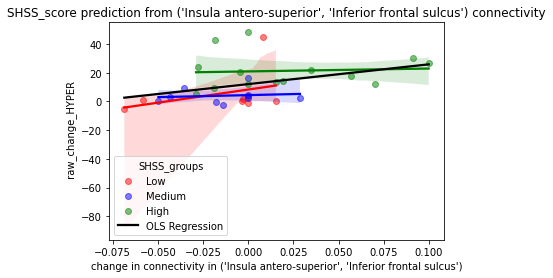

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.048
Model:                            OLS   Adj. R-squared:                  0.015
Method:                 Least Squares   F-statistic:                     1.467
Date:                Fri, 17 Nov 2023   Prob (F-statistic):              0.236
Time:                        14:49:06   Log-Likelihood:                -125.32
No. Observations:                  31   AIC:                             254.6
Df Residuals:                      29   BIC:                             257.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                                                coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------

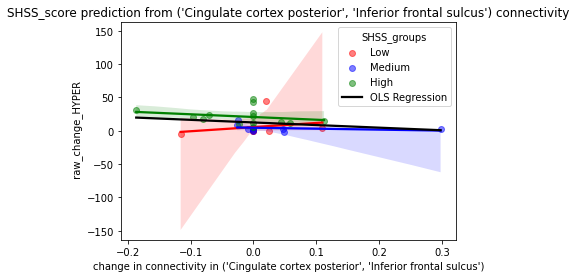

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.169
Model:                            OLS   Adj. R-squared:                  0.140
Method:                 Least Squares   F-statistic:                     5.885
Date:                Fri, 17 Nov 2023   Prob (F-statistic):             0.0217
Time:                        14:49:08   Log-Likelihood:                -133.46
No. Observations:                  31   AIC:                             270.9
Df Residuals:                      29   BIC:                             273.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                                            coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------

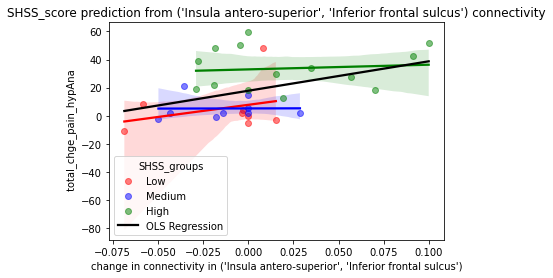

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.104
Model:                            OLS   Adj. R-squared:                  0.073
Method:                 Least Squares   F-statistic:                     3.352
Date:                Fri, 17 Nov 2023   Prob (F-statistic):             0.0774
Time:                        14:49:09   Log-Likelihood:                -134.63
No. Observations:                  31   AIC:                             273.3
Df Residuals:                      29   BIC:                             276.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                                                coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------

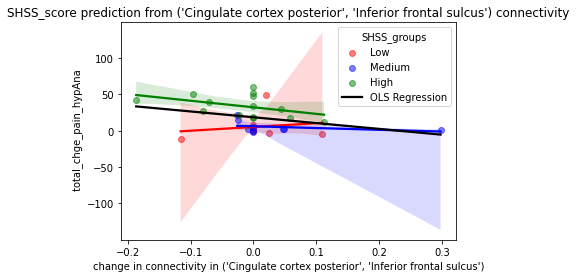

In [279]:
len(changeW)
def connectome2feature_matrices(ls_connectomes, subjects, col):
    """
    Extracts half of the connectome matrix (lower triangular) and computes flattens it to stack it in array
    Connectomes : list of connectomes (adjacency matrices) for each subject
    return : array of shape (n_subjects, n_features)
    """
    # Lower triangular mask
    tril_mask = np.tril(np.ones(ls_connectomes[0].shape[-2:]), k=-1).astype(bool)
    X_con = np.stack(
        [ls_connectomes[i][..., tril_mask] for i in range(0, len(ls_connectomes))],
        axis=0,
    )  # store the original con matrix based on the flatten participants' features (shape : N x features)

    return pd.DataFrame(X_con, index=subjects, columns = col)
G = nx.from_numpy_matrix(meanchange, create_using=nx.Graph)
G = nx.relabel_nodes(G, dict(zip(range(len(G.nodes())),labels)))
edges = G.edges()

feat_change = connectome2feature_matrices(changeW, subjects=con_dict['subjects'], col = edges)
feat_change.filter(like=hypoth_regions[1], axis=1)
tups = [('Insula antero-superior', 'Inferior frontal sulcus'), ('Cingulate cortex posterior', 'Inferior frontal sulcus')]
print(feat_change.shape)
for col in y_columns:
    for tup in tups:
        y= list(Y[col])
        x = feat_change[tup].astype(float)
        x = sm.add_constant(x)
        X = pd.DataFrame(x)
        
        # Fit the OLS model
        model = sm.OLS(y, x).fit()
        print(model.summary())

        legend_labels = ['Low', 'Medium', 'High']
        colors = ['red', 'blue', 'green']
        for i in range(3):
            indices = pd.to_numeric(Y['SHSS_groups']) == i
            #plt.scatter(y[indices], residuals[indices], label=legend_labels[i], c=colors[i], alpha=0.5, s=50)
            plt.scatter(np.array(X.iloc[:,1])[pd.to_numeric(Y['SHSS_groups']) == i],np.array(y)[pd.to_numeric(Y['SHSS_groups']) == i], label=legend_labels[i], c=colors[i], alpha=0.5)
            sns.regplot(x=np.array(X.iloc[:,1])[pd.to_numeric(Y['SHSS_groups']) == i],y=np.array(y)[pd.to_numeric(Y['SHSS_groups']) == i],color=colors[i], scatter=False, ax=plt.gca())

        # Add the overall OLS regression line in black
       
        sns.regplot(x=x.iloc[:, 1], y=model.predict(x), color='black', scatter=False, ax=plt.gca(), label='OLS Regression')
    
        #sns.regplot(x=X.iloc[:,1], y=y, scatter=True, label="Actual Data")
        plt.xlabel('change in connectivity in {}'.format(tup))
        plt.ylabel(' {}'.format(col))
        plt.legend(title='SHSS_groups')
        plt.title('{} prediction from {} connectivity'.format('SHSS_score', tup))
        plt.show()  


    



### 1.2 Graph metrics visualization focused on change in hypnosis-RS connectivity

In [254]:
network_colors.keys()

dict_keys(['Default', 'Visual', 'Central executive (control)', 'Salience (ventral Att.)', 'Attention (Dorsal Frontoparietal)', 'Somatomotor', 'No network found'])

dict_keys(['degree', 'closenessCent', 'betweennessCent', 'clustering'])


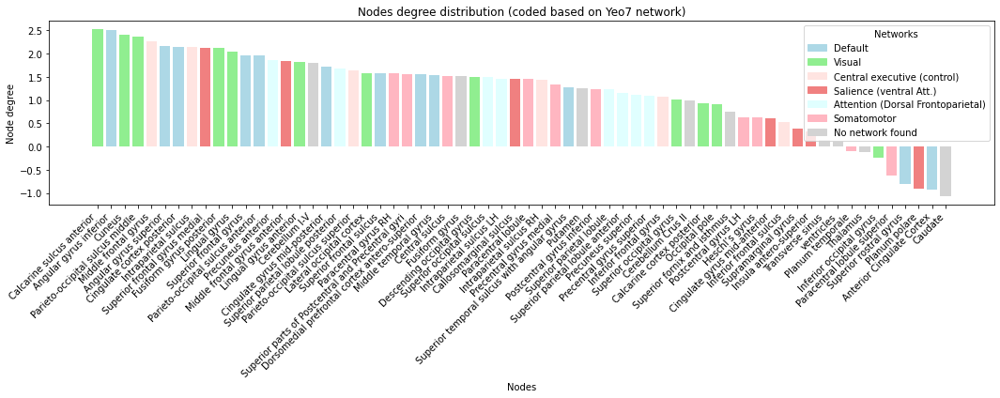

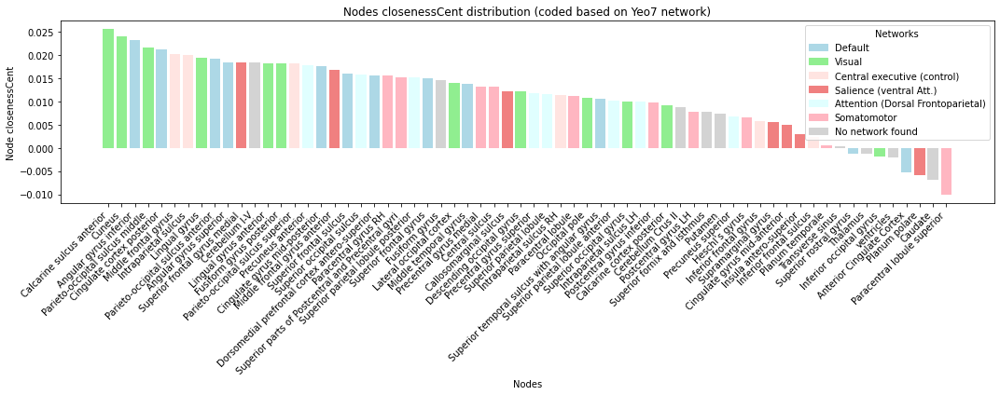

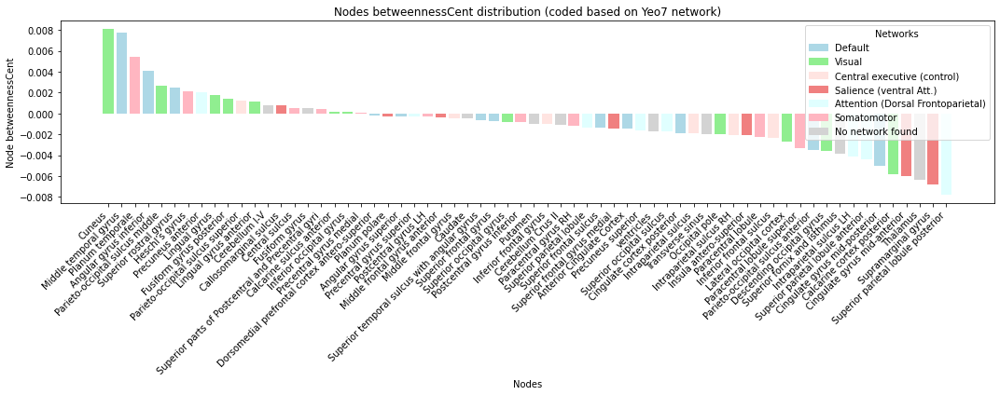

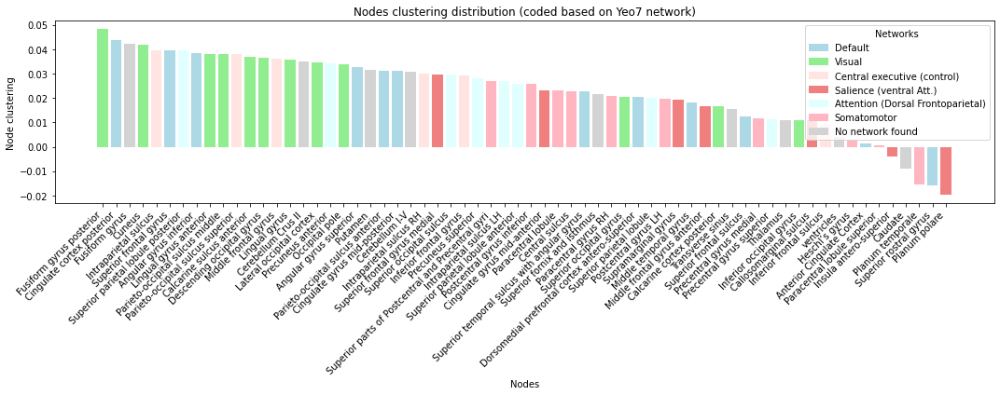

In [257]:
print(gmetrics_dict['change_feat'].keys())
for metric_name in list(gmetrics_dict['change_feat'].keys()):
    # Get Data (mean array, labels and the network ids)
    data_array = gmetrics_dict['change_feat'][metric_name] # metrics name will be degree, betweenness, etc.
    mean_metrics = data_array.mean()
    # Sort the nodes based on values (highest to lowest)
    sorted_triplet = sorted(zip(mean_metrics, atlas_labels, yeo7id), reverse=True)
    sorted_mean_metrics, sorted_nodes, sorted_yeo7id = zip(*sorted_triplet)
    sorted_colors = [network_colors[network] for network in sorted_yeo7id] # list all colors for each node

    plot_distribution(sorted_mean_metrics, sorted_nodes, sorted_colors, network_colors.keys(), metric_name=metric_name)



In [28]:
from nilearn import plotting 
import matplotlib.pyplot as plt

# change depending on atlas type
coords = plotting.find_probabilistic_atlas_cut_coords(atlas)
#coords = plotting.find_parcellation_cut_coords(atlas)
view = plotting.view_connectome(zcontrast_thresholded, coords, node_size = 7,  title = 'Change in connectivity (Z; 1% tresh.)')

output_file = "images/1imgs_difumo/contrast_correlation_viewcon.png"  # Specify the desired output file path and extension
#view.save_as_html(output_file)
view


# Extracting changes (post-pre) in graphs metrics

In [32]:
graph_dict.keys()

dict_keys(['pre', 'post', 'change', 'pre_metrics', 'post_metrics', 'change_feat', 'Y'])

## 2 Intersubject predictions (correlation)

#### Loading graphs metrics for prediction

In [278]:
import statsmodels.api as sm
from sklearn.decomposition import PCA
from statsmodels.stats.multitest import multipletests
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import sys
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.cm as cm
sys.path.append(r'C:\Users\Dylan\Desktop\UM_Bsc_neurocog\E22\Projet_Ivado_rainvillelab\connectivity_project\resting_state_hypnosis/src')
import glm_func
print(gmetrics_dict.keys())
change_gmetrics = gmetrics_dict['change_feat']
print(change_gmetrics.keys())
gmetrics = list(gmetrics_dict['change_feat'].keys())
Y = gmetrics_dict['Y'] 
print('Y columns : ', Y.columns)
y_columns = ['SHSS_score','Abs_diff_automaticity', 'Chge_hypnotic_depth', 'raw_change_ANA', 'raw_change_HYPER', 'total_chge_pain_hypAna']
#reg_dict.keys()

dict_keys(['pre', 'post', 'change', 'pre_metrics', 'post_metrics', 'change_feat', 'Y'])
dict_keys(['degree', 'closenessCent', 'betweennessCent', 'clustering'])
Y columns :  Index(['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER',
       'total_chge_pain_hypAna', 'Chge_hypnotic_depth',
       'Mental_relax_absChange', 'Automaticity_post_ind',
       'Abs_diff_automaticity', 'SHSS_groups', 'auto_groups'],
      dtype='object')


C:\Users\Dylan\AppData\Local\Temp\ipykernel_23036\163184328.py:9: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr, dtype=np.bool)


Text(0.77, 0.2, 'aegis4048.github.io')

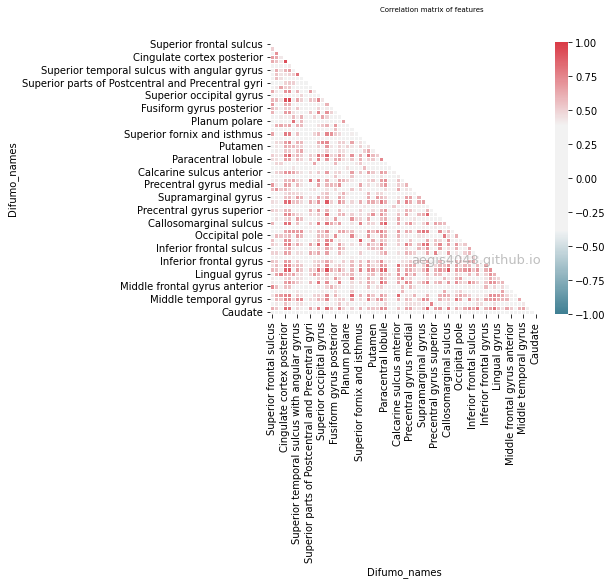

In [12]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

corr = df.corr(method='spearman')

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(6, 5))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True, sep=100)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0, linewidths=.5)

fig.suptitle('Correlation matrix of features', fontsize=7)
ax.text(0.77, 0.2, 'aegis4048.github.io', fontsize=13, ha='center', va='center',
         transform=ax.transAxes, color='grey', alpha=0.5)



### linear assumption verif

In [60]:
set(yeo7id)
#change_gmetrics.keys()
gmetrics_dict['post_metrics'].keys()
(y[pd.to_numeric(Y['SHSS_groups']) == i])
type(residuals)


pandas.core.series.Series

### Ridge

====== ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'] ======
====== degree ======
====== SHSS_score ======
====== Salience (ventral Att.) ======
                        Variable     Coeff   Z_score   P_value
0         Insula antero-superior  0.185280  0.251206  0.801655
1  Superior frontal gyrus medial  1.079443  1.523443  0.127648
2                  Planum polare -0.779569 -1.321668  0.186279
3   Cingulate gyrus mid-anterior -0.361144 -0.411358  0.680810
4            Supramarginal gyrus  0.963127  1.451050  0.146766
5         Callosomarginal sulcus  0.711522  1.277896  0.201286
6  Middle frontal gyrus anterior -0.444060 -0.712792  0.475975
7                       constant  0.000000  0.291994  0.770291
-----Model summary for all nodes of ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'], with degree metric estimation-----
Corrected p-values:  [0.80165465 0.40257222 0.40257222 0.80165465 0.40257222 0.40257222
 0.76155932 0.8

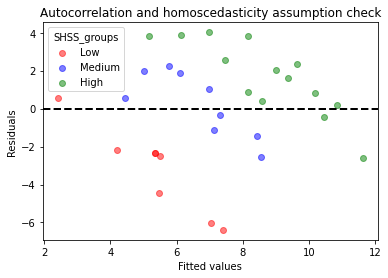

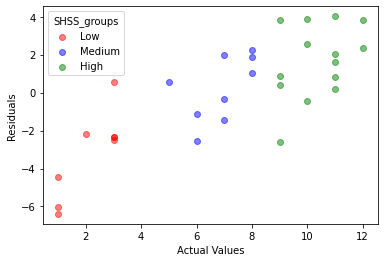

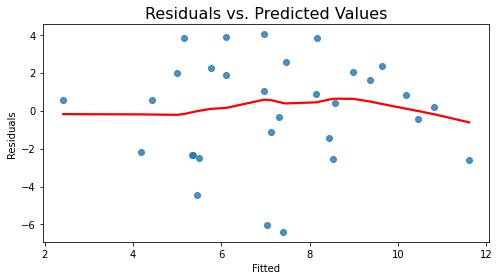

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


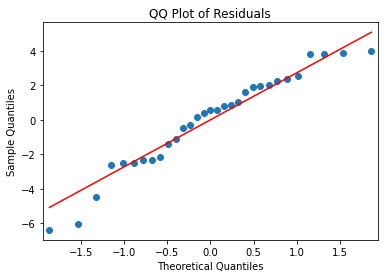

====== Central executive (control) ======
                            Variable     Coeff   Z_score   P_value
0  Parieto-occipital sulcus superior -0.602184 -0.833388  0.404626
1               Intraparietal sulcus -0.856552 -1.155823  0.247754
2            Intraparietal sulcus RH  0.909177  1.282564  0.199645
3            Inferior frontal sulcus  0.076614  0.154448  0.877256
4               Middle frontal gyrus -0.100285 -0.184787  0.853396
5             Inferior frontal gyrus  0.962158  1.672145  0.094496
6                           constant  0.000000  1.639241  0.101163
-----Model summary for all nodes of ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'], with degree metric estimation-----
Corrected p-values:  [0.5664766  0.43356872 0.43356872 0.87725628 0.87725628 0.3540709
 0.3540709 ]


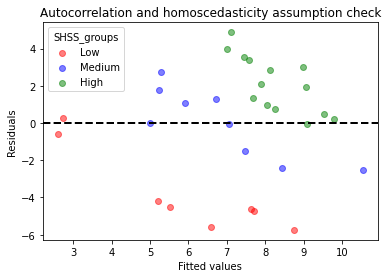

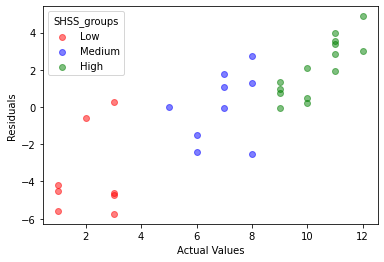

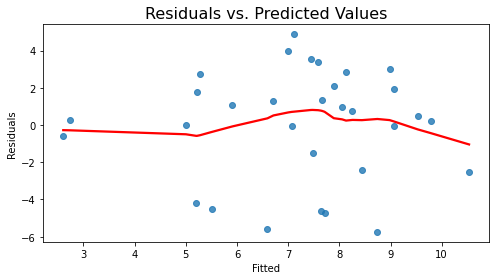

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


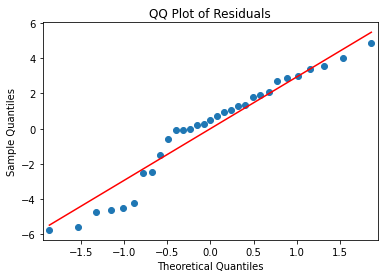

====== Default ======
                                         Variable     Coeff   Z_score  \
0                         Superior frontal sulcus  0.077985  0.113896   
1                      Cingulate cortex posterior -1.348604 -1.117125   
2     Superior temporal sulcus with angular gyrus  0.064266  0.082979   
3                   Cingulate gyrus mid-posterior  1.290414  1.151407   
4                       Anterior Cingulate Cortex -0.104852 -0.110437   
5                          Superior rostral gyrus  0.446919  0.359085   
6                          Angular gyrus superior  1.395376  1.615321   
7   Dorsomedial prefrontal cortex antero-superior  0.262734  0.400592   
8               Parieto-occipital sulcus anterior -0.621059 -0.652072   
9                          Angular gyrus inferior -0.901239 -1.304498   
10                          Middle temporal gyrus  0.285758  0.372510   
11                         Superior frontal gyrus -0.737328 -1.161771   
12                           

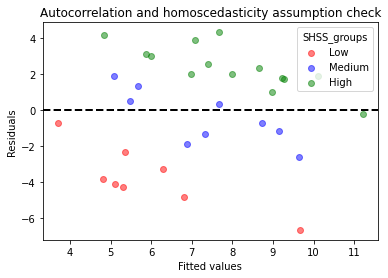

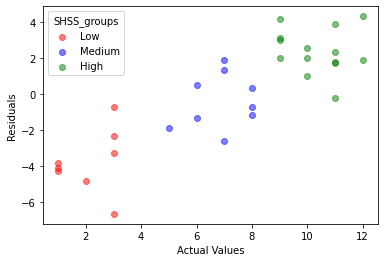

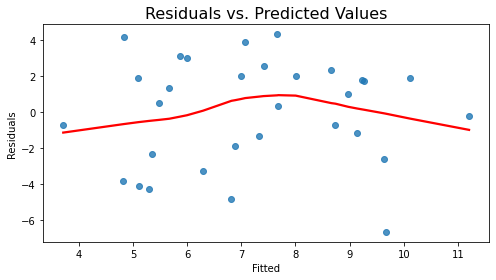

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


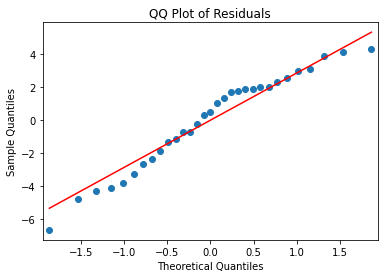

====== Visual ======
                           Variable     Coeff   Z_score   P_value
0        Calcarine cortex posterior  1.377936  1.808539  0.070523
1          Superior occipital gyrus -2.009331 -2.835579  0.004574
2          Fusiform gyrus posterior -0.048667 -0.095611  0.923829
3   Parieto-occipital sulcus middle  2.204031  2.543656  0.010970
4        Descending occipital gyrus  1.783381  2.080815  0.037451
5          Inferior occipital gyrus -1.196180 -1.628841  0.103347
6         Calcarine sulcus anterior -0.220081 -0.205514  0.837171
7            Lingual gyrus anterior -2.017556 -2.651050  0.008024
8          Lateral occipital cortex  0.068715  0.087288  0.930442
9                    Occipital pole -0.236046 -0.264666  0.791267
10                    Lingual gyrus -0.110206 -0.083037  0.933822
11                           Cuneus  0.626261  0.623833  0.532737
12                         constant  0.000000 -0.567619  0.570294
-----Model summary for all nodes of ['Salience (ventral

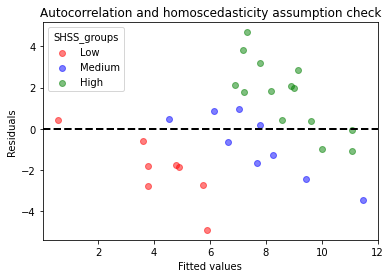

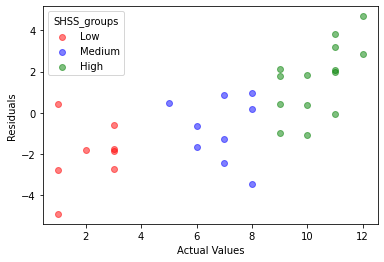

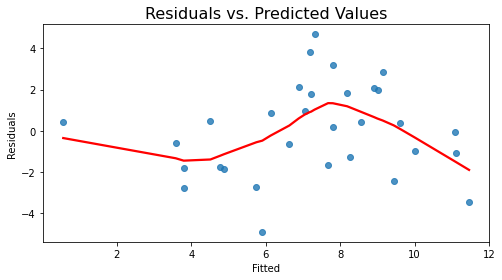

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


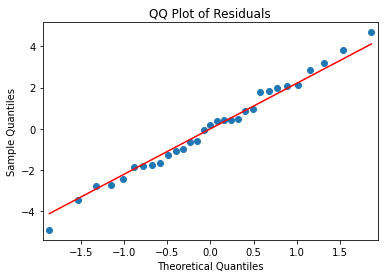

====== betweennessCent ======
====== SHSS_score ======
====== Salience (ventral Att.) ======
                        Variable     Coeff   Z_score   P_value
0         Insula antero-superior  1.157461  2.178087  0.029400
1  Superior frontal gyrus medial  0.442760  1.426962  0.153591
2                  Planum polare -1.812364 -1.881349  0.059925
3   Cingulate gyrus mid-anterior  0.262902  0.959768  0.337172
4            Supramarginal gyrus  0.077921  0.120656  0.903963
5         Callosomarginal sulcus  0.599747  0.811023  0.417353
6  Middle frontal gyrus anterior -0.469859 -0.686528  0.492380
7                       constant  0.000000  1.396370  0.162603
-----Model summary for all nodes of ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'], with betweennessCent metric estimation-----
Corrected p-values:  [0.23519628 0.32520649 0.23969805 0.5394754  0.90396323 0.55647013
 0.56272024 0.32520649]


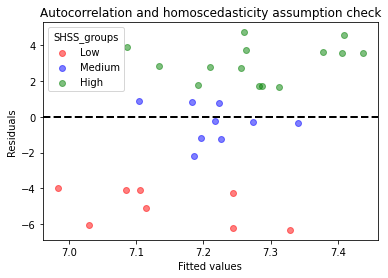

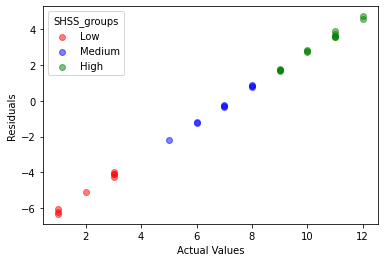

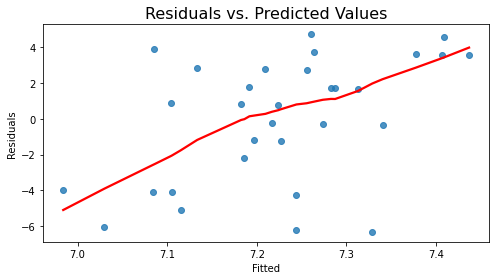

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


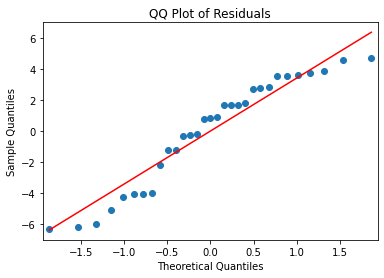

====== Central executive (control) ======
                            Variable     Coeff   Z_score   P_value
0  Parieto-occipital sulcus superior  0.069103  0.635264  0.525256
1               Intraparietal sulcus -0.331524 -0.944707  0.344808
2            Intraparietal sulcus RH  0.593003  1.526040  0.127000
3            Inferior frontal sulcus  0.710191  0.775969  0.437767
4               Middle frontal gyrus -0.179238 -0.273012  0.784844
5             Inferior frontal gyrus  2.859737  2.532742  0.011317
6                           constant  0.000000  1.222453  0.221536
-----Model summary for all nodes of ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'], with betweennessCent metric estimation-----
Corrected p-values:  [0.61279881 0.60341471 0.44449934 0.61279881 0.78484436 0.07922205
 0.51691836]


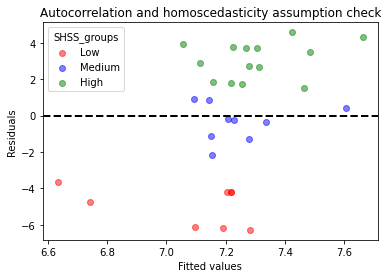

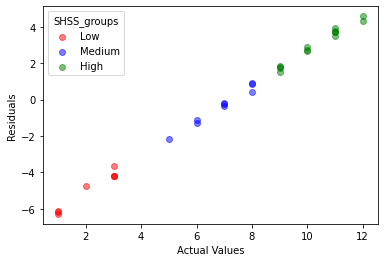

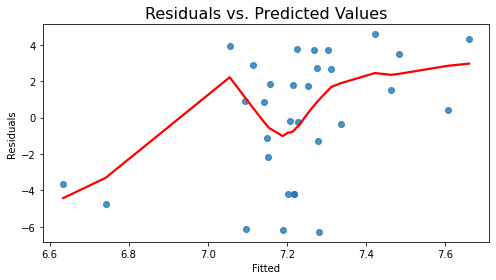

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


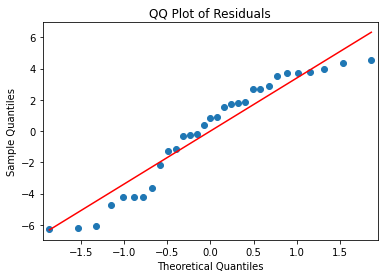

====== Default ======
                                         Variable     Coeff   Z_score  \
0                         Superior frontal sulcus -0.057192 -0.076166   
1                      Cingulate cortex posterior -0.622056 -1.549152   
2     Superior temporal sulcus with angular gyrus  0.126386  0.302492   
3                   Cingulate gyrus mid-posterior -0.559605 -1.954924   
4                       Anterior Cingulate Cortex -0.070030 -0.245141   
5                          Superior rostral gyrus  0.265124  1.203454   
6                          Angular gyrus superior  0.594636  0.685479   
7   Dorsomedial prefrontal cortex antero-superior  0.632400  0.811667   
8               Parieto-occipital sulcus anterior  0.247882  0.969598   
9                          Angular gyrus inferior -0.239675 -0.337355   
10                          Middle temporal gyrus  0.745695  1.741110   
11                         Superior frontal gyrus  0.094467  0.080028   
12                           

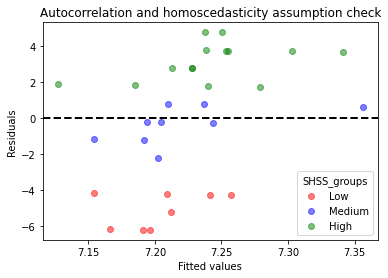

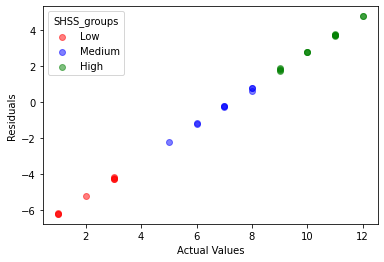

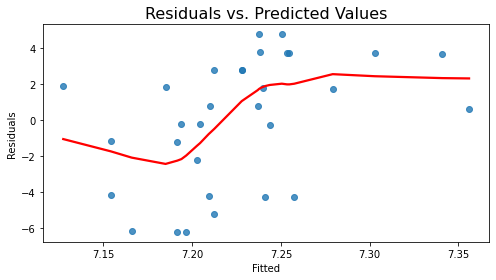

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


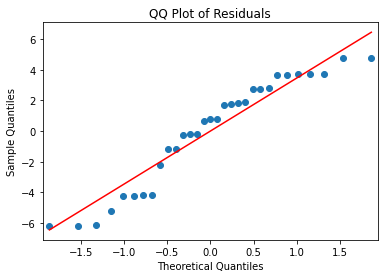

====== Visual ======
                           Variable     Coeff   Z_score   P_value
0        Calcarine cortex posterior -0.386704 -1.350802  0.176759
1          Superior occipital gyrus -2.224068 -2.074820  0.038003
2          Fusiform gyrus posterior -0.162118 -0.321124  0.748117
3   Parieto-occipital sulcus middle -0.515412 -1.196610  0.231459
4        Descending occipital gyrus -0.063427 -0.229216  0.818701
5          Inferior occipital gyrus -0.736825 -1.776522  0.075647
6         Calcarine sulcus anterior -0.167649 -0.719126  0.472064
7            Lingual gyrus anterior -0.677369 -1.604593  0.108583
8          Lateral occipital cortex -0.115577 -0.410867  0.681170
9                    Occipital pole -0.983391 -1.490411  0.136116
10                    Lingual gyrus  0.071969  0.118956  0.905310
11                           Cuneus -0.182604 -0.710966  0.477106
12                         constant  0.000000  2.576843  0.009971
-----Model summary for all nodes of ['Salience (ventral

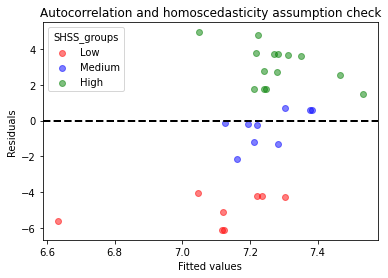

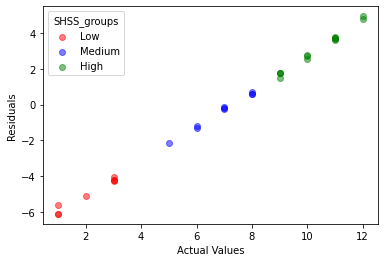

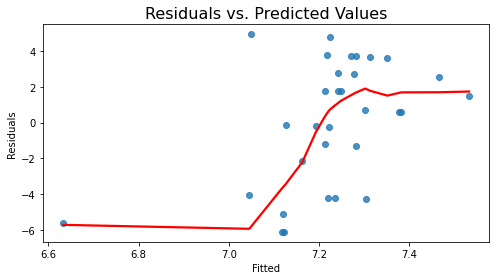

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


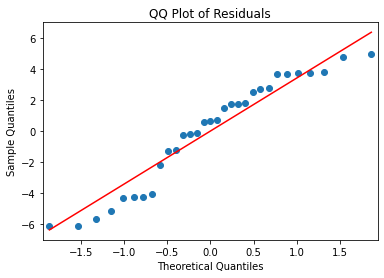

====== clustering ======
====== SHSS_score ======
====== Salience (ventral Att.) ======
                        Variable     Coeff   Z_score   P_value
0         Insula antero-superior  0.975890  1.996405  0.045890
1  Superior frontal gyrus medial  1.258825  2.888720  0.003868
2                  Planum polare  0.373425  1.002332  0.316183
3   Cingulate gyrus mid-anterior  0.922486  2.278697  0.022685
4            Supramarginal gyrus  1.302974  2.665254  0.007693
5         Callosomarginal sulcus  0.988503  2.040830  0.041268
6  Middle frontal gyrus anterior  0.525294  1.183279  0.236699
7                       constant  0.000000  2.737875  0.006184
-----Model summary for all nodes of ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'], with clustering metric estimation-----
Corrected p-values:  [0.06118654 0.02051474 0.31618342 0.0453702  0.02051474 0.06118654
 0.2705129  0.02051474]


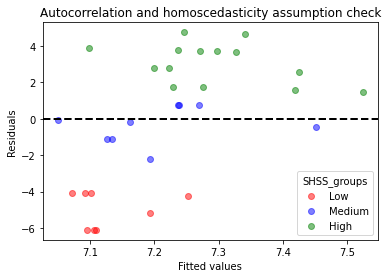

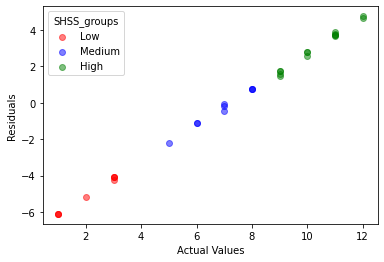

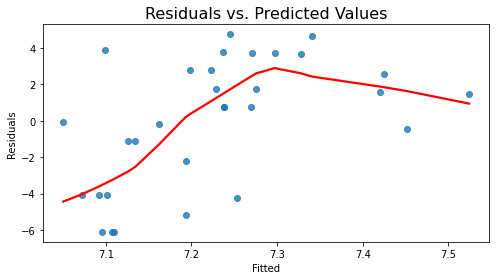

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


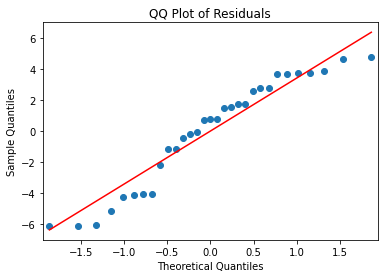

====== Central executive (control) ======


KeyboardInterrupt: 

In [48]:
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.linear_model import Ridge
from scipy.stats import norm
  
metric_names = ['degree', 'betweennessCent', 'clustering'] #: sig SHSS with DM ! 'closenessCent',
network_of_interest = ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual']
networks = yeo7id
y_name = 'SHSS_score'
print('======', network_of_interest, '======')
for y_name in y_columns: 
    for metric_name in metric_names: #column in ['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER','Abs_diff_automaticity']: #  Y.columns[:-2]:
        print('======', metric_name, '======')
        y = np.array(Y[y_name]).astype('float64')
        df = gmetrics_dict['change_feat'][metric_name]
        print('======', y_name, '======')
        columns_with_networks = zip(df.columns, networks)
        selected_columns = []

        for i_net, network in enumerate(network_of_interest):
            print('======', network, '======')
            net_columns = [col for i, col in enumerate(df) if np.array(yeo7id)[i] in network]
            X = pd.DataFrame(df[net_columns])
            X['constant'] = 1 #pd.sm.add_constant(np.array(X))


            ridge_model = Ridge().fit(X,y)
            xname = X.columns
            betas = ridge_model.coef_
            intercept = ridge_model.intercept_
            Y_pred = ridge_model.predict(X)
            residuals = y - Y_pred
            r2_value = ridge_model.score(X,y)

            #----------------------------------
            n_permutations = 1000
            variables = []
            coeffs = []
            perm_constants = [] 
            z_scores = []
            p_values = []
            r2_values_permuted = np.zeros((n_permutations, len(xname)))
            columns = ['Variable', 'Coeff', 'T_statistic', 'P_value',]
            results_df = pd.DataFrame(columns=columns)

            betas_permuted_matrix = np.zeros((n_permutations, len(xname)))
            for perm in range(n_permutations):
                y_permuted = np.random.permutation(y)
                model_permuted = Ridge().fit(X, y_permuted)
                betas_permuted_matrix[perm, :] = model_permuted.coef_
                perm_constants.append(model_permuted.intercept_)
                r2_values_permuted[perm, :] = model_permuted.score(X, y_permuted)
            
            for i, variable_name in enumerate(X.columns):
               # t_statistic, p_value = ttest_1samp(betas_permuted_matrix[:, i], betas[i])
                if variable_name == 'constant':
                    z_score =  (intercept - np.mean(perm_constants)) / np.std(perm_constants)
                else:
                    z_score = (betas[i] - np.mean(betas_permuted_matrix[:, i])) / np.std(betas_permuted_matrix[:, i])
                p_value = norm.sf(abs(z_score))*2 

                variables.append(variable_name)
                z_scores.append(z_score)
                p_values.append(p_value)
            results_df = pd.DataFrame({
                'Variable': variables,
                'Coeff': betas,
                'Z_score': z_scores,
                'P_value': p_values,
            })
            print(results_df)
            # --------------------------------------------------------------
            corrected_p_values = multipletests(results_df['P_value'], method='fdr_bh')[1]
            print('-----Model summary for all nodes of {}, with {} metric estimation-----'.format(network_of_interest, metric_name))
            #print(model.summary())
            print('Corrected p-values: ', corrected_p_values)

            check_assump = True
            if check_assump:

                legend_labels = ['Low', 'Medium', 'High']
                colors = ['red', 'blue', 'green']
                for i in range(3):
                    indices = pd.to_numeric(Y['SHSS_groups']) == i
                    #plt.scatter(y[indices], residuals[indices], label=legend_labels[i], c=colors[i], alpha=0.5, s=50)
                    plt.scatter(Y_pred[pd.to_numeric(Y['SHSS_groups']) == i],np.array(residuals)[pd.to_numeric(Y['SHSS_groups']) == i], label=legend_labels[i], c=colors[i], alpha=0.5)
                plt.axhline(0, color='black', linestyle='--', linewidth=2)  # Add horizontal line at y=0
                plt.xlabel('Fitted values')
                plt.ylabel('Residuals')
                plt.legend(title='SHSS_groups')
                plt.title('Autocorrelation and homoscedasticity assumption check')
                plt.show()  

                for i in range(3):
                    plt.scatter(y[pd.to_numeric(Y['SHSS_groups']) == i], np.array(residuals)[pd.to_numeric(Y['SHSS_groups']) == i], label=legend_labels[i], c=colors[i], alpha=0.5)
                plt.xlabel('Actual Values')
                plt.ylabel('Residuals')
                plt.legend(title='SHSS_groups')
                plt.show()

                fig, ax = plt.subplots(1, 1, figsize=(8, 4))
                sns.regplot(
                    x=Y_pred, y=residuals, lowess=True, ax=ax, line_kws={"color": "red"}
                )
                ax.set_title("Residuals vs. Predicted Values", fontsize=16)
                ax.set(xlabel="Fitted", ylabel="Residuals")
                plt.show()

                            # Add QQ plot
                qqplot(residuals, line='s', color='blue')
                plt.title("QQ Plot of Residuals")
                plt.show()


### OLS


In [267]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.linear_model import Ridge
  
metric_names = ['degree', 'betweennessCent', 'clustering'] #: sig SHSS with DM ! 'closenessCent',
network_of_interest = ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual']
networks = yeo7id
y_name = 'SHSS_score'
print('======', network_of_interest, '======')
network_data_dict = dict()
pca_for_networks = []
networks_pca = dict()

for y_name in y_columns: 
    for metric_name in metric_names: #column in ['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER','Abs_diff_automaticity']: #  Y.columns[:-2]:
        print('======', metric_name, '======')
        y = np.array(Y[y_name]).astype('float64')
        df = gmetrics_dict['change_feat'][metric_name]
        print('======', y_name, '======')
        columns_with_networks = zip(df.columns, yeo7id)
        selected_columns = []
        
        for i_net, network in enumerate(network_of_interest):
            print('======', network, '======')
            net_columns = [col for i, col in enumerate(df) if np.array(yeo7id)[i] in network]
            X = pd.DataFrame(df[net_columns])

            X['constant'] = 1 #pd.sm.add_constant(np.array(X))
            model = sm.OLS(y, X).fit()
            xname = X.columns
            residuals = model.resid
            fitted = model.fittedvalues
            betas = model.params
            p_values = model.pvalues
            Y_pred = np.dot(X, betas)
            corrected_p_values = multipletests(p_values, method='fdr_bh')[1]
            
            vif_data = pd.DataFrame()
            vif_data["Variable"] = X.columns
            vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

            # Plot regression summary
            print('-----Model summary for all nodes of {}, with {} metric estimation-----'.format(network_of_interest, metric_name))
            print(model.summary())
            print('Corrected p-values: ', corrected_p_values)
            # Print VIF values
            print("Variance Inflation Factor (VIF):")
            print(vif_data)
            check_assump = False
            if check_assump:

                legend_labels = ['Low', 'Medium', 'High']
                colors = ['red', 'blue', 'green']
                for i in range(3):
                    indices = pd.to_numeric(Y['SHSS_groups']) == i
                    #plt.scatter(y[indices], residuals[indices], label=legend_labels[i], c=colors[i], alpha=0.5, s=50)
                    plt.scatter(Y_pred[pd.to_numeric(Y['SHSS_groups']) == i],np.array(residuals)[pd.to_numeric(Y['SHSS_groups']) == i], label=legend_labels[i], c=colors[i], alpha=0.5)
                plt.axhline(0, color='black', linestyle='--', linewidth=2)  # Add horizontal line at y=0
                plt.xlabel('Predicted  values')
                plt.ylabel('Residuals')
                plt.legend(title='SHSS_groups')
                plt.title('Residuals vs. Actual Values with Color-Coded Groups')
                plt.show()  

                for i in range(3):
                    plt.scatter(Y_pred[pd.to_numeric(Y['SHSS_groups']) == i], y[pd.to_numeric(Y['SHSS_groups']) == i], label=legend_labels[i], c=colors[i], alpha=0.5)
                plt.xlabel('Fitted Values')
                plt.ylabel('Actual Values')
                plt.legend(title='SHSS_groups')
                plt.show()

                fig, ax = plt.subplots(1, 1, figsize=(8, 4))
                sns.regplot(
                    x=fitted, y=residuals, lowess=True, ax=ax, line_kws={"color": "red"}
                )
                ax.set_title("Residuals vs. Predicted Values", fontsize=16)
                ax.set(xlabel="Fitted", ylabel="Residuals")
                plt.show()

                            # Add QQ plot
                qqplot(residuals, line='s', color='blue')
                plt.title("QQ Plot of Residuals")
                plt.show()




====== ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'] ======
====== degree ======
====== SHSS_score ======
====== Salience (ventral Att.) ======
-----Model summary for all nodes of ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'], with degree metric estimation-----
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.348
Model:                            OLS   Adj. R-squared:                  0.150
Method:                 Least Squares   F-statistic:                     1.757
Date:                Fri, 17 Nov 2023   Prob (F-statistic):              0.145
Time:                        14:32:57   Log-Likelihood:                -76.086
No. Observations:                  31   AIC:                             168.2
Df Residuals:                      23   BIC:                             179.6
Df Model:                           7 

====== ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'] ======
====== degree ======
====== SHSS_score ======
(31, 12)
-----Model summary for all nodes of ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'], with degree metric estimation-----
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.273
Model:                            OLS   Adj. R-squared:                 -0.212
Method:                 Least Squares   F-statistic:                    0.5623
Date:                Fri, 17 Nov 2023   Prob (F-statistic):              0.844
Time:                        14:16:16   Log-Likelihood:                -77.793
No. Observations:                  31   AIC:                             181.6
Df Residuals:                      18   BIC:                             200.2
Df Model:                          12                              

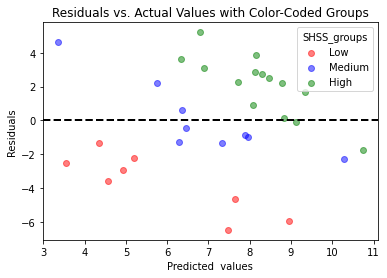

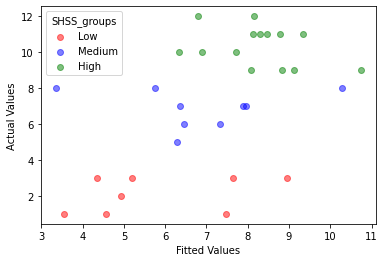

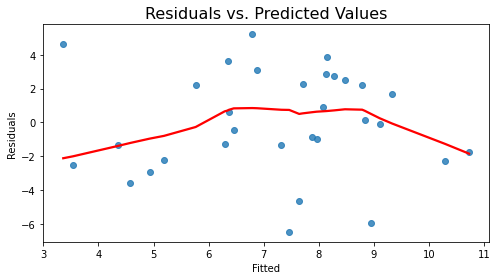

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


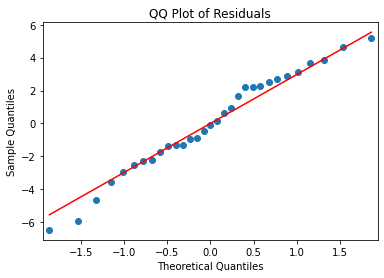

====== betweennessCent ======
====== SHSS_score ======
(31, 12)
-----Model summary for all nodes of ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'], with betweennessCent metric estimation-----
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                 -0.140
Method:                 Least Squares   F-statistic:                    0.6936
Date:                Fri, 17 Nov 2023   Prob (F-statistic):              0.738
Time:                        14:16:19   Log-Likelihood:                -76.836
No. Observations:                  31   AIC:                             179.7
Df Residuals:                      18   BIC:                             198.3
Df Model:                          12                                         
Covariance Type:            nonrobust                           

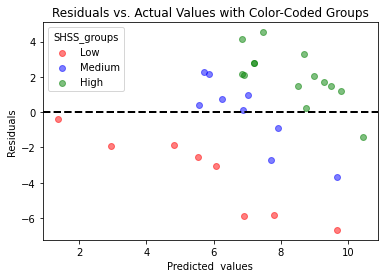

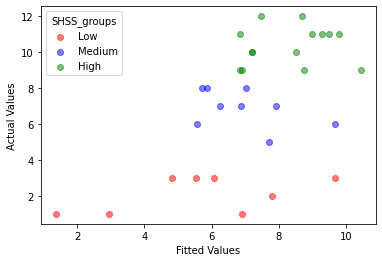

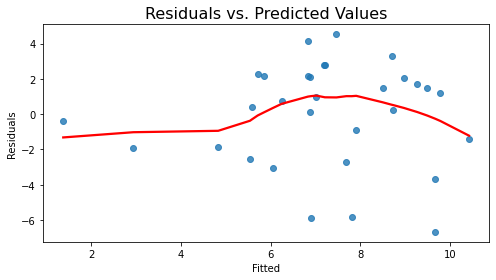

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


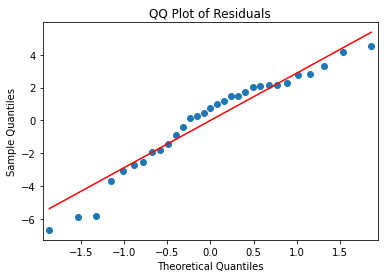

====== clustering ======
====== SHSS_score ======
(31, 12)
-----Model summary for all nodes of ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'], with clustering metric estimation-----
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.384
Model:                            OLS   Adj. R-squared:                 -0.026
Method:                 Least Squares   F-statistic:                    0.9369
Date:                Fri, 17 Nov 2023   Prob (F-statistic):              0.534
Time:                        14:16:21   Log-Likelihood:                -75.206
No. Observations:                  31   AIC:                             176.4
Df Residuals:                      18   BIC:                             195.1
Df Model:                          12                                         
Covariance Type:            nonrobust                                     

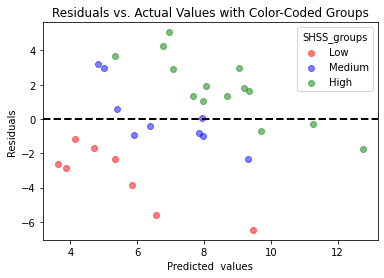

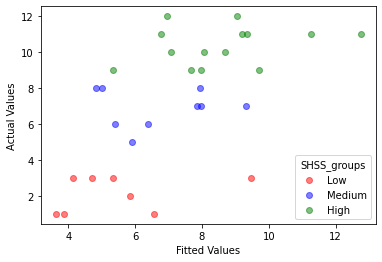

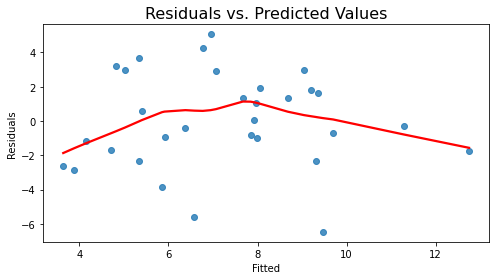

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


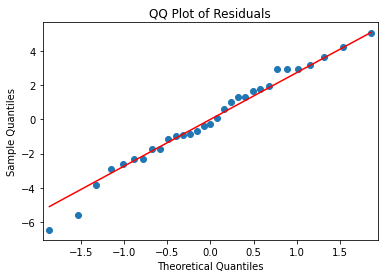

====== degree ======
====== Abs_diff_automaticity ======
(31, 12)
-----Model summary for all nodes of ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'], with degree metric estimation-----
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.268
Model:                            OLS   Adj. R-squared:                 -0.220
Method:                 Least Squares   F-statistic:                    0.5494
Date:                Fri, 17 Nov 2023   Prob (F-statistic):              0.854
Time:                        14:16:25   Log-Likelihood:                -138.91
No. Observations:                  31   AIC:                             303.8
Df Residuals:                      18   BIC:                             322.5
Df Model:                          12                                         
Covariance Type:            nonrobust                                  

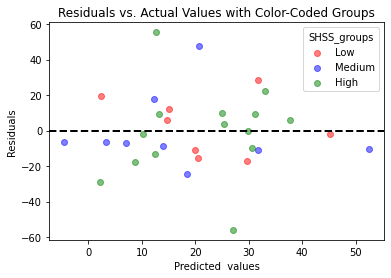

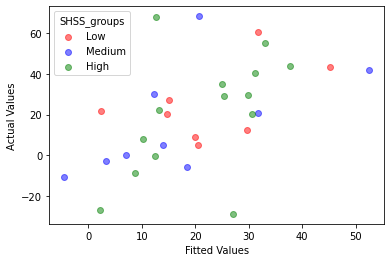

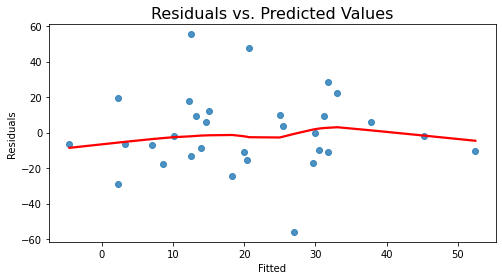

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


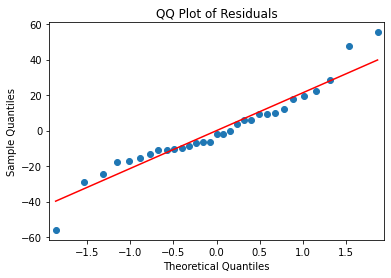

====== betweennessCent ======
====== Abs_diff_automaticity ======
(31, 12)
-----Model summary for all nodes of ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'], with betweennessCent metric estimation-----
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.448
Model:                            OLS   Adj. R-squared:                  0.080
Method:                 Least Squares   F-statistic:                     1.218
Date:                Fri, 17 Nov 2023   Prob (F-statistic):              0.343
Time:                        14:16:27   Log-Likelihood:                -134.54
No. Observations:                  31   AIC:                             295.1
Df Residuals:                      18   BIC:                             313.7
Df Model:                          12                                         
Covariance Type:            nonrobust                

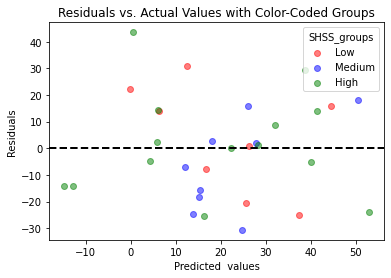

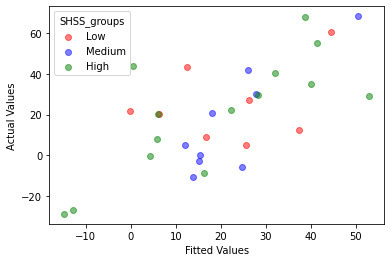

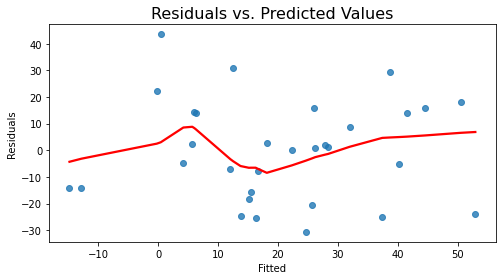

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


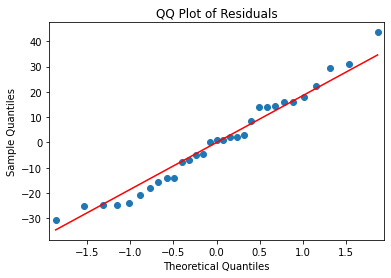

====== clustering ======
====== Abs_diff_automaticity ======
(31, 12)
-----Model summary for all nodes of ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'], with clustering metric estimation-----
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.308
Model:                            OLS   Adj. R-squared:                 -0.154
Method:                 Least Squares   F-statistic:                    0.6670
Date:                Fri, 17 Nov 2023   Prob (F-statistic):              0.760
Time:                        14:16:32   Log-Likelihood:                -138.05
No. Observations:                  31   AIC:                             302.1
Df Residuals:                      18   BIC:                             320.7
Df Model:                          12                                         
Covariance Type:            nonrobust                          

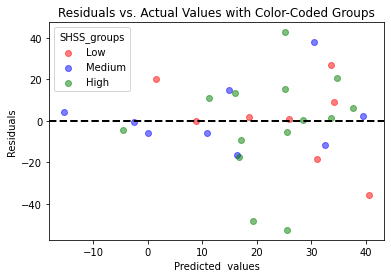

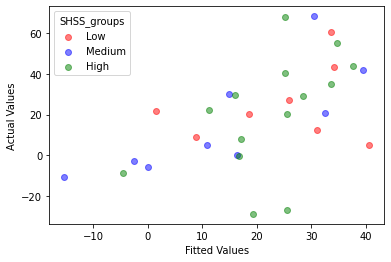

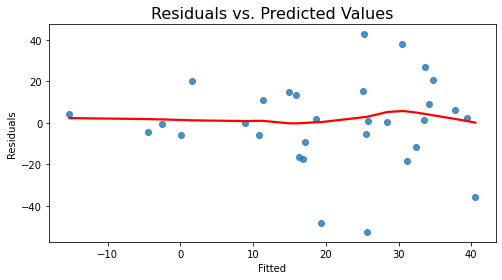

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


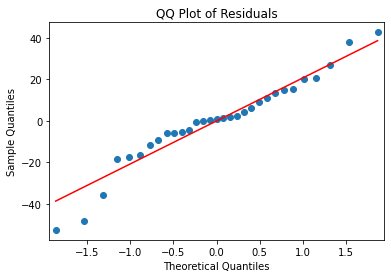

====== degree ======
====== Chge_hypnotic_depth ======
(31, 12)
-----Model summary for all nodes of ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'], with degree metric estimation-----
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.498
Model:                            OLS   Adj. R-squared:                  0.163
Method:                 Least Squares   F-statistic:                     1.487
Date:                Fri, 17 Nov 2023   Prob (F-statistic):              0.217
Time:                        14:16:34   Log-Likelihood:                -133.82
No. Observations:                  31   AIC:                             293.6
Df Residuals:                      18   BIC:                             312.3
Df Model:                          12                                         
Covariance Type:            nonrobust                                    

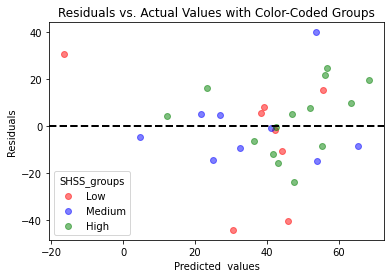

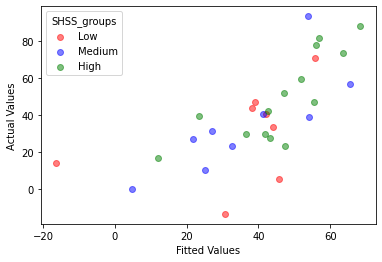

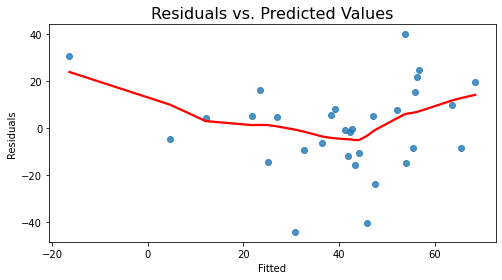

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


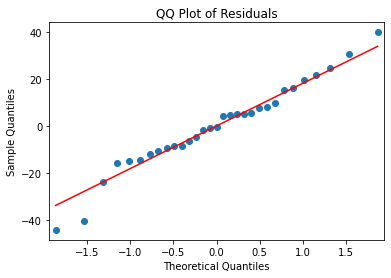

====== betweennessCent ======
====== Chge_hypnotic_depth ======
(31, 12)
-----Model summary for all nodes of ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'], with betweennessCent metric estimation-----
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.398
Model:                            OLS   Adj. R-squared:                 -0.003
Method:                 Least Squares   F-statistic:                    0.9931
Date:                Fri, 17 Nov 2023   Prob (F-statistic):              0.491
Time:                        14:16:37   Log-Likelihood:                -136.62
No. Observations:                  31   AIC:                             299.2
Df Residuals:                      18   BIC:                             317.9
Df Model:                          12                                         
Covariance Type:            nonrobust                  

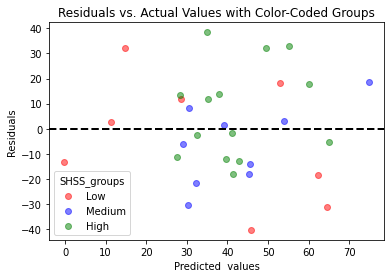

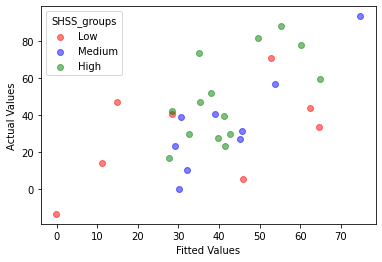

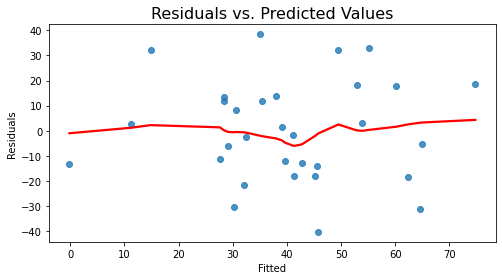

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


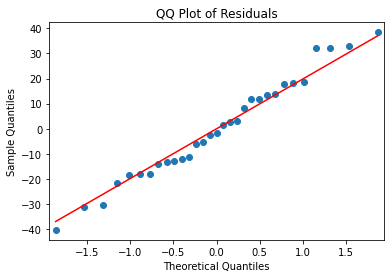

====== clustering ======
====== Chge_hypnotic_depth ======
(31, 12)
-----Model summary for all nodes of ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'], with clustering metric estimation-----
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.608
Model:                            OLS   Adj. R-squared:                  0.347
Method:                 Least Squares   F-statistic:                     2.330
Date:                Fri, 17 Nov 2023   Prob (F-statistic):             0.0510
Time:                        14:16:40   Log-Likelihood:                -129.96
No. Observations:                  31   AIC:                             285.9
Df Residuals:                      18   BIC:                             304.6
Df Model:                          12                                         
Covariance Type:            nonrobust                            

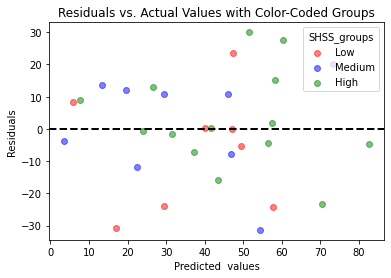

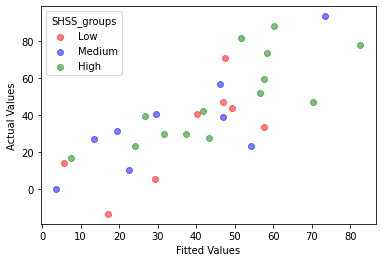

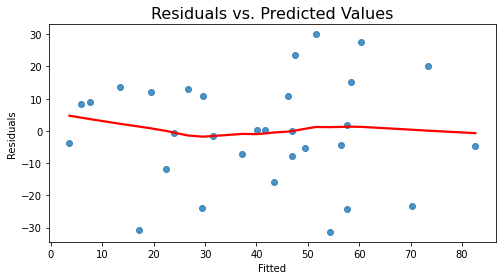

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


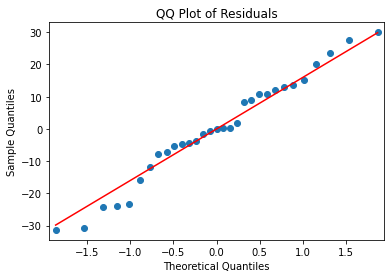

====== degree ======
====== raw_change_ANA ======
(31, 12)
-----Model summary for all nodes of ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'], with degree metric estimation-----
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.527
Model:                            OLS   Adj. R-squared:                  0.212
Method:                 Least Squares   F-statistic:                     1.674
Date:                Fri, 17 Nov 2023   Prob (F-statistic):              0.157
Time:                        14:16:42   Log-Likelihood:                -99.067
No. Observations:                  31   AIC:                             224.1
Df Residuals:                      18   BIC:                             242.8
Df Model:                          12                                         
Covariance Type:            nonrobust                                         

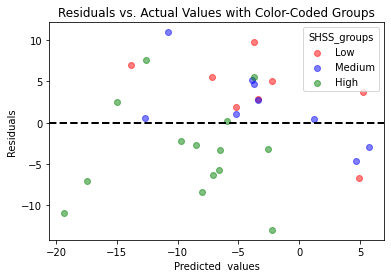

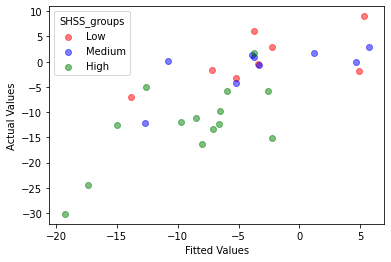

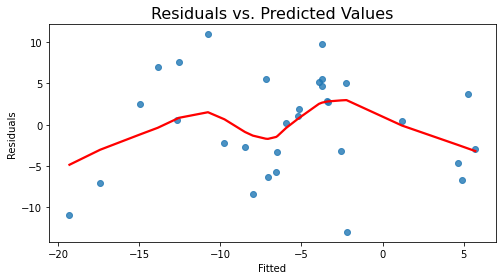

c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


KeyboardInterrupt: 

In [264]:
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.linear_model import Ridge
  
metric_names = ['degree', 'betweennessCent', 'clustering'] #: sig SHSS with DM ! 'closenessCent',
network_of_interest = ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual']
networks = yeo7id
y_name = 'SHSS_score'
print('======', network_of_interest, '======')
network_data_dict = dict()
pca_for_networks = []
networks_pca = dict()

for y_name in y_columns: 
    for metric_name in metric_names: #column in ['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER','Abs_diff_automaticity']: #  Y.columns[:-2]:
        print('======', metric_name, '======')
        y = np.array(Y[y_name]).astype('float64')
        df = gmetrics_dict['change_feat'][metric_name]
        print('======', y_name, '======')
        columns_with_networks = zip(df.columns, yeo7id)
        selected_columns = []
        pca = PCA(n_components=3, whiten=True)

        for i_net, network in enumerate(network_of_interest):
            #print('======', network, '======')
            net_columns = [col for i, col in enumerate(df) if np.array(yeo7id)[i] in network]
            df_network = pd.DataFrame(df[net_columns])
            network_data_dict[network] = df_network
            pca = pca.fit(df_network)
            transf = pca.transform(df_network)
            networks_pca[network] = transf
            pca_for_networks.append(pca)
            
        X = pd.DataFrame(np.hstack([networks_pca[network] for network in network_of_interest]))
        print(X.shape)
        X['constant'] = 1 #pd.sm.add_constant(np.array(X))
        model = sm.OLS(y, X).fit()
        
        xname = X.columns
        residuals = model.resid
        fitted = model.fittedvalues
        betas = model.params
        p_values = model.pvalues
        Y_pred = np.dot(X, betas)
        corrected_p_values = multipletests(p_values, method='fdr_bh')[1]
        
        # Plot regression summary
        print('-----Model summary for all nodes of {}, with {} metric estimation-----'.format(network_of_interest, metric_name))
        print(model.summary())
        print('Corrected p-values: ', corrected_p_values)

        check_assump = True
        if check_assump:

            legend_labels = ['Low', 'Medium', 'High']
            colors = ['red', 'blue', 'green']
            for i in range(3):
                indices = pd.to_numeric(Y['SHSS_groups']) == i
                #plt.scatter(y[indices], residuals[indices], label=legend_labels[i], c=colors[i], alpha=0.5, s=50)
                plt.scatter(Y_pred[pd.to_numeric(Y['SHSS_groups']) == i],np.array(residuals)[pd.to_numeric(Y['SHSS_groups']) == i], label=legend_labels[i], c=colors[i], alpha=0.5)
            plt.axhline(0, color='black', linestyle='--', linewidth=2)  # Add horizontal line at y=0
            plt.xlabel('Predicted  values')
            plt.ylabel('Residuals')
            plt.legend(title='SHSS_groups')
            plt.title('Residuals vs. Actual Values with Color-Coded Groups')
            plt.show()  

            for i in range(3):
                plt.scatter(Y_pred[pd.to_numeric(Y['SHSS_groups']) == i], y[pd.to_numeric(Y['SHSS_groups']) == i], label=legend_labels[i], c=colors[i], alpha=0.5)
            plt.xlabel('Fitted Values')
            plt.ylabel('Actual Values')
            plt.legend(title='SHSS_groups')
            plt.show()

            fig, ax = plt.subplots(1, 1, figsize=(8, 4))
            sns.regplot(
                x=fitted, y=residuals, lowess=True, ax=ax, line_kws={"color": "red"}
            )
            ax.set_title("Residuals vs. Predicted Values", fontsize=16)
            ax.set(xlabel="Fitted", ylabel="Residuals")
            plt.show()

                        # Add QQ plot
            qqplot(residuals, line='s', color='blue')
            plt.title("QQ Plot of Residuals")
            plt.show()


### 2.1 prediction with 1st component of each network

====== ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual'] ======
====== degree ======
====== SHSS_score ======
-----Salience (ventral Att.)-----
T-statistic for component: 0.8748, p = 0.3889
Explained variance ratio: 0.6046
Beta: 0.5687
R2: 0.0257
R2 adjusted: -0.0079
AIC: 168.6473
BIC: 171.5152
F-statistic p-value: 0.3889
T-statistic p-value: 0.3889
-----Central executive (control)-----
T-statistic for component: -0.5188, p = 0.6078
Explained variance ratio: 0.5935
Beta: -0.3402
R2: 0.0092
R2 adjusted: -0.0250
AIC: 169.1682
BIC: 172.0362
F-statistic p-value: 0.6078
T-statistic p-value: 0.6078
-----Default-----
T-statistic for component: 0.1557, p = 0.8773
Explained variance ratio: 0.4837
Beta: 0.1025
R2: 0.0008
R2 adjusted: -0.0336
AIC: 169.4287
BIC: 172.2967
F-statistic p-value: 0.8773
T-statistic p-value: 0.8773
-----Visual-----
T-statistic for component: 0.4929, p = 0.6258
Explained variance ratio: 0.6301
Beta: 0.3233
R2: 0.0083
R2 adjusted: -0.0259
AIC

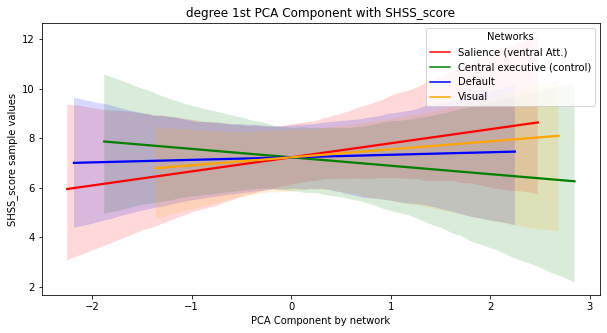

====== betweennessCent ======
====== SHSS_score ======
-----Salience (ventral Att.)-----
T-statistic for component: -1.0042, p = 0.3236
Explained variance ratio: 0.4838
Beta: -0.6502
R2: 0.0336
R2 adjusted: 0.0003
AIC: 168.3950
BIC: 171.2630
F-statistic p-value: 0.3236
T-statistic p-value: 0.3236
-----Central executive (control)-----
T-statistic for component: 0.1001, p = 0.9210
Explained variance ratio: 0.5701
Beta: 0.0659
R2: 0.0003
R2 adjusted: -0.0341
AIC: 169.4439
BIC: 172.3119
F-statistic p-value: 0.9210
T-statistic p-value: 0.9210
-----Default-----
T-statistic for component: 2.1832, p = 0.0373
Explained variance ratio: 0.3276
Beta: 1.3326
R2: 0.1412
R2 adjusted: 0.1115
AIC: 164.7373
BIC: 167.6053
F-statistic p-value: 0.0373
T-statistic p-value: 0.0373
-----Visual-----
T-statistic for component: -0.9870, p = 0.3318
Explained variance ratio: 0.2567
Beta: -0.6394
R2: 0.0325
R2 adjusted: -0.0009
AIC: 168.4304
BIC: 171.2984
F-statistic p-value: 0.3318
T-statistic p-value: 0.3318


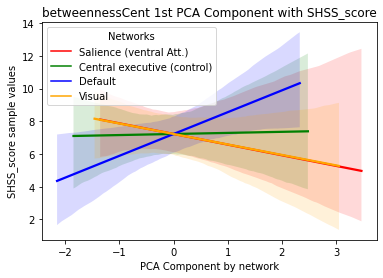

====== clustering ======
====== SHSS_score ======
-----Salience (ventral Att.)-----
T-statistic for component: 0.8920, p = 0.3797
Explained variance ratio: 0.5935
Beta: 0.5796
R2: 0.0267
R2 adjusted: -0.0069
AIC: 168.6156
BIC: 171.4836
F-statistic p-value: 0.3797
T-statistic p-value: 0.3797
-----Central executive (control)-----
T-statistic for component: -1.1750, p = 0.2496
Explained variance ratio: 0.5751
Beta: -0.7561
R2: 0.0454
R2 adjusted: 0.0125
AIC: 168.0129
BIC: 170.8808
F-statistic p-value: 0.2496
T-statistic p-value: 0.2496
-----Default-----
T-statistic for component: -0.9812, p = 0.3346
Explained variance ratio: 0.4691
Beta: -0.6358
R2: 0.0321
R2 adjusted: -0.0012
AIC: 168.4422
BIC: 171.3102
F-statistic p-value: 0.3346
T-statistic p-value: 0.3346
-----Visual-----
T-statistic for component: 1.5756, p = 0.1260
Explained variance ratio: 0.7076
Beta: 0.9960
R2: 0.0789
R2 adjusted: 0.0471
AIC: 166.9084
BIC: 169.7764
F-statistic p-value: 0.1260
T-statistic p-value: 0.1260


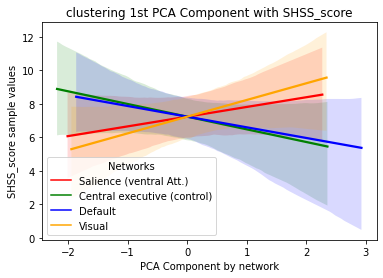

====== degree ======
====== Abs_diff_automaticity ======
-----Salience (ventral Att.)-----
T-statistic for component: -0.8108, p = 0.4241
Explained variance ratio: 0.6046
Beta: -3.7812
R2: 0.0222
R2 adjusted: -0.0116
AIC: 290.8077
BIC: 293.6757
F-statistic p-value: 0.4241
T-statistic p-value: 0.4241
-----Central executive (control)-----
T-statistic for component: 0.5314, p = 0.5992
Explained variance ratio: 0.5935
Beta: 2.4938
R2: 0.0096
R2 adjusted: -0.0245
AIC: 291.2023
BIC: 294.0703
F-statistic p-value: 0.5992
T-statistic p-value: 0.5992
-----Default-----
T-statistic for component: -0.2942, p = 0.7707
Explained variance ratio: 0.4837
Beta: -1.3855
R2: 0.0030
R2 adjusted: -0.0314
AIC: 291.4102
BIC: 294.2782
F-statistic p-value: 0.7707
T-statistic p-value: 0.7707
-----Visual-----
T-statistic for component: -0.1023, p = 0.9192
Explained variance ratio: 0.6301
Beta: -0.4825
R2: 0.0004
R2 adjusted: -0.0341
AIC: 291.4914
BIC: 294.3594
F-statistic p-value: 0.9192
T-statistic p-value: 0.919

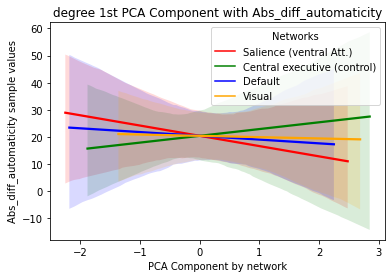

====== betweennessCent ======
====== Abs_diff_automaticity ======
-----Salience (ventral Att.)-----
T-statistic for component: 1.2050, p = 0.2379
Explained variance ratio: 0.4838
Beta: 5.5457
R2: 0.0477
R2 adjusted: 0.0148
AIC: 289.9880
BIC: 292.8560
F-statistic p-value: 0.2379
T-statistic p-value: 0.2379
-----Central executive (control)-----
T-statistic for component: 0.7994, p = 0.4306
Explained variance ratio: 0.5701
Beta: 3.7290
R2: 0.0216
R2 adjusted: -0.0122
AIC: 290.8270
BIC: 293.6949
F-statistic p-value: 0.4306
T-statistic p-value: 0.4306
-----Default-----
T-statistic for component: 0.4125, p = 0.6830
Explained variance ratio: 0.3276
Beta: 1.9396
R2: 0.0058
R2 adjusted: -0.0284
AIC: 291.3213
BIC: 294.1893
F-statistic p-value: 0.6830
T-statistic p-value: 0.6830
-----Visual-----
T-statistic for component: -0.1132, p = 0.9107
Explained variance ratio: 0.2567
Beta: -0.5337
R2: 0.0004
R2 adjusted: -0.0340
AIC: 291.4889
BIC: 294.3569
F-statistic p-value: 0.9107
T-statistic p-value: 0

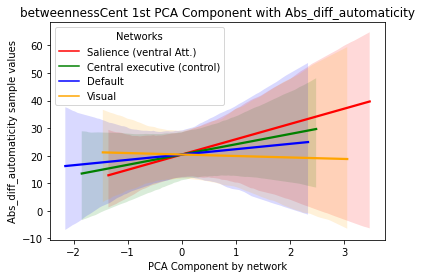

====== clustering ======
====== Abs_diff_automaticity ======
-----Salience (ventral Att.)-----
T-statistic for component: -0.3101, p = 0.7587
Explained variance ratio: 0.5935
Beta: -1.4601
R2: 0.0033
R2 adjusted: -0.0311
AIC: 291.4000
BIC: 294.2680
F-statistic p-value: 0.7587
T-statistic p-value: 0.7587
-----Central executive (control)-----
T-statistic for component: 0.4131, p = 0.6825
Explained variance ratio: 0.5751
Beta: 1.9426
R2: 0.0059
R2 adjusted: -0.0284
AIC: 291.3207
BIC: 294.1887
F-statistic p-value: 0.6825
T-statistic p-value: 0.6825
-----Default-----
T-statistic for component: -0.6160, p = 0.5427
Explained variance ratio: 0.4691
Beta: -2.8861
R2: 0.0129
R2 adjusted: -0.0211
AIC: 291.0997
BIC: 293.9677
F-statistic p-value: 0.5427
T-statistic p-value: 0.5427
-----Visual-----
T-statistic for component: 0.3515, p = 0.7278
Explained variance ratio: 0.7076
Beta: 1.6540
R2: 0.0042
R2 adjusted: -0.0301
AIC: 291.3709
BIC: 294.2388
F-statistic p-value: 0.7278
T-statistic p-value: 0.7

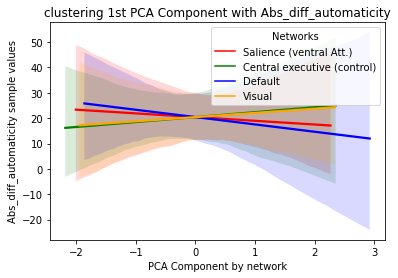

====== degree ======
====== Chge_hypnotic_depth ======
-----Salience (ventral Att.)-----
T-statistic for component: -0.8157, p = 0.4213
Explained variance ratio: 0.6046
Beta: -3.8953
R2: 0.0224
R2 adjusted: -0.0113
AIC: 292.2805
BIC: 295.1485
F-statistic p-value: 0.4213
T-statistic p-value: 0.4213
-----Central executive (control)-----
T-statistic for component: 1.4125, p = 0.1684
Explained variance ratio: 0.5935
Beta: 6.5991
R2: 0.0644
R2 adjusted: 0.0321
AIC: 290.9211
BIC: 293.7891
F-statistic p-value: 0.1684
T-statistic p-value: 0.1684
-----Default-----
T-statistic for component: -0.8743, p = 0.3891
Explained variance ratio: 0.4837
Beta: -4.1685
R2: 0.0257
R2 adjusted: -0.0079
AIC: 292.1770
BIC: 295.0450
F-statistic p-value: 0.3891
T-statistic p-value: 0.3891
-----Visual-----
T-statistic for component: -0.1312, p = 0.8965
Explained variance ratio: 0.6301
Beta: -0.6337
R2: 0.0006
R2 adjusted: -0.0339
AIC: 292.9653
BIC: 295.8332
F-statistic p-value: 0.8965
T-statistic p-value: 0.8965


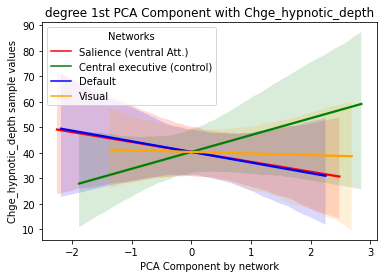

====== betweennessCent ======
====== Chge_hypnotic_depth ======
-----Salience (ventral Att.)-----
T-statistic for component: 0.3037, p = 0.7635
Explained variance ratio: 0.4838
Beta: 1.4645
R2: 0.0032
R2 adjusted: -0.0312
AIC: 292.8852
BIC: 295.7532
F-statistic p-value: 0.7635
T-statistic p-value: 0.7635
-----Central executive (control)-----
T-statistic for component: 1.6418, p = 0.1114
Explained variance ratio: 0.5701
Beta: 7.5850
R2: 0.0850
R2 adjusted: 0.0535
AIC: 290.2285
BIC: 293.0965
F-statistic p-value: 0.1114
T-statistic p-value: 0.1114
-----Default-----
T-statistic for component: 1.3427, p = 0.1898
Explained variance ratio: 0.3276
Beta: 6.2925
R2: 0.0585
R2 adjusted: 0.0261
AIC: 291.1140
BIC: 293.9820
F-statistic p-value: 0.1898
T-statistic p-value: 0.1898
-----Visual-----
T-statistic for component: 0.6153, p = 0.5432
Explained variance ratio: 0.2567
Beta: 2.9525
R2: 0.0129
R2 adjusted: -0.0212
AIC: 292.5816
BIC: 295.4496
F-statistic p-value: 0.5432
T-statistic p-value: 0.5432

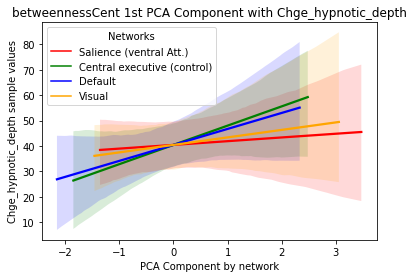

====== clustering ======
====== Chge_hypnotic_depth ======
-----Salience (ventral Att.)-----
T-statistic for component: -0.4378, p = 0.6648
Explained variance ratio: 0.5935
Beta: -2.1077
R2: 0.0066
R2 adjusted: -0.0277
AIC: 292.7794
BIC: 295.6474
F-statistic p-value: 0.6648
T-statistic p-value: 0.6648
-----Central executive (control)-----
T-statistic for component: 0.8019, p = 0.4291
Explained variance ratio: 0.5751
Beta: 3.8310
R2: 0.0217
R2 adjusted: -0.0120
AIC: 292.3038
BIC: 295.1717
F-statistic p-value: 0.4291
T-statistic p-value: 0.4291
-----Default-----
T-statistic for component: -0.5560, p = 0.5825
Explained variance ratio: 0.4691
Beta: -2.6712
R2: 0.0105
R2 adjusted: -0.0236
AIC: 292.6550
BIC: 295.5229
F-statistic p-value: 0.5825
T-statistic p-value: 0.5825
-----Visual-----
T-statistic for component: 0.7532, p = 0.4574
Explained variance ratio: 0.7076
Beta: 3.6028
R2: 0.0192
R2 adjusted: -0.0146
AIC: 292.3831
BIC: 295.2511
F-statistic p-value: 0.4574
T-statistic p-value: 0.457

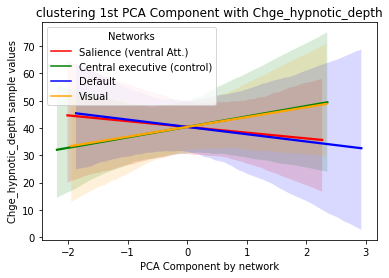

====== degree ======
====== raw_change_ANA ======
-----Salience (ventral Att.)-----
T-statistic for component: -0.9078, p = 0.3714
Explained variance ratio: 0.6046
Beta: -1.4529
R2: 0.0276
R2 adjusted: -0.0059
AIC: 224.5001
BIC: 227.3680
F-statistic p-value: 0.3714
T-statistic p-value: 0.3714
-----Central executive (control)-----
T-statistic for component: 0.6712, p = 0.5074
Explained variance ratio: 0.5935
Beta: 1.0810
R2: 0.0153
R2 adjusted: -0.0187
AIC: 224.8910
BIC: 227.7589
F-statistic p-value: 0.5074
T-statistic p-value: 0.5074
-----Default-----
T-statistic for component: -0.4398, p = 0.6634
Explained variance ratio: 0.4837
Beta: -0.7114
R2: 0.0066
R2 adjusted: -0.0276
AIC: 225.1628
BIC: 228.0307
F-statistic p-value: 0.6634
T-statistic p-value: 0.6634
-----Visual-----
T-statistic for component: -0.5267, p = 0.6024
Explained variance ratio: 0.6301
Beta: -0.8508
R2: 0.0095
R2 adjusted: -0.0247
AIC: 225.0736
BIC: 227.9416
F-statistic p-value: 0.6024
T-statistic p-value: 0.6024


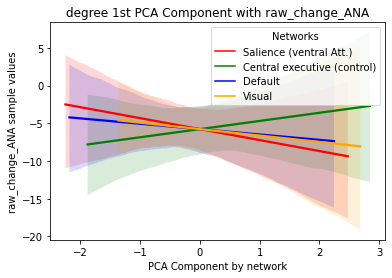

====== betweennessCent ======
====== raw_change_ANA ======
-----Salience (ventral Att.)-----
T-statistic for component: -0.1384, p = 0.8909
Explained variance ratio: 0.4838
Beta: -0.2246
R2: 0.0007
R2 adjusted: -0.0338
AIC: 225.3483
BIC: 228.2163
F-statistic p-value: 0.8909
T-statistic p-value: 0.8909
-----Central executive (control)-----
T-statistic for component: -0.9538, p = 0.3481
Explained variance ratio: 0.5701
Beta: -1.5243
R2: 0.0304
R2 adjusted: -0.0030
AIC: 224.4112
BIC: 227.2792
F-statistic p-value: 0.3481
T-statistic p-value: 0.3481
-----Default-----
T-statistic for component: -1.1109, p = 0.2757
Explained variance ratio: 0.3276
Beta: -1.7658
R2: 0.0408
R2 adjusted: 0.0077
AIC: 224.0768
BIC: 226.9448
F-statistic p-value: 0.2757
T-statistic p-value: 0.2757
-----Visual-----
T-statistic for component: 0.4614, p = 0.6480
Explained variance ratio: 0.2567
Beta: 0.7461
R2: 0.0073
R2 adjusted: -0.0269
AIC: 225.1421
BIC: 228.0100
F-statistic p-value: 0.6480
T-statistic p-value: 0.64

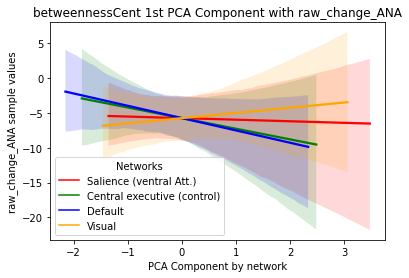

====== clustering ======
====== raw_change_ANA ======
-----Salience (ventral Att.)-----
T-statistic for component: -0.8644, p = 0.3944
Explained variance ratio: 0.5935
Beta: -1.3853
R2: 0.0251
R2 adjusted: -0.0085
AIC: 224.5801
BIC: 227.4481
F-statistic p-value: 0.3944
T-statistic p-value: 0.3944
-----Central executive (control)-----
T-statistic for component: 1.6698, p = 0.1057
Explained variance ratio: 0.5751
Beta: 2.5885
R2: 0.0877
R2 adjusted: 0.0563
AIC: 222.5230
BIC: 225.3910
F-statistic p-value: 0.1057
T-statistic p-value: 0.1057
-----Default-----
T-statistic for component: 0.8827, p = 0.3847
Explained variance ratio: 0.4691
Beta: 1.4138
R2: 0.0262
R2 adjusted: -0.0074
AIC: 224.5469
BIC: 227.4148
F-statistic p-value: 0.3847
T-statistic p-value: 0.3847
-----Visual-----
T-statistic for component: -0.9778, p = 0.3362
Explained variance ratio: 0.7076
Beta: -1.5615
R2: 0.0319
R2 adjusted: -0.0015
AIC: 224.3632
BIC: 227.2312
F-statistic p-value: 0.3362
T-statistic p-value: 0.3362


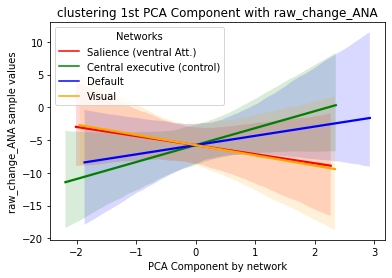

In [261]:
# Set a smaller figure size
from matplotlib.lines import Line2D

plt.figure(figsize=(10, 5))

metric_names = ['degree', 'betweennessCent', 'clustering'] #: sig SHSS with DM ! 'closenessCent',
network_of_interest = ['Salience (ventral Att.)', 'Central executive (control)', 'Default']
pca_pred_networks = ['Salience (ventral Att.)', 'Central executive (control)', 'Default', 'Visual']
networks = yeo7id

print('======', pca_pred_networks, '======')
for y_name in y_columns: 
    for metric_name in metric_names: #column in ['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER','Abs_diff_automaticity']: #  Y.columns[:-2]:
        print('======', metric_name, '======')
        y = np.array(Y[y_name]).astype('float64')
        df = gmetrics_dict['change_feat'][metric_name]
        print('======', y_name, '======')
        columns_with_networks = zip(df.columns, networks)
        selected_columns = []

        #for column, tag in columns_with_networks:
            #if tag in network_of_interest:
                #selected_columns.append(column)
        #selected_df = df[selected_columns]   
        
        # Pca on each networks
        pca = PCA(n_components=1, whiten=True)
        colors = ['red', 'green', 'blue', 'orange']
        #colors = cm.rainbow(np.linspace(0, 1, len(network_of_interest)))
        correlation_coefficients = dict()
        dict_pca_networks = dict()

        for i_net, network in enumerate(pca_pred_networks):
            net_columns = [col for i, col in enumerate(df) if np.array(yeo7id)[i] in network]
            selected_columns += net_columns
            pca_component = pca.fit_transform(df[net_columns])
            dict_pca_networks[network] = list(pca_component)
            pca_model = sm.OLS(y, sm.add_constant(pca_component)).fit()
            feat_name = [network]
            feat_name.insert(0, 'Constant')
            residuals = pca_model.resid
            fitted = pca_model.fittedvalues
            betas = pca_model.params
            p_values = pca_model.pvalues
            Y_pred = np.dot(sm.add_constant(pca_component), betas)

            #plt.scatter(pca_component, y, color=colors[i_net], label=network)
            sns.regplot(x=pca_component.flatten(), y=y, color=colors[i_net], scatter=False, ax=plt.gca())
            print('-----{}-----'.format(network))
            print('T-statistic for component: {:.4f}, p = {:.4f}'.format(pca_model.tvalues[1], pca_model.pvalues[1]))
            print('Explained variance ratio: {:.4f}'.format(pca.explained_variance_ratio_[0]))
            print('Beta: {:.4f}'.format(betas[1]))
            print('R2: {:.4f}'.format(pca_model.rsquared))
            print('R2 adjusted: {:.4f}'.format(pca_model.rsquared_adj))
            print('AIC: {:.4f}'.format(pca_model.aic))
            print('BIC: {:.4f}'.format(pca_model.bic))
            print('F-statistic p-value: {:.4f}'.format(pca_model.f_pvalue))
            print('T-statistic p-value: {:.4f}'.format(pca_model.pvalues[1]))
            print('=====================================')

        legend_elements = [Line2D([0], [0], color=colors[i], label=network) for i, network in enumerate(pca_pred_networks)]
        plt.legend(handles=legend_elements, title='Networks', labels=pca_pred_networks)
        #plt.legend(title='Networks', labels=pca_pred_networks)
        plt.xlabel('PCA Component by network')
        plt.ylabel('{} sample values'.format(y_name))
        plt.title(f'{metric_name} 1st PCA Component with {y_name}')
        plt.show()
        

    

        

In [ ]:
### 2. 

Connectivity matrix


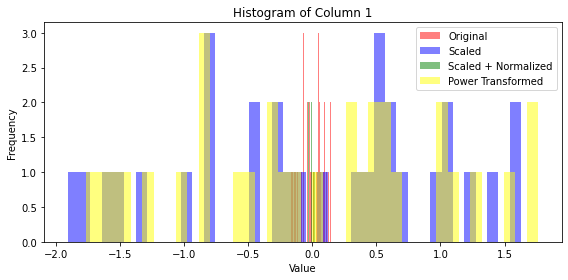

Degree


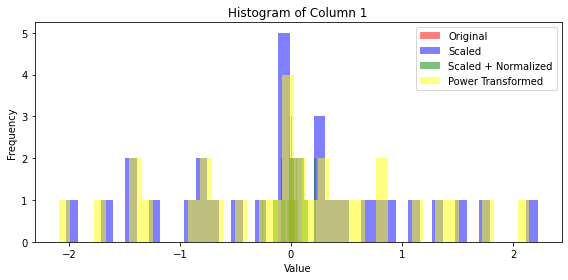

Degree_centrality


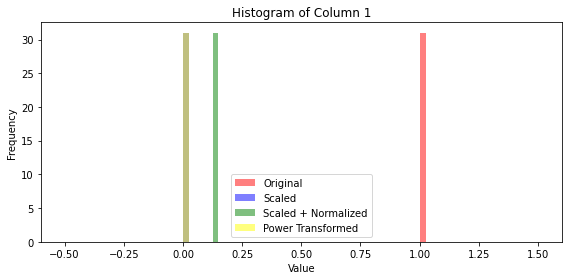

Closeness centrality


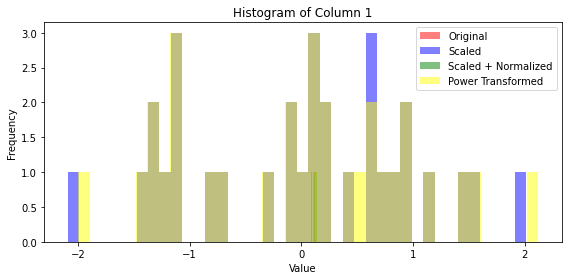

Betweenness centrality


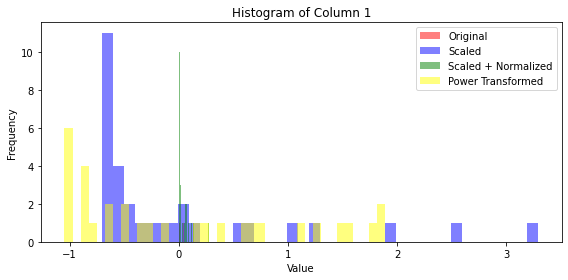

Clustering


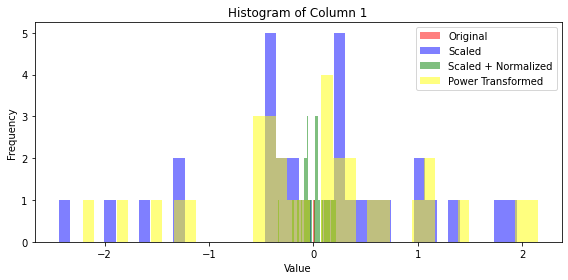

In [596]:
# Distribution of graph features

for features_matrix, g_metric in zip([X_con, X_degree,X_degreeCentrality, X_closeness, X_betweenness, X_clustering], ['Connectivity matrix', 'Degree','Degree_centrality', 'Closeness centrality', 'Betweenness centrality', 'Clustering']):
    print('================ \n{}\n================'.format(g_metric))
    
    
    feature_matrix = np.mean(feature_matrices,axis=0).reshape(-1, 1)
    # Scaling and normalization
    scaled_features_matrix = StandardScaler().fit_transform(features_matrix)
    normalized_features_matrix = normalize(features_matrix)#Pipeline([('scaler', StandardScaler()), ('norm', normalize())]).fit_transform(features_matrix)
    power_transformed_matrix = PowerTransformer().fit_transform(features_matrix)
    powerScaled_features_matrix = StandardScaler().fit_transform(power_transformed_matrix)
    # Plot settings
    num_columns = concatenated_matrices.shape[1]
    fig, axes = plt.subplots(nrows=num_columns, ncols=1, figsize=(8, 4 * num_columns))
    colors = ['red', 'blue', 'green', 'yellow']

    # Plot each column's distributions
    i=0
    ax = axes#[i]
    column_data = features_matrix[:, i]
    ax.hist(column_data, bins=40, color=colors[0], alpha=0.5, label='Original')
    ax.hist(scaled_features_matrix[:, i], bins=40, color=colors[1], alpha=0.5, label='Scaled')
    ax.hist(normalized_features_matrix[:, i], bins=40, color=colors[2], alpha=0.5, label='Scaled + Normalized')
    ax.hist(power_transformed_matrix[:, i], bins=40, color=colors[3], alpha=0.5, label='Power Transformed')

    ax.set_title(f"Histogram of Column {i + 1}")
    ax.set_xlabel("Value")
    ax.set_ylabel("Frequency")
    ax.legend()

    plt.tight_layout()
    plt.show()


### 3. Cross validation regressions

In [266]:
gmetrics_dict.keys()

dict_keys(['pre', 'post', 'change', 'pre_metrics', 'post_metrics', 'change_feat', 'Y'])

In [54]:
# Imports 
from sklearn.cross_decomposition import PLSRegression
from scipy.stats import pearsonr
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.decomposition import PCA, SparsePCA, FastICA
from sklearn.model_selection import ShuffleSplit, GridSearchCV, KFold, StratifiedKFold, StratifiedShuffleSplit
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, QuantileTransformer, PowerTransformer
from sklearn.linear_model import Ridge, Lasso, LinearRegression
from sklearn.linear_model import RidgeCV
from statsmodels.stats.multitest import fdrcorrection
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline


In [65]:
y_columns
network_of_interest
metric_names = ['degree', 'betweennessCent', 'clustering'] #: sig SHSS with DM ! 'closenessCent',
network_of_interest = ['Salience (ventral Att.)', 'Central executive (control)', 'Default'] #, 'Visual']

degree
====== Salience (ventral Att.) ======
====== Central executive (control) ======
====== Default ======
True
====== ['Salience (ventral Att.)', 'Central executive (control)', 'Default'] ======
--- SHSS_score ---
Permutation test for r2 and RMSE values: p=0.3333 and 0.3333 and Pearson R : -0.1020 (0.5820)


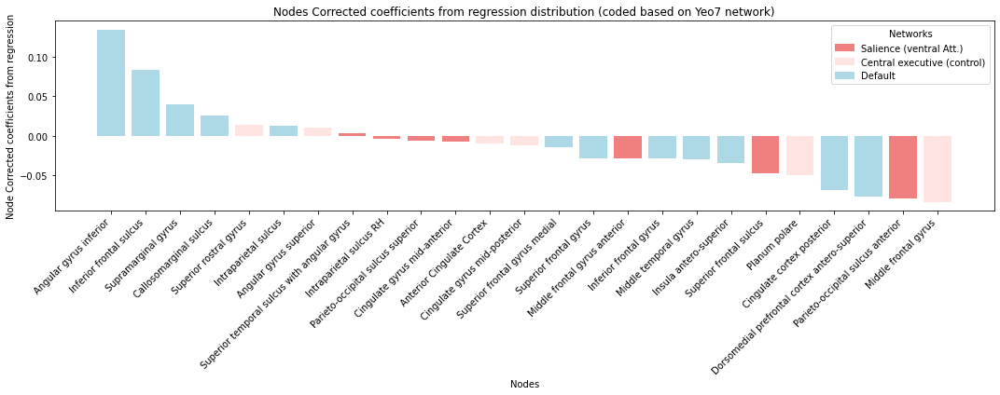

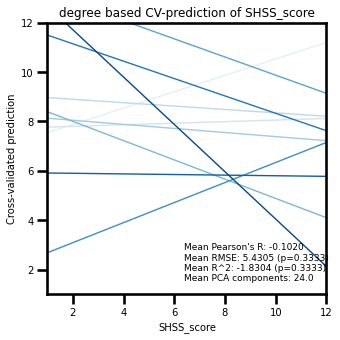

--- Abs_diff_automaticity ---
Permutation test for r2 and RMSE values: p=0.8333 and 0.5000 and Pearson R : -0.0103 (0.5366)


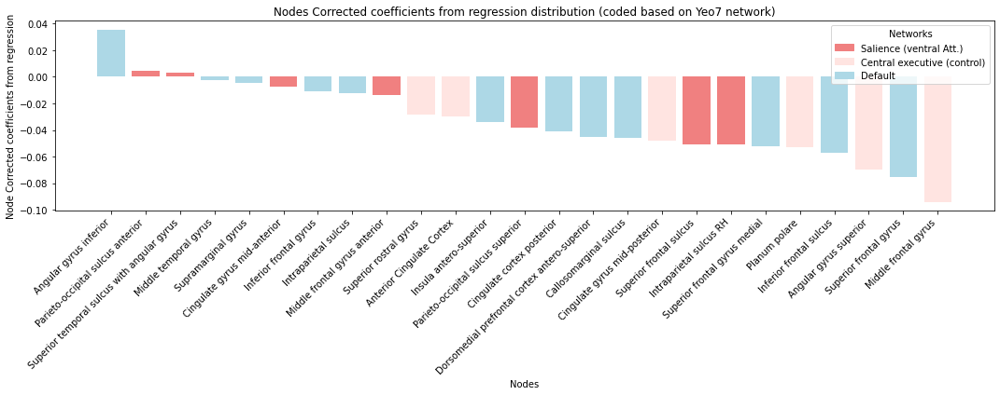

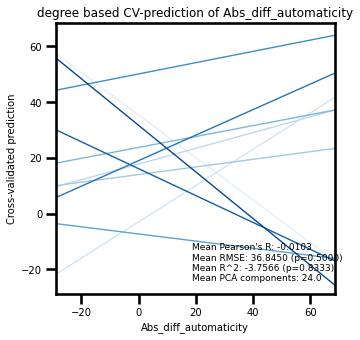

--- Chge_hypnotic_depth ---
Permutation test for r2 and RMSE values: p=0.3333 and 0.1667 and Pearson R : 0.2921 (0.4016)


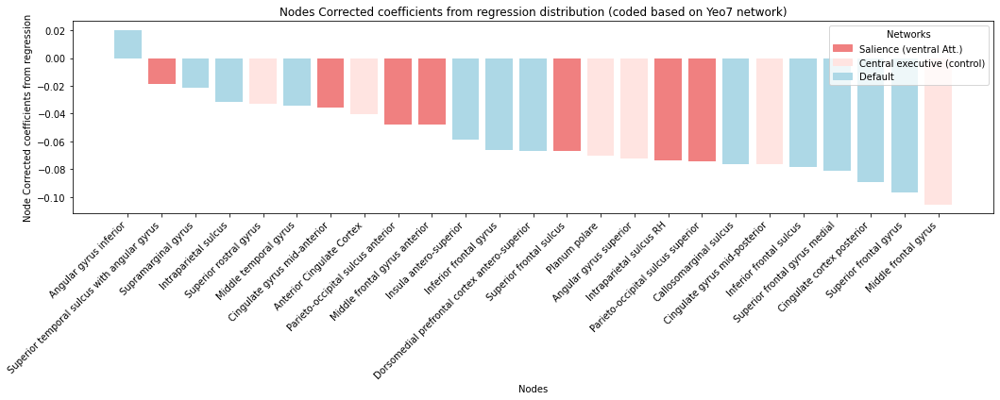

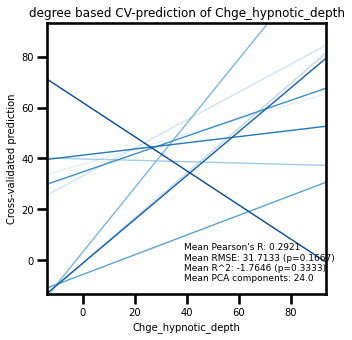

--- raw_change_ANA ---
Permutation test for r2 and RMSE values: p=0.1667 and 0.1667 and Pearson R : 0.1343 (0.5298)


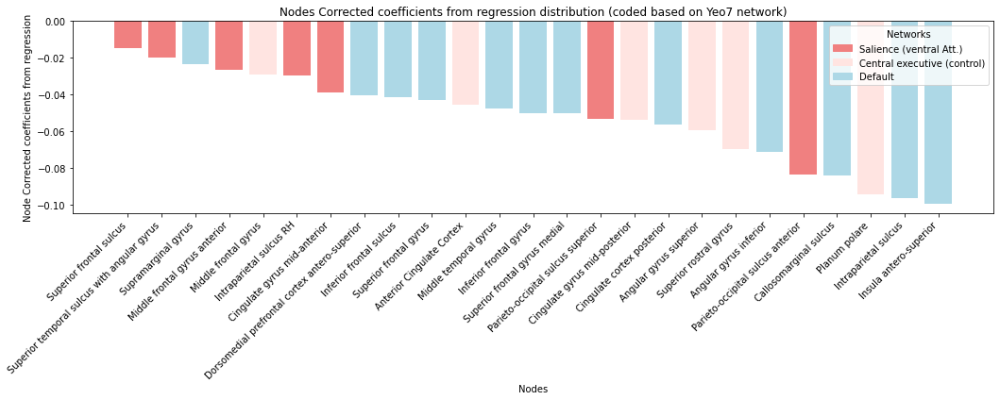

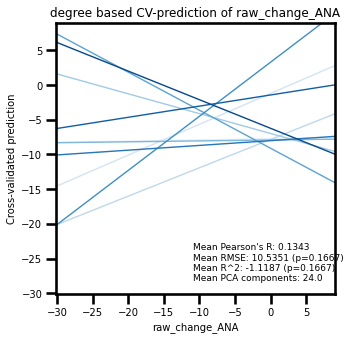

betweennessCent
====== Salience (ventral Att.) ======
====== Central executive (control) ======
====== Default ======
True
====== ['Salience (ventral Att.)', 'Central executive (control)', 'Default'] ======
--- SHSS_score ---
Permutation test for r2 and RMSE values: p=0.8333 and 1.0000 and Pearson R : -0.2962 (0.5535)


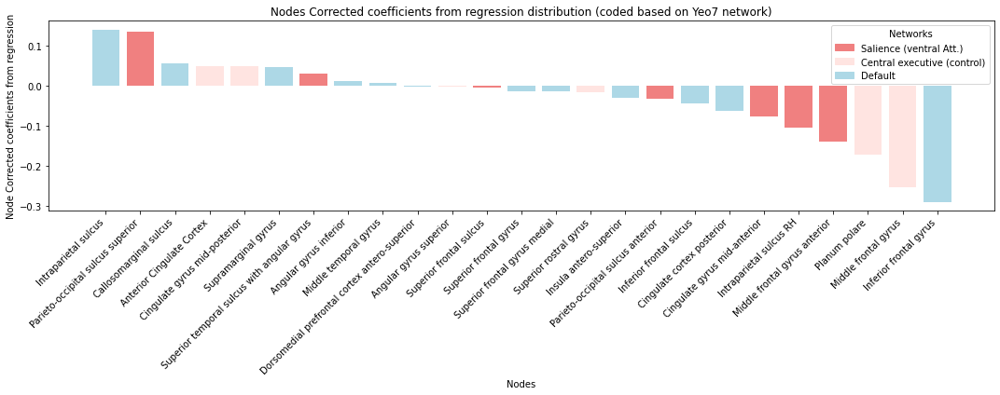

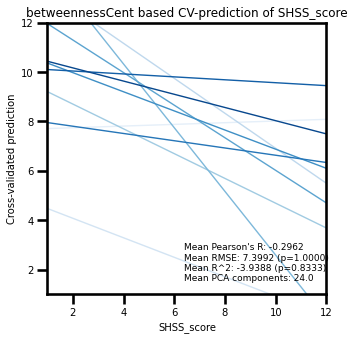

--- Abs_diff_automaticity ---
Permutation test for r2 and RMSE values: p=0.6667 and 0.6667 and Pearson R : -0.1899 (0.4769)


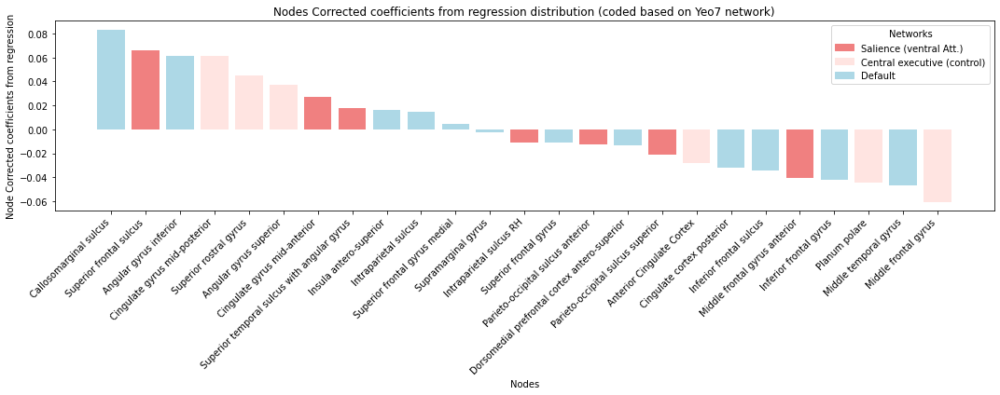

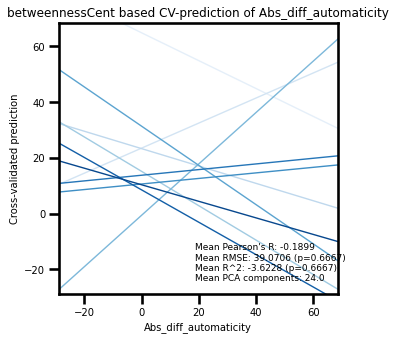

--- Chge_hypnotic_depth ---
Permutation test for r2 and RMSE values: p=0.6667 and 0.5000 and Pearson R : 0.0171 (0.4180)


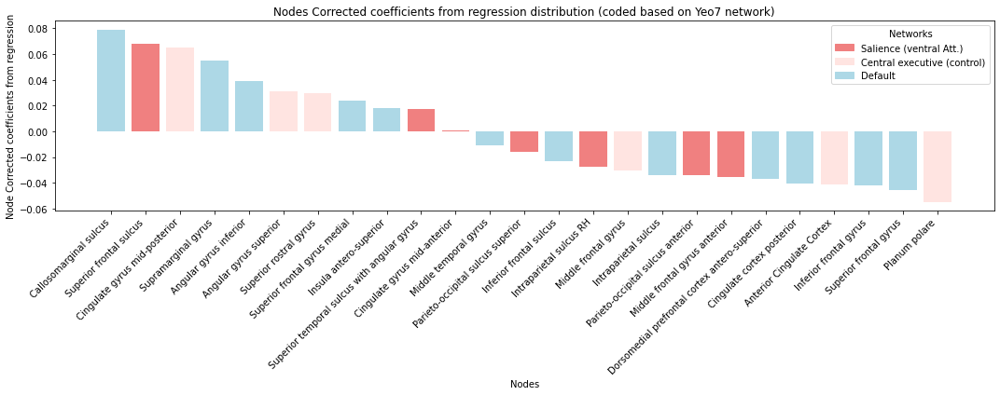

KeyboardInterrupt: 

In [262]:
def reg_plot_performance(y_test, y_pred, y_name, mean_pearson_r, mean_rmse, mean_r2, mean_r2_pval,rmse_p_value, mean_comp, title='', path_output='', filename='regplot'):
    """
    Plot the regression plot associated with the model performance. One regression line will be plotted per fold.

    Parameters
    ----------
    y_test: list
        list containing the values of y in the test set for each fold
    y_pred: list
        list containing the values of the predicted y for each fold
    y_name: string
        name of the target variable (Y-axis label)
    mean_pearson_r: float
        mean Pearson's R value
    mean_rmse: float
        mean RMSE value
    mean_r2: float
        mean R^2 value
    mean_r2_pval: float
        mean p-value for R^2
    rmse_p_value : float
        mean p-value for RMSE
    mean_comp: float
        mean number of components
    path_output: string
        path for saving the output
    filename: string
        name of the output file

    Code adapted from https://github.com/mpcoll/coll_painvalue_2021/tree/main/figures
    """
    import matplotlib.ticker as ticker

    blue_palette_10 = sns.color_palette("Blues", 10)
    fig1, ax1 = plt.subplots(figsize=(5, 5))
    ax1.set_xlim([min([min(y) for y in y_test]), max([max(y) for y in y_test])])
    ax1.set_ylim([min([min(y) for y in y_test]), max([max(y) for y in y_test])])
    for idx, elem in enumerate(y_test):
        df = pd.DataFrame(list(zip(elem, y_pred[idx])), columns=['Y_true', 'Y_pred'])
        sns.regplot(data=df, x='Y_true', y='Y_pred',
                    ci=None, scatter=False, color=blue_palette_10[idx],
                    ax=ax1, line_kws={'linewidth': 1.4}, truncate=False)
        ax1.xaxis.set_major_locator(ticker.AutoLocator())
        ax1.yaxis.set_major_locator(ticker.AutoLocator())
    plt.xlabel(y_name)
    plt.ylabel('Cross-validated prediction')
    for axis in ['top', 'bottom', 'left', 'right']:
        ax1.spines[axis].set_linewidth(2.6)
    ax1.tick_params(width=2.6, direction='out', length=10)
    plt.title(title)

    # Add metrics at the bottom
    metrics_text = f"Mean Pearson's R: {mean_pearson_r:.4f}\nMean RMSE: {mean_rmse:.4f} (p={rmse_p_value:.4f})\nMean R^2: {mean_r2:.4f} (p={mean_r2_pval:.4f})\nMean PCA components: {mean_comp}"
    plt.text(0.49, 0.05, metrics_text, ha='left', transform=ax1.transAxes, fontsize=  9)

    plt.show()


from sklearn.model_selection import permutation_test_score
from sklearn.model_selection import KFold, GroupShuffleSplit
def compute_permutation(X, y, pipeline,gr=None,cv = None, n_components=0.80, n_permutations=5000, scoring="r2", random_seed=40):
    """
    Compute the permutation test for a specified metric (r2 by default)
    Apply the PCA after the splitting procedure

    Parameters
    ----------
    X: predictive variable
    y: predicted variable
    n_components: number of components to keep for the PCA
    n_permutations: number of permuted iteration
    scoring: scoring strategy
    random_seed: controls the randomness

    Returns
    ----------
    score (float): true score
    perm_scores (ndarray): scores for each permuted samples
    pvalue (float): probability that the true score can be obtained by chance

    See also scikit-learn permutation_test_score documentation
    """
    if gr == None and cv == None:
        cv = kf = KFold(n_splits=5, random_state=random_seed, shuffle=True)
 #ShuffleSplit(n_splits = 5, test_size = 0.3, random_state = random_seed)
    elif gr != None and cv == None:     
        cv = GroupShuffleSplit(n_splits = 5, test_size = 0.3, random_state = random_seed)
    
    score, perm_scores, pvalue = permutation_test_score(estimator=pipeline, X=X, y=y, scoring=scoring, cv=cv, n_permutations=n_permutations, random_state=random_seed)
    
    return score, perm_scores, pvalue

#def networks_regression_cv(graph_dict,network_of_interest,networks_id, Y, target_columns,atlas_labels,yeo7id,  exclude_keys = [], rdm_seed=40)
rdm_seed=0
networks_id = yeo7id
graph_dict = gmetrics_dict['change_feat']
#change_gmetrics,network_of_interest,networks, Y, Y.columns[:-2],atlas_labels, yeo7id, exclude_keys = [], rdm_seed=40)  
mean_metrics = []
out_dict = dict()
random_seed = rdm_seed

for metrics_name in metric_names:
    print("================ \n{}\n================".format(metrics_name))
    # Prep dataframe with std scaler
    df = graph_dict[metrics_name]
    roi_with_networks = zip(df.columns, networks_id)
    # Filter out the columns that don't have the network tag
    selected_columns = []
    
    for i_net, network in enumerate(network_of_interest):
        print('======', network, '======')
        net_columns = [col for i, col in enumerate(df) if np.array(yeo7id)[i] in network]
        #selected_network_id. = [(yeo7id)[i] for i, col in enumerate(df) if np.array(yeo7id)[i] in network]
        selected_columns += net_columns
        
    selected_network_id = [(yeo7id)[i] for i, col in enumerate(df) if col in selected_columns]
    print(selected_network_id == [(yeo7id)[i] for i, col in enumerate(df) if (yeo7id)[i] in network_of_interest])
    
    rawfeatures_matrix = df[selected_columns] #np.array(df[selected_columns]).astype('float64')
    
    prePipeline = Pipeline([("scaler", StandardScaler())])
    features_matrix = prePipeline.fit_transform(rawfeatures_matrix)
    pipeline = Pipeline([("pca", PCA()), ("reg", Ridge(alpha=1.0))])
    # cv = KFold(n_splits=5, random_state=random_seed, shuffle=True)
    cv = ShuffleSplit(n_splits=10, test_size=0.20, random_state=random_seed)
    print('======', network_of_interest, '======')
    result_per_col = dict() # dict to store results for each dependent var.
    for target_column in y_columns:
        print(f"--- {target_column} ---")
        y_preds = []
        y_tests = []
        y = Y[target_column].values

        pearson_r_scores = []
        pval_pearsonr_scores = []
        r2_scores = []
        mse_scores = []
        rmse_scores = []
        n_components = []
        all_coefficients = []

        for train_index, test_index in cv.split(features_matrix):
            # Split the data into train and test sets based on the current fold
            X_train, X_test = (
                features_matrix[train_index],
                features_matrix[test_index],
            )
            y_train, y_test = y[train_index], y[test_index]
            # Fit pipeline model with best hyperparameters
            pipeline.fit(X_train, y_train)
            y_pred = pipeline.predict(X_test)
            y_preds.append(y_pred)
            y_tests.append(y_test)

            # Calculate evaluation metrics
            pearson_r, pval_pearsonr = pearsonr(y_test, y_pred)
            r2 = r2_score(y_test, y_pred)
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)
            cov_x = np.cov(
                pipeline.named_steps["pca"]
                .transform(X_test)
                .transpose()
                .astype(np.float64)
            )
            cov_y = np.cov(y_test.transpose().astype(np.float64))

            # Append metrics to the respective lists
            pearson_r_scores.append(pearson_r)
            pval_pearsonr_scores.append(pval_pearsonr)
            r2_scores.append(r2)
            mse_scores.append(mse)
            rmse_scores.append(rmse)
            n_components.append(pipeline.named_steps["pca"].n_components_)
            coefficients = pipeline.named_steps["reg"].coef_

            # correction from Eqn 6 (Haufe et al., 2014)
            corr_coeffs = np.matmul(cov_x, coefficients.transpose()) * (1 / cov_y)
            all_coefficients.append(
                pipeline.named_steps["pca"].inverse_transform(
                    corr_coeffs.transpose()
                )
            )

        # Permutation tests
        r2score, _, r2p_value = compute_permutation(
            features_matrix,
            y,
            pipeline,
            n_permutations=5,
            cv=cv,
            scoring="r2",
            random_seed=random_seed
        )
        rmse_score, _, rmse_p_value = compute_permutation(
            features_matrix,
            y,
            pipeline,
            n_permutations= 5,
            cv=cv,
            scoring="neg_root_mean_squared_error",
            random_seed=random_seed
        )
        # Calculate mean metrics across all folds
        mean_pearson_r = np.mean(pearson_r_scores)
        mean_pval_pearsonr = np.mean(pval_pearsonr_scores)
        mean_r2 = np.mean(r2_scores)
        mean_mse = np.mean(mse_scores)
        mean_rmse = np.mean(rmse_scores)
        mean_n_components = np.mean(n_components)

        # print(f"Mean pca comp: p={r2p_value:.4f}")
        print(
            f"Permutation test for r2 and RMSE values: p={r2p_value:.4f} and {rmse_p_value:.4f} and Pearson R : {mean_pearson_r:.4f} ({mean_pval_pearsonr:.4f})"
        )

        # Sort the nodes based on values (highest to lowest)
        mean_coeffs =  np.mean(all_coefficients, axis=0) 
        sorted_triplet = sorted(zip(mean_coeffs.ravel(), selected_columns, selected_network_id), reverse=True)
        sorted_mean_metrics, sorted_nodes, sorted_yeo7id = zip(*sorted_triplet)
        sorted_colors = [network_colors[network] for network in sorted_yeo7id] # list all colors for each node
        
        #renamed_networks = [full_nw_names[tag] for tag in network_colors] # rename the keys/network from 'Cont' to 'control'
        #def plot_distribution(mean_vector, nodes, colors, networks, metric_name):
        plot_distribution(sorted_mean_metrics, sorted_nodes, sorted_colors, network_of_interest, metric_name='Corrected coefficients from regression')

        plot_title = f"{metrics_name} based CV-prediction of {target_column}"
        reg_plot_performance(
            y_tests,
            y_preds,
            target_column,
            mean_pearson_r,
            mean_rmse,
            mean_r2,
            r2p_value,
            rmse_p_value,
            mean_n_components,
            title=plot_title,
            )

        mean_metrics.append((mean_rmse, mean_mse, mean_r2, mean_pearson_r))

        result_per_col[target_column] = {
            "plot_title": plot_title,
            "CV_mse": mse_scores,
            "CV_rmse": rmse_scores,
            "CV_r2": r2_scores,
            "CV_pearson_r": pearson_r_scores,
            "pca_n_components": n_components,
            "r2p_value": r2p_value,
            "rmse_p_value": rmse_p_value,
            "y_preds": y_preds,
            "y_tests": y_tests,
            "corr_coeffs": all_coefficients,
        }

    out_dict[metrics_name] = result_per_col
    #return out_dict


SVR predictions 

### Classification

In [52]:
Y.columns

Index(['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER',
       'total_chge_pain_hypAna', 'Chge_hypnotic_depth',
       'Mental_relax_absChange', 'Automaticity_post_ind',
       'Abs_diff_automaticity', 'SHSS_groups', 'auto_groups'],
      dtype='object')

degree
====== ['SalVentAttnA', 'ContA', 'DefaultB', 'VisCent'] ======
--- auto_groups ---
[[0 1 0]
 [0 4 0]
 [1 1 0]]
0.5714285714285714
[[0 0 0]
 [0 3 3]
 [0 0 1]]
0.5714285714285714
[[0 4 0]
 [0 1 0]
 [1 0 1]]
0.2857142857142857
[[0 2 0]
 [1 1 1]
 [0 1 1]]
0.2857142857142857
[[1 2 0]
 [0 3 1]
 [0 0 0]]
0.5714285714285714
Mean Specificity: nan
Mean Sensitivity: nan
Mean Accuracy: 0.45714285714285713


c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


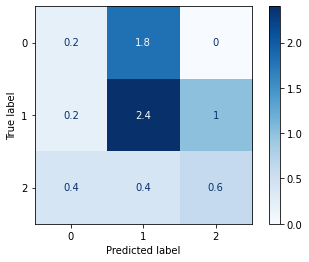

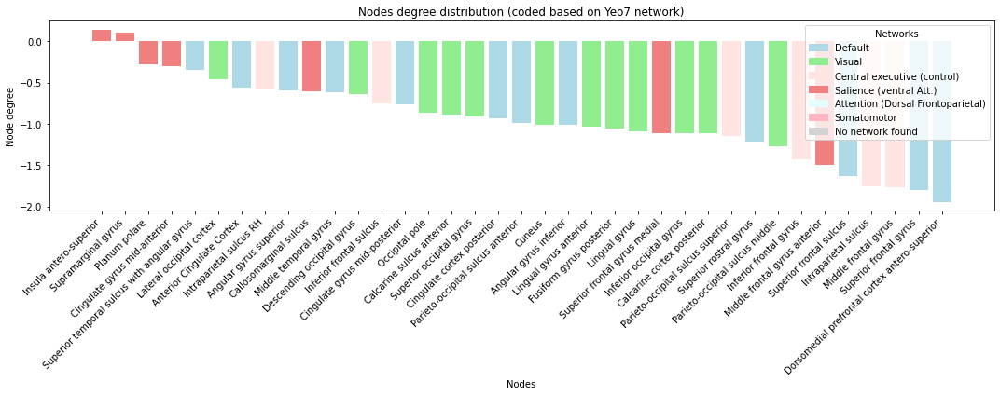

closenessCent
====== ['SalVentAttnA', 'ContA', 'DefaultB', 'VisCent'] ======
--- auto_groups ---
[[0 1 0]
 [1 3 0]
 [1 1 0]]
0.42857142857142855
[[0 0 0]
 [2 4 0]
 [0 0 1]]
0.7142857142857143
[[0 4 0]
 [0 1 0]
 [1 1 0]]
0.14285714285714285
[[0 2 0]
 [0 3 0]
 [0 1 1]]
0.5714285714285714
[[0 3 0]
 [0 4 0]
 [0 0 0]]
0.5714285714285714
Mean Specificity: nan
Mean Sensitivity: nan
Mean Accuracy: 0.48571428571428565


c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


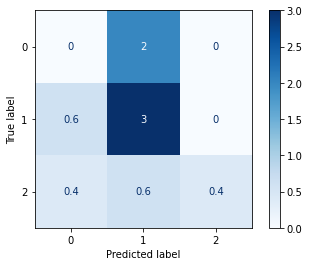

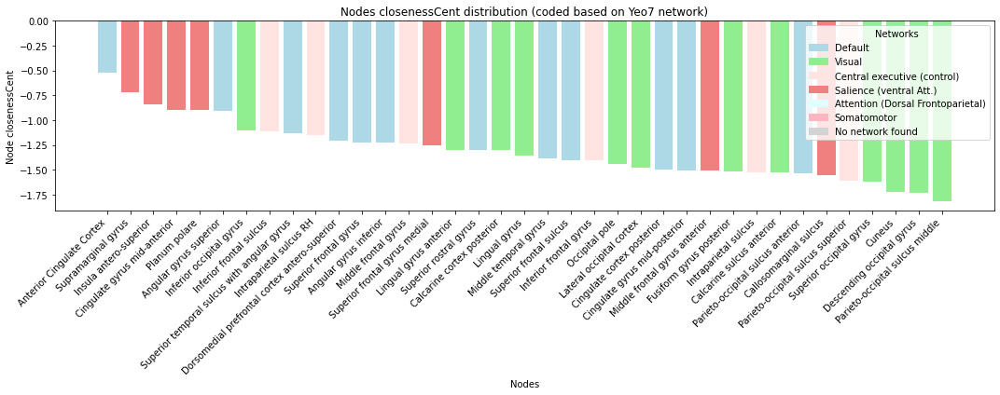

betweennessCent
====== ['SalVentAttnA', 'ContA', 'DefaultB', 'VisCent'] ======
--- auto_groups ---
[[0 1 0]
 [0 2 2]
 [0 2 0]]
0.2857142857142857
[[0 0 0]
 [2 2 2]
 [1 0 0]]
0.2857142857142857
[[0 3 1]
 [0 1 0]
 [0 2 0]]
0.14285714285714285
[[2 0 0]
 [1 2 0]
 [1 1 0]]
0.5714285714285714
[[2 1 0]
 [0 2 2]
 [0 0 0]]
0.5714285714285714
Mean Specificity: nan
Mean Sensitivity: nan
Mean Accuracy: 0.3714285714285714


c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


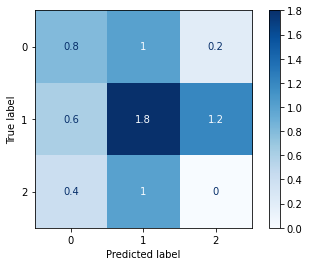

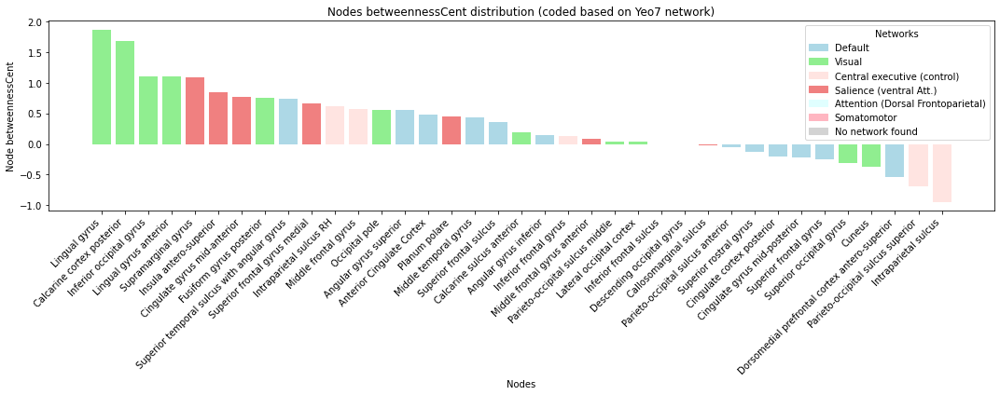

clustering
====== ['SalVentAttnA', 'ContA', 'DefaultB', 'VisCent'] ======
--- auto_groups ---
[[0 1 0]
 [1 3 0]
 [0 2 0]]
0.42857142857142855
[[0 0 0]
 [2 2 2]
 [0 1 0]]
0.2857142857142857
[[1 3 0]
 [0 1 0]
 [0 2 0]]
0.2857142857142857
[[0 2 0]
 [1 2 0]
 [1 1 0]]
0.2857142857142857
[[1 2 0]
 [0 1 3]
 [0 0 0]]
0.2857142857142857
Mean Specificity: nan
Mean Sensitivity: nan
Mean Accuracy: 0.3142857142857142


c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\Dylan\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


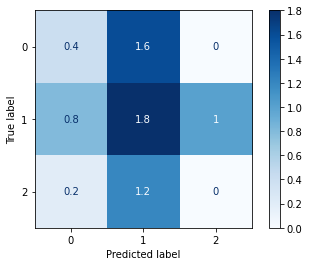

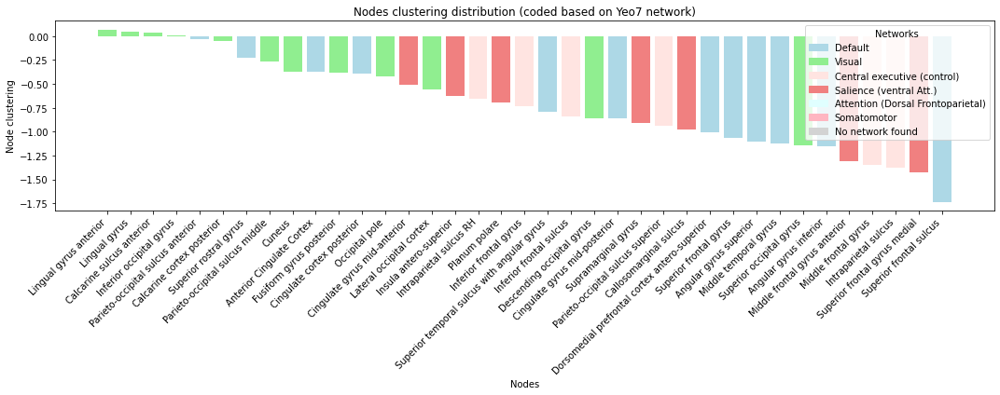

In [60]:
from sklearn.svm import SVC
from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, classification_report
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, ConfusionMatrixDisplay


def plot_distribution(mean_vector, nodes, colors, networks, metric_name):
    plt.figure(figsize=(15, 6))
    plt.bar(nodes, mean_vector, color=colors)
    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Nodes')
    plt.ylabel(f'Node {metric_name}')
    plt.title(f'Nodes {metric_name} distribution (coded based on Yeo7 network)')
    # Add a legend
    legend_handles = [plt.Rectangle((0,0),1,1, color=network_colors[network]) for network in network_colors]
    plt.legend(legend_handles, networks, title='Networks', loc='upper right')
    plt.tight_layout()
    plt.show()

exclude_keys = []
rdm_seed = 0


network_of_interest = ['SalVentAttnA', 'ContA', 'DefaultB', 'VisCent'] #,'SalVentAttnA', 'DorsAttnB', 'SomMotA']
networks_id = yeo7id
graph_dict = gmetrics_dict['change_feat']
target_columns = ['auto_groups'] #['SHSS_groups']
exclude_keys = ['nodes', 'communities']

mean_metrics = []
out_dict = dict()
random_seed = rdm_seed

for metrics_name in [m for m in list(graph_dict.keys()) if m not in exclude_keys]:
    print("================ \n{}\n================".format(metrics_name))
    # Prep dataframe with std scaler
    df = graph_dict[metrics_name]
    roi_with_networks = zip(df.columns, networks_id)
    # Filter out the columns that don't have the network tag
    selected_columns = []
    selected_networks = []
    for column, tag in roi_with_networks:
        if tag in network_of_interest:
            selected_columns.append(column)
            selected_networks.append(tag)

    rawfeatures_matrix = df[selected_columns]
    prePipeline = Pipeline([("scaler", StandardScaler())])
    features_matrix = prePipeline.fit_transform(rawfeatures_matrix)
    pipeline = Pipeline([("pca", PCA(n_components=0.80)), ("clf", SVC(C=1, kernel='linear', decision_function_shape = 'ovo'))])
    cv = ShuffleSplit(n_splits=5, test_size=0.20, random_state=random_seed)
    print('======', network_of_interest, '======')
    result_per_col = dict()  # dict to store results for each dependent variable

    for target_column in target_columns:
        print(f"--- {target_column} ---")
        y_preds = []
        y_tests = []
        y = Y[target_column].values

        # Variables to store confusion matrices
        confusion_matrices = []
        all_coefficients = []
        n_components = []
        specificities = []
        sensitivities = []
        accuracies = []

        for train_index, test_index in cv.split(features_matrix):
            # Split the data into train and test sets based on the current fold
            X_train, X_test = features_matrix[train_index], features_matrix[test_index]
            y_train, y_test = y[train_index], y[test_index]

            # Fit pipeline model with best hyperparameters
            pipeline.fit(X_train, y_train)
            y_pred = pipeline.predict(X_test)
            y_preds.append(y_pred)
            y_tests.append(y_test)
            # metrics
            labels = pipeline.named_steps['clf'].classes_
            # Calculate and store the confusion matrix
            confusion_matrix_fold = confusion_matrix(y_test, y_pred, labels= labels)
            print(confusion_matrix_fold)                 
            confusion_matrices.append(confusion_matrix_fold)
            accuracy = accuracy_score(y_test, y_pred)
            accuracies.append(accuracy)
            print(accuracy)
            
            n_components.append(pipeline.named_steps["pca"].n_components_)
            coefficients = pipeline.named_steps["clf"].coef_
            cov_x = np.cov(
                pipeline.named_steps["pca"]
                .transform(X_test)
                .transpose()
                .astype(np.float64)
            )
            cov_y = np.cov(y_test.transpose().astype(np.float64))
            # correction from Eqn 6 (Haufe et al., 2014)
            corr_coeffs = np.matmul(cov_x, coefficients.transpose()) * (1 / cov_y)
            all_coefficients.append(
                pipeline.named_steps["pca"].inverse_transform(
                    corr_coeffs.transpose()
                )
            )
            
        # Calculate mean metrics across all folds
        mean_specificity = np.mean(specificities)
        mean_sensitivity = np.mean(sensitivities)
        mean_accuracy = np.mean(accuracies)
        mean_n_components = np.mean(n_components)
        mean_confusion_matrix = np.mean(confusion_matrices, axis=0)
        # Print and store mean metrics
        print(f"Mean Specificity: {mean_specificity}")
        print(f"Mean Sensitivity: {mean_sensitivity}")
        print(f"Mean Accuracy: {mean_accuracy}")

        # Plot the mean confusion matrix
        
        cm_plot = ConfusionMatrixDisplay(confusion_matrix=mean_confusion_matrix,
                                  display_labels=labels) 
    
        cm_plot.plot(cmap='Blues')

        # Sort the nodes based on values (highest to lowest)
        mean_coeffs =  np.mean(all_coefficients, axis=0) 
        sorted_triplet = sorted(zip(mean_coeffs.ravel(), selected_columns, selected_networks), reverse=True)
        sorted_mean_metrics, sorted_nodes, sorted_yeo7id = zip(*sorted_triplet)
        sorted_colors = [network_colors[network] for network in sorted_yeo7id]
        renamed_networks = [full_nw_names[tag] for tag in network_colors]
        plot_distribution(sorted_mean_metrics, sorted_nodes, sorted_colors, renamed_networks, metric_name=metrics_name)


In [154]:
print(reg_dict.keys())
change_pred = reg_dict['change']
print(change_pred.keys())
pred_degree = change_pred['degree']
pred_closeness = change_pred['closenessCent']
pred_betweenness = change_pred['betweennessCent']
pred_clustering = change_pred['clustering']
pred_weights = change_pred['Edge_weights']
print(pred_degree.keys())

dict_keys(['pre', 'post', 'change', 'behavioral'])
dict_keys(['degree', 'closenessCent', 'betweennessCent', 'clustering', 'Edge_weights'])
dict_keys(['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER', 'total_chge_pain_hypAna', 'Chge_hypnotic_depth', 'Mental_relax_absChange', 'Automaticity_post_ind', 'Abs_diff_automaticity'])


In [7]:
network_of_interest = ['SalVentAttnA', 'ContA','DefaultB'] #,'ContA','DefaultB' ] 
networks = yeo7id

networks_regression_cv(change_gmetrics,network_of_interest,networks, Y, Y.columns[:-2],atlas_labels, yeo7id, exclude_keys = [], rdm_seed=40)  

NameError: name 'networks_regression_cv' is not defined

In [11]:
reg_dict.keys()

dict_keys(['pre', 'post', 'change', 'behavioral'])

====== degree ======
dict_keys(['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER', 'total_chge_pain_hypAna', 'Chge_hypnotic_depth', 'Mental_relax_absChange', 'Automaticity_post_ind', 'Abs_diff_automaticity'])


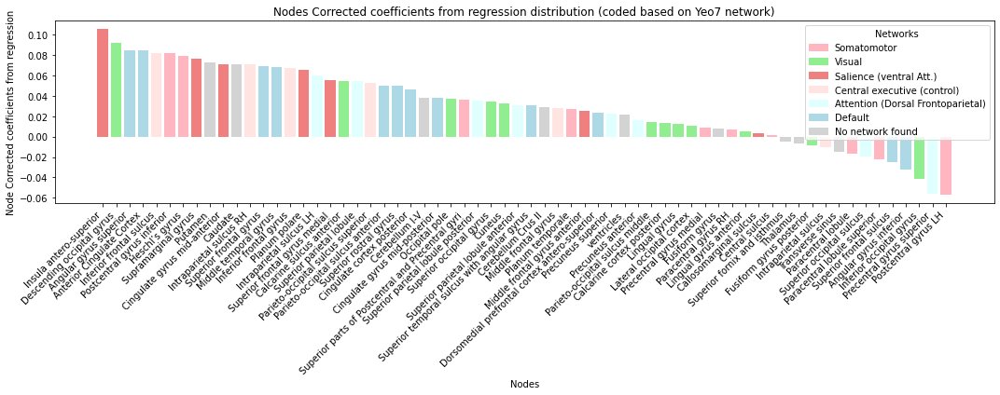

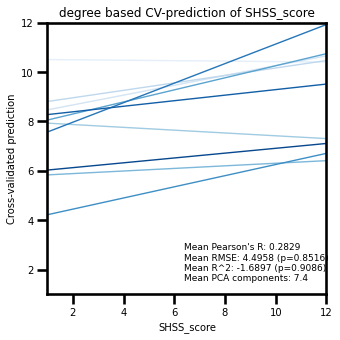

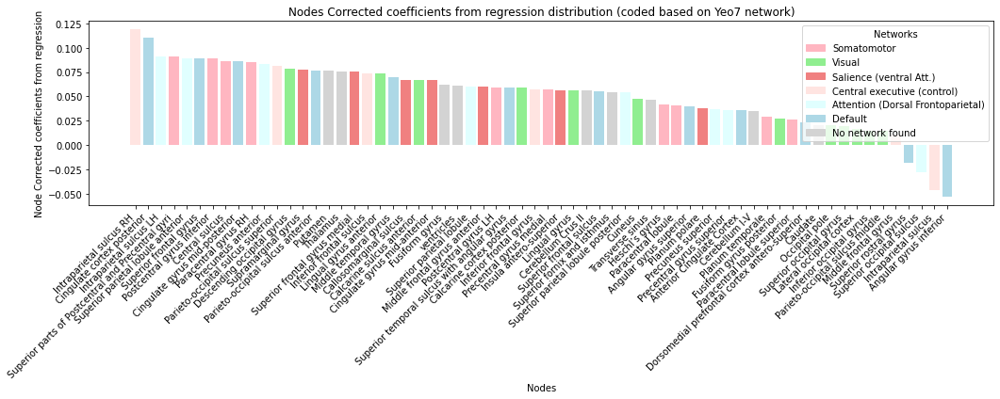

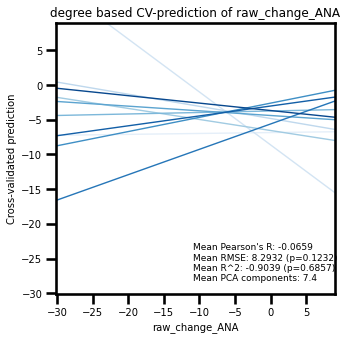

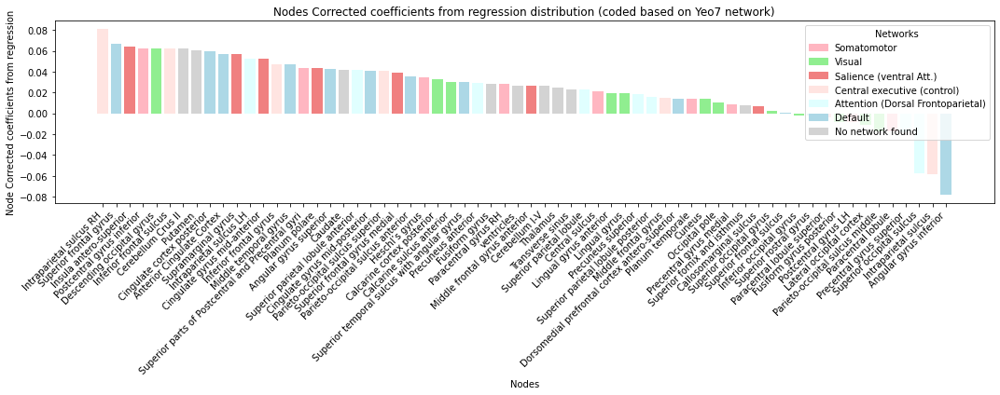

...

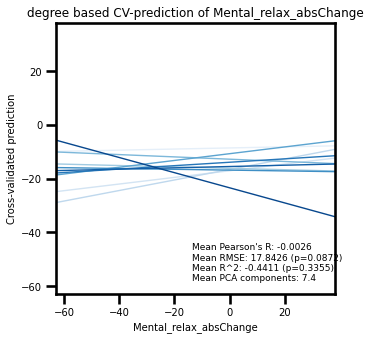

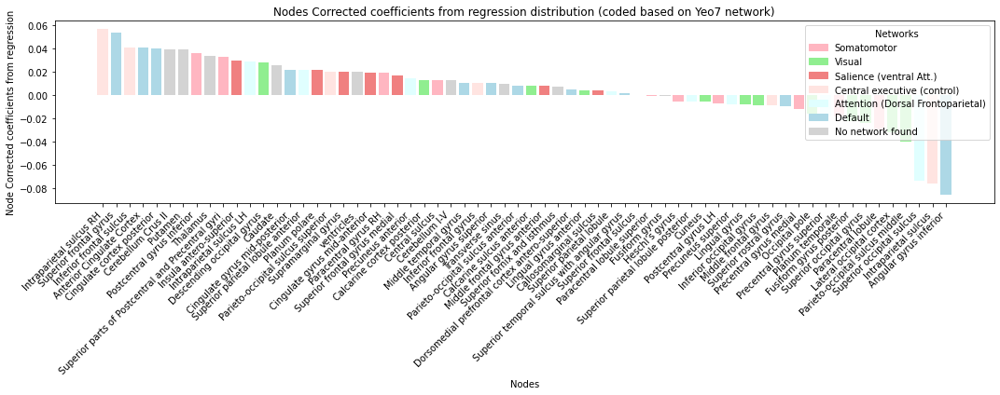

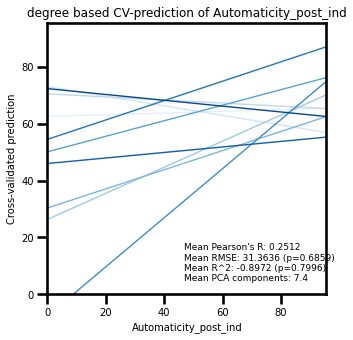

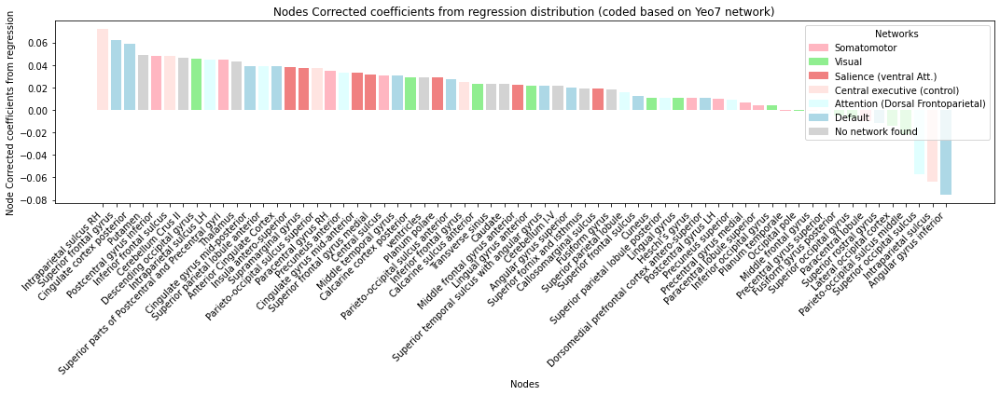

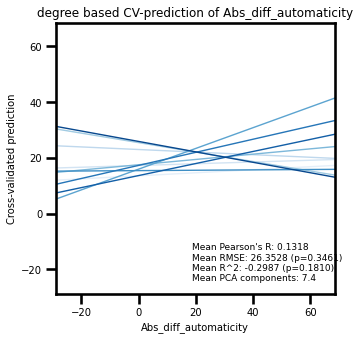

====== closenessCent ======
dict_keys(['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER', 'total_chge_pain_hypAna', 'Chge_hypnotic_depth', 'Mental_relax_absChange', 'Automaticity_post_ind', 'Abs_diff_automaticity'])


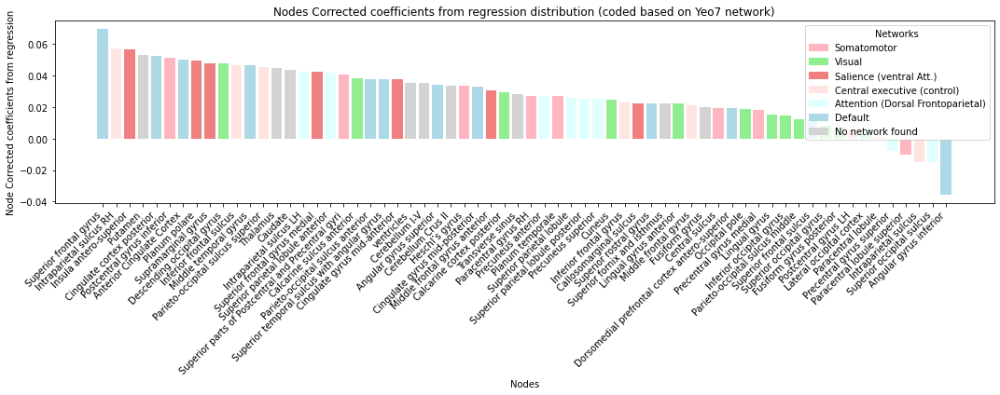

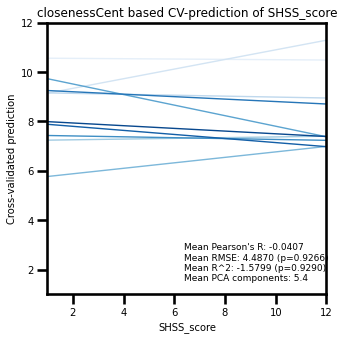

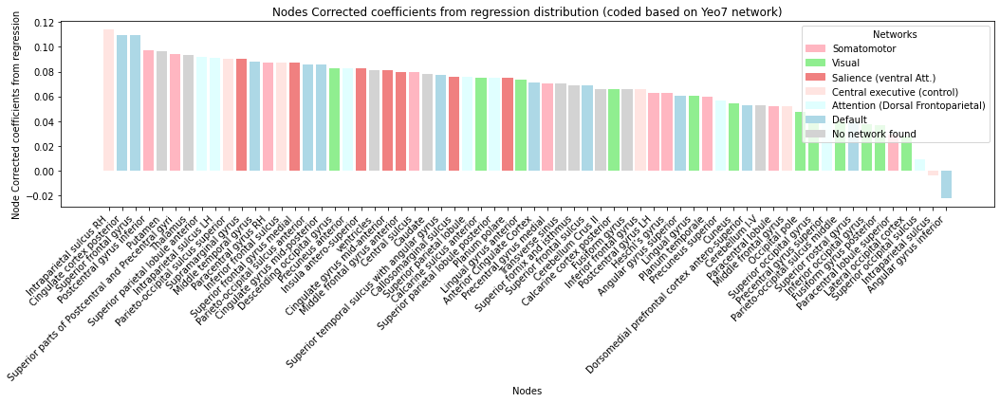

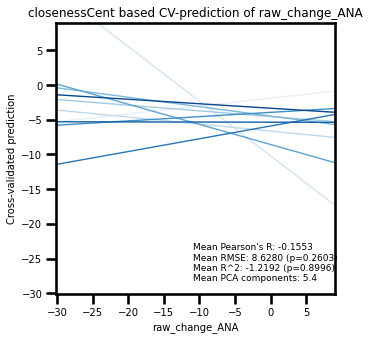

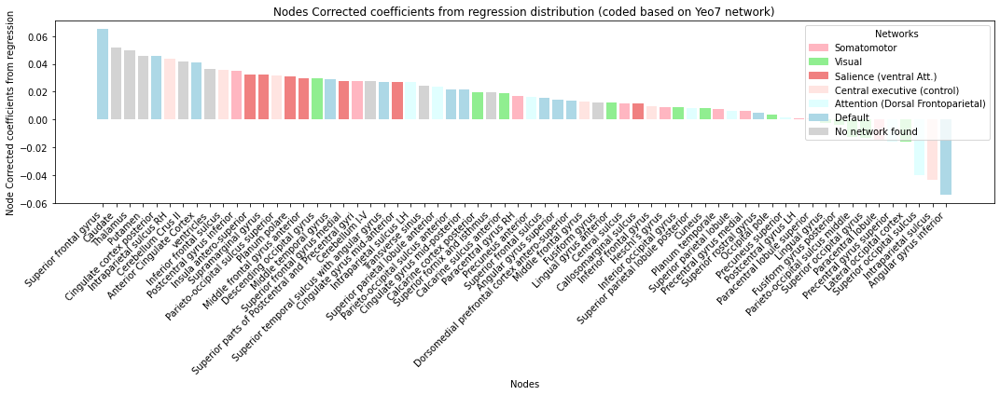

...

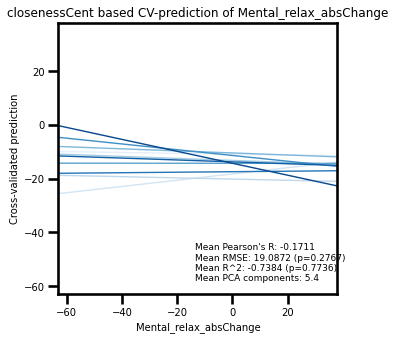

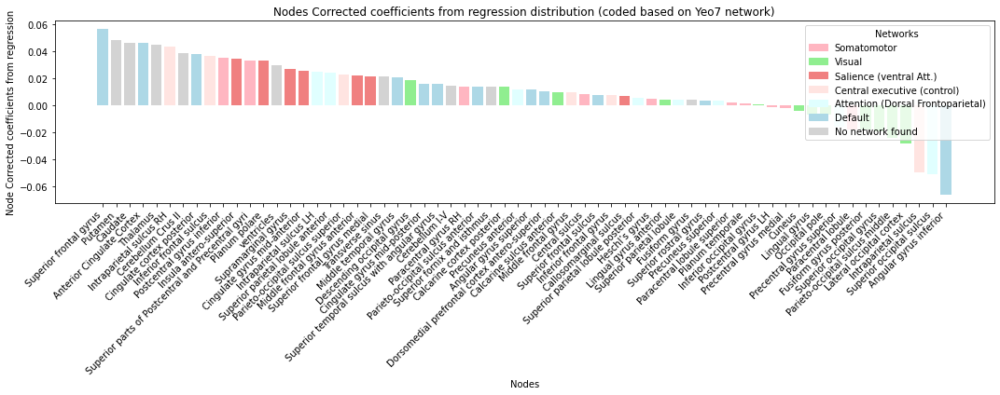

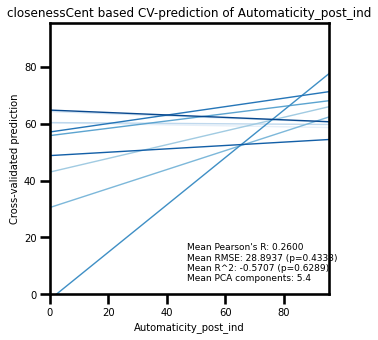

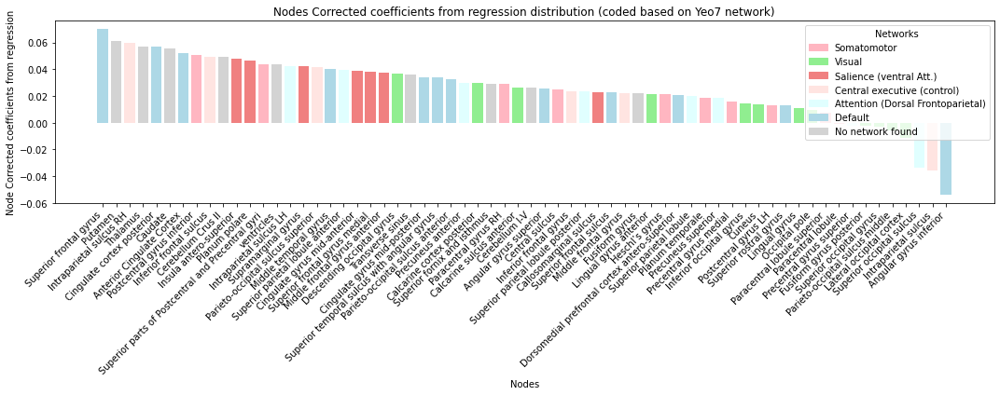

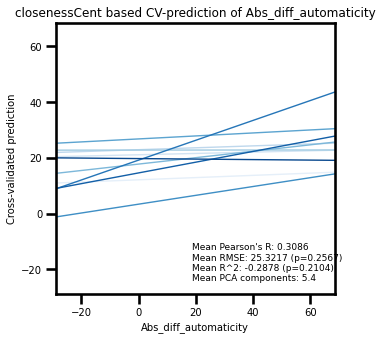

====== betweennessCent ======
dict_keys(['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER', 'total_chge_pain_hypAna', 'Chge_hypnotic_depth', 'Mental_relax_absChange', 'Automaticity_post_ind', 'Abs_diff_automaticity'])


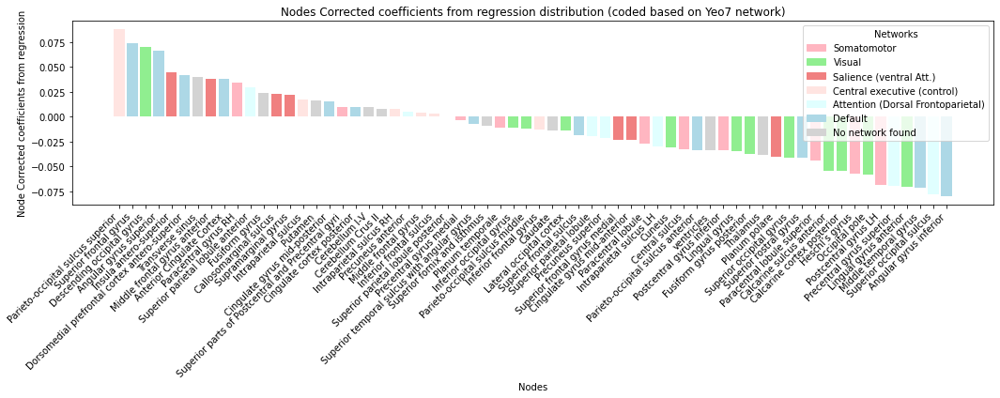

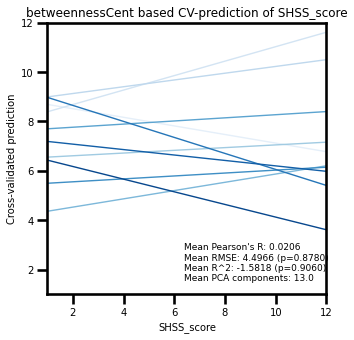

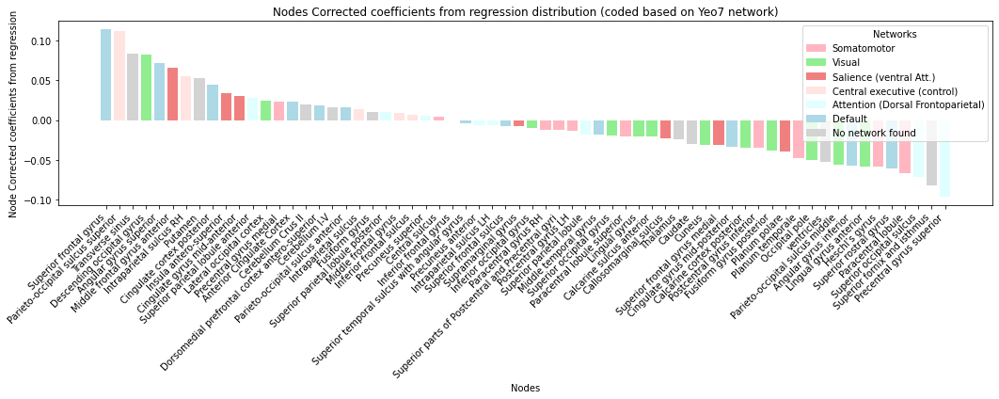

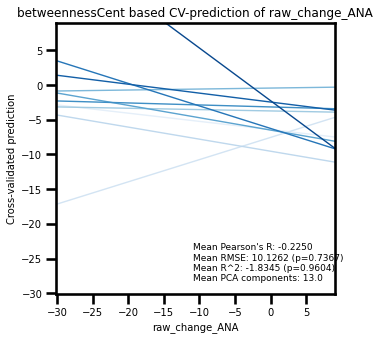

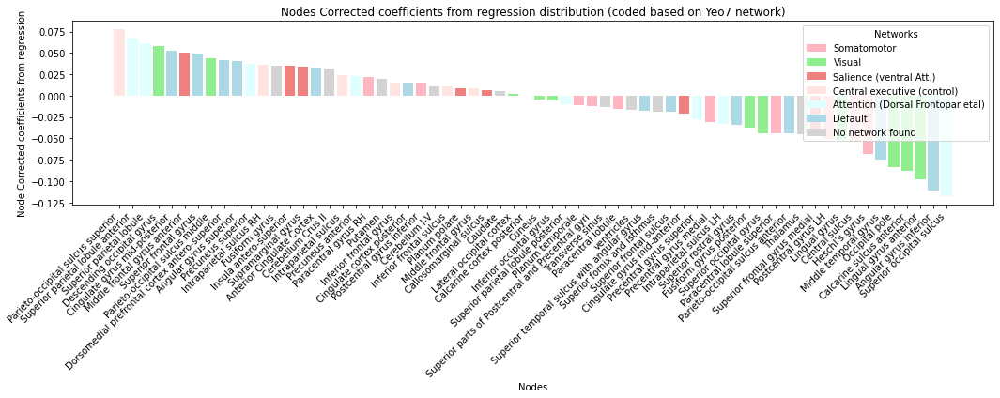

...

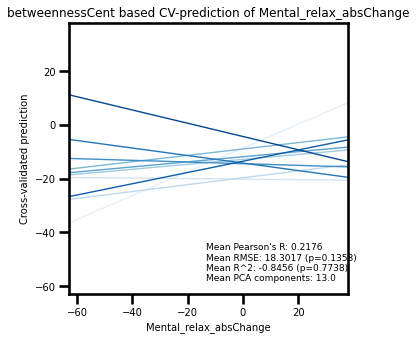

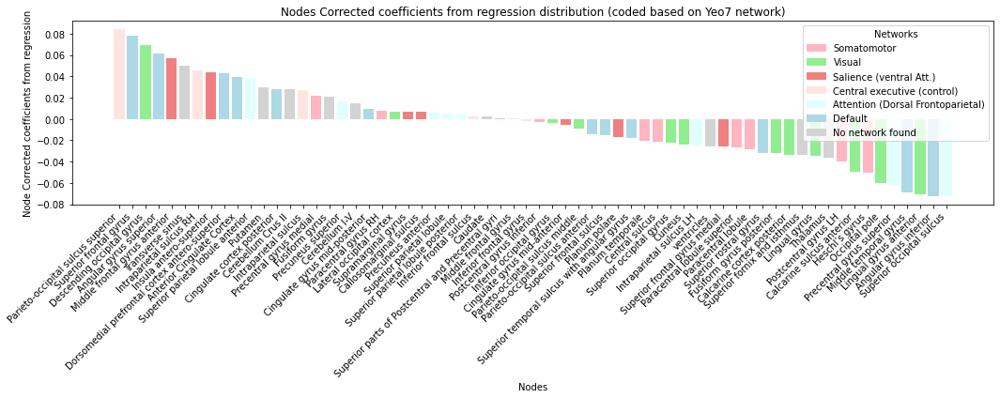

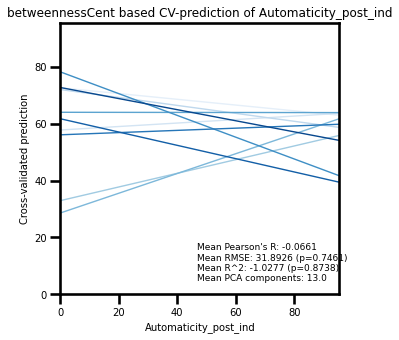

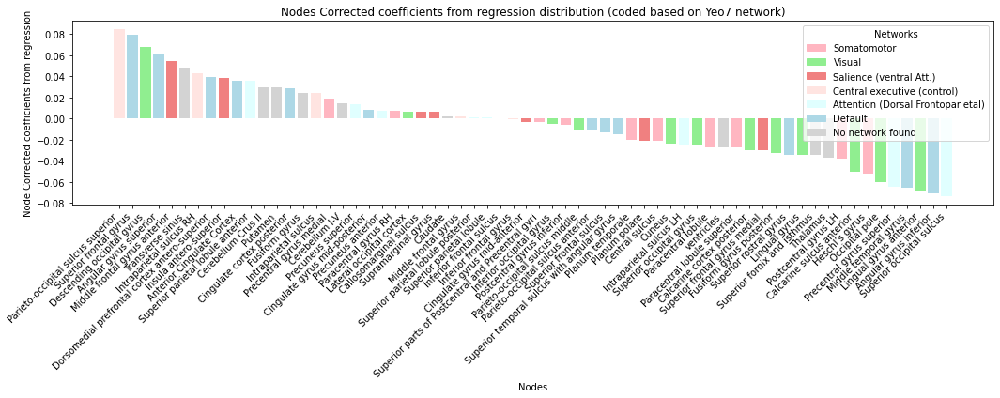

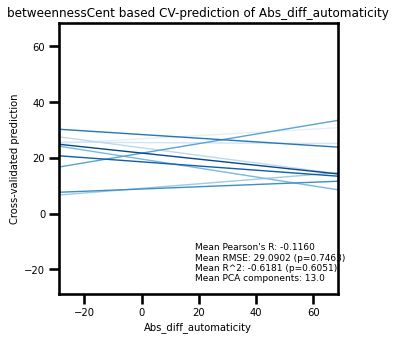

====== clustering ======
dict_keys(['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER', 'total_chge_pain_hypAna', 'Chge_hypnotic_depth', 'Mental_relax_absChange', 'Automaticity_post_ind', 'Abs_diff_automaticity'])


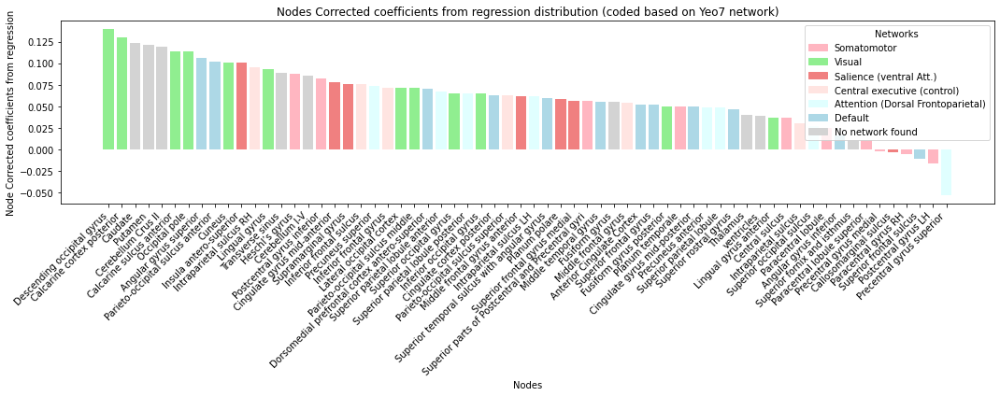

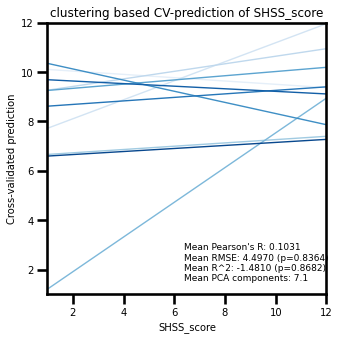

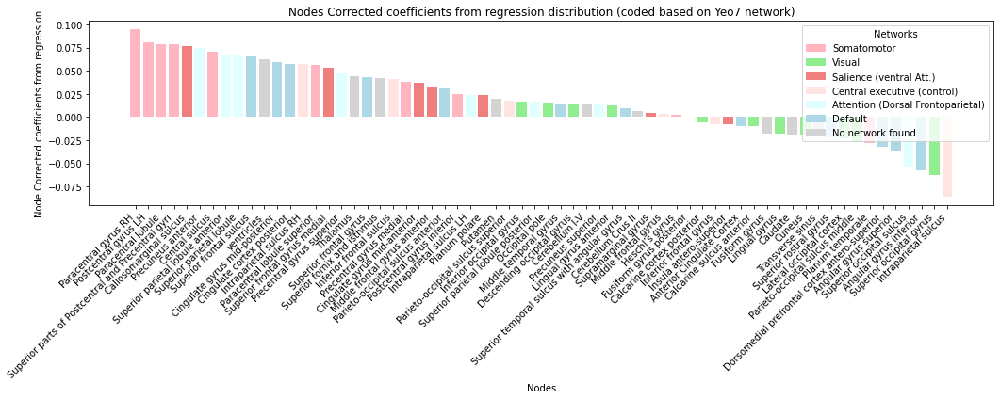

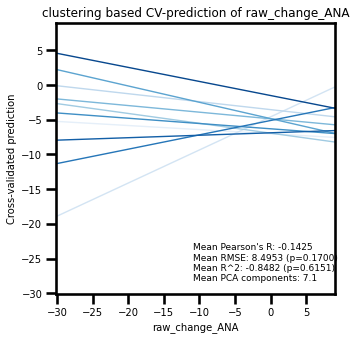

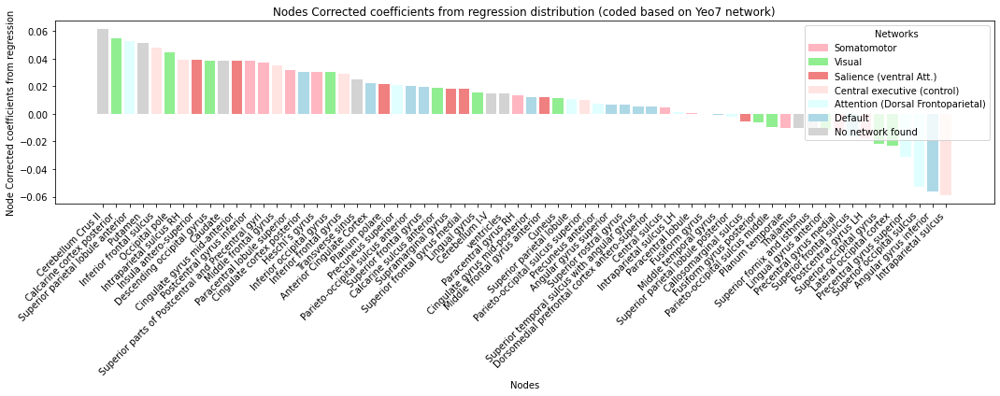

...

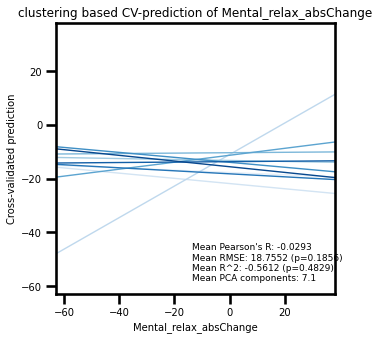

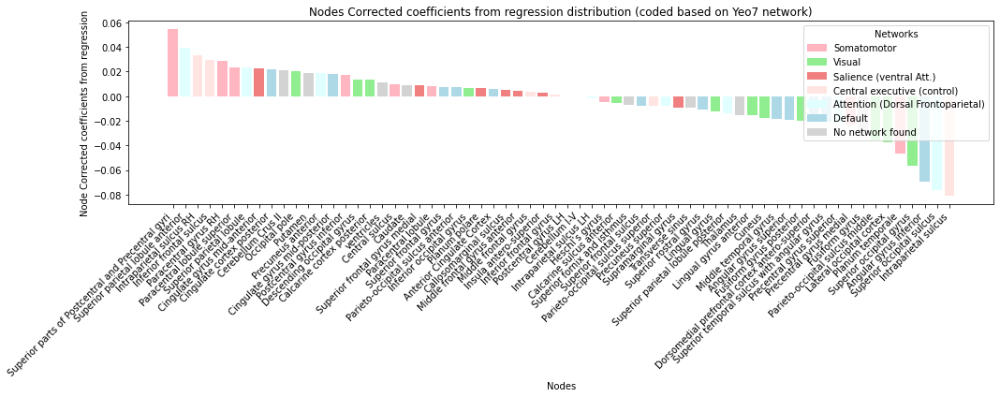

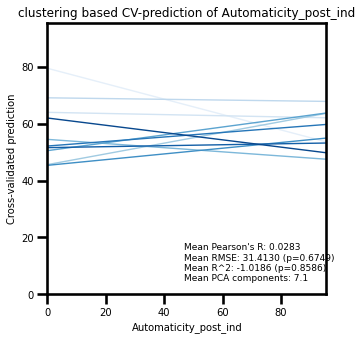

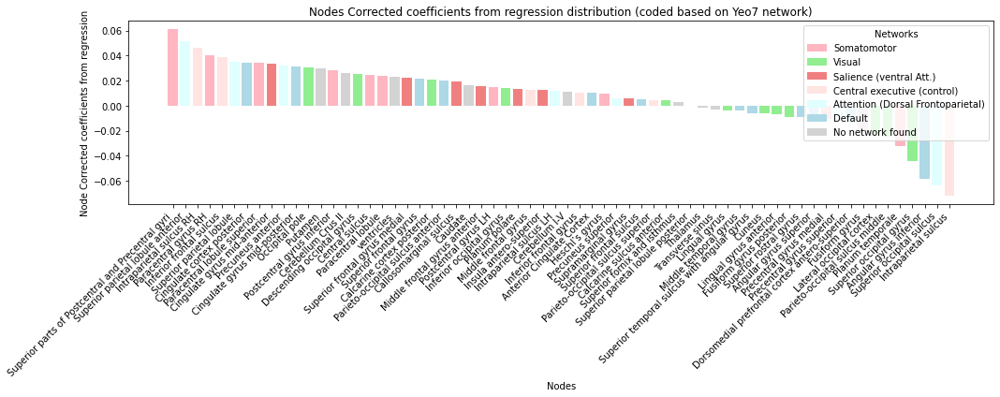

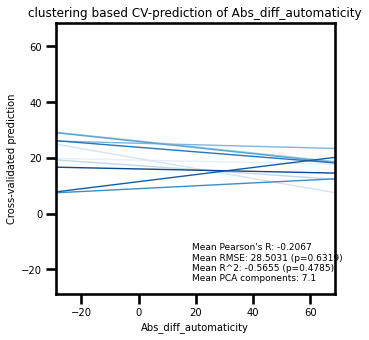

====== Edge_weights ======
dict_keys(['SHSS_score', 'raw_change_ANA', 'raw_change_HYPER', 'total_chge_pain_hypAna', 'Chge_hypnotic_depth', 'Mental_relax_absChange', 'Automaticity_post_ind', 'Abs_diff_automaticity'])


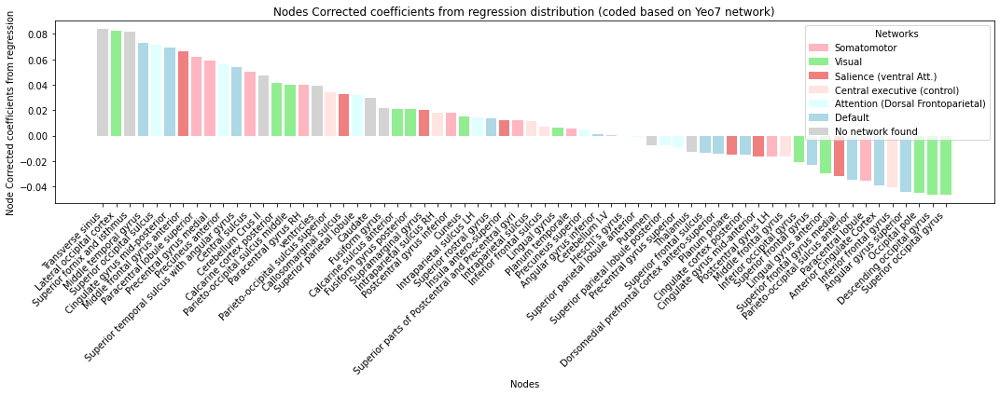

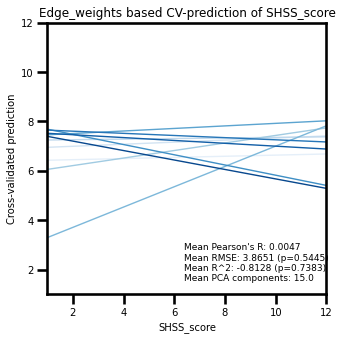

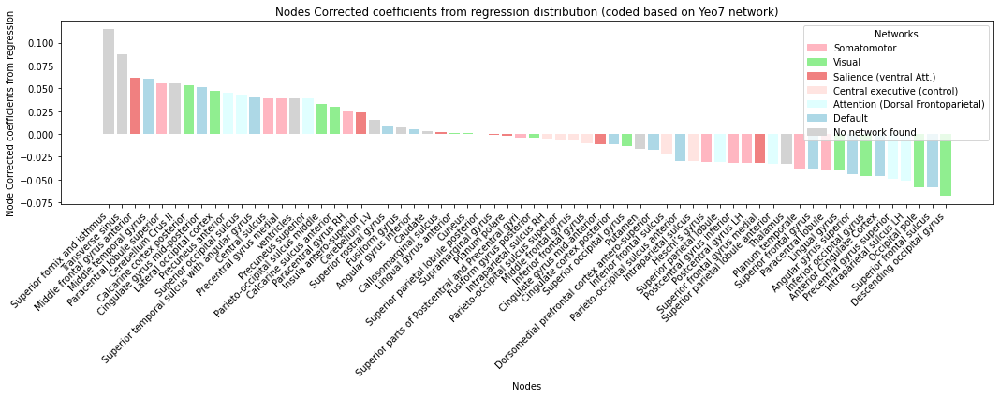

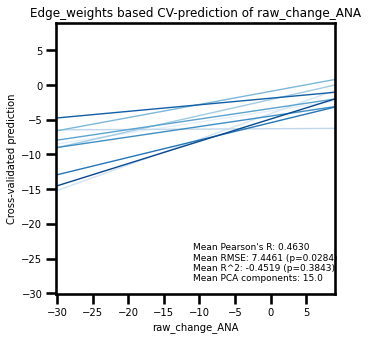

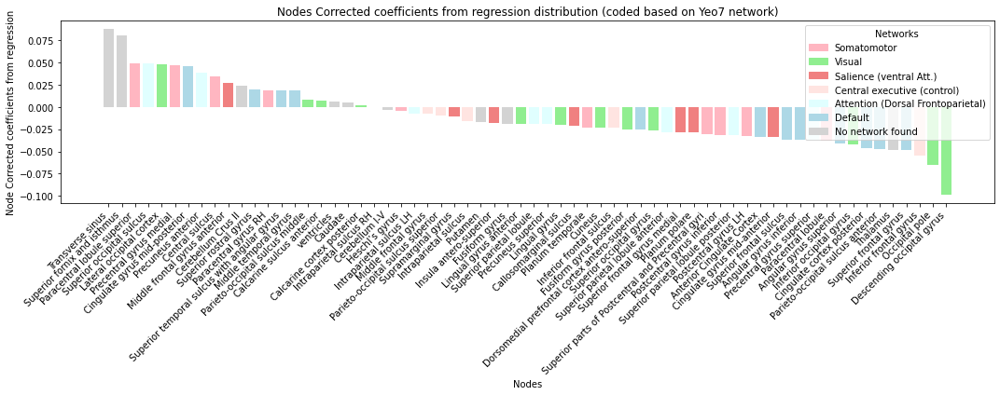

...

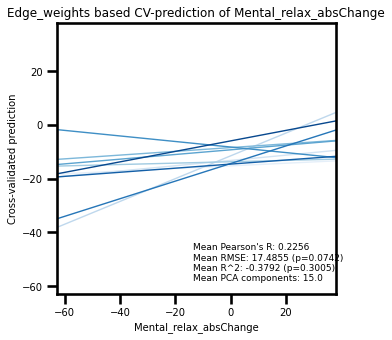

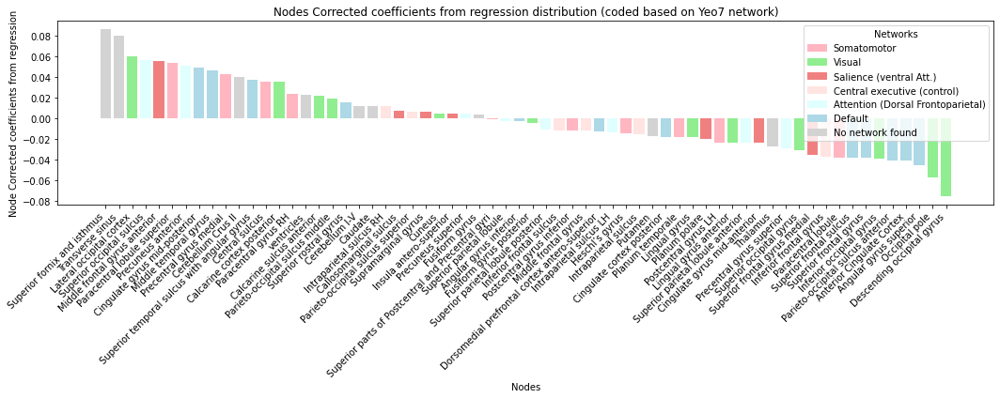

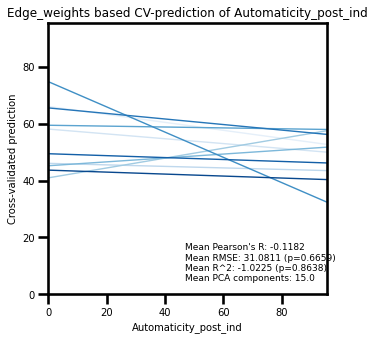

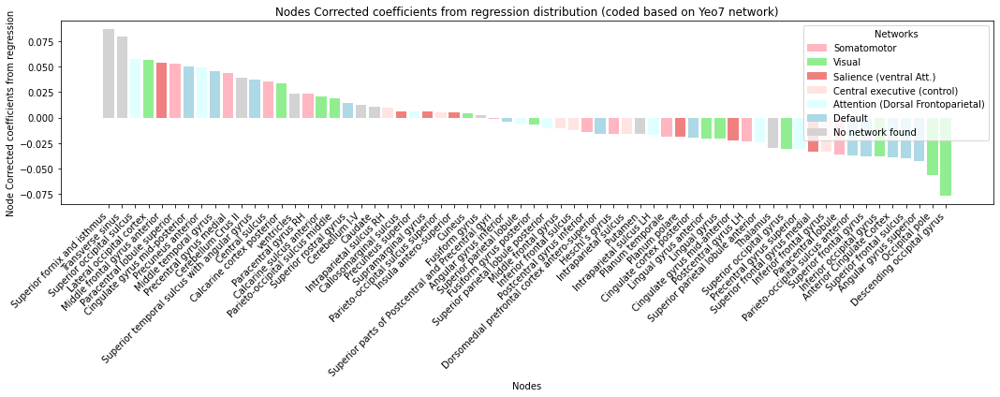

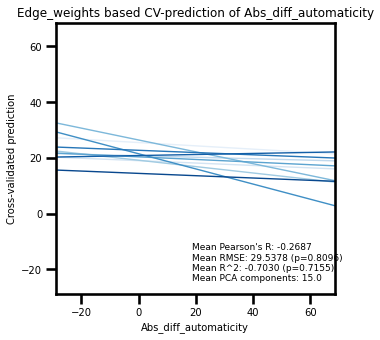

In [263]:
#SVR model for each graph metric
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from scipy.stats import pearsonr
import numpy as np

# reg_plot_performance(y_test, y_pred, y_name, mean_pearson_r, mean_rmse, mean_r2, mean_r2_pval,rmse_p_value, mean_comp, title='', path_output='', filename='regplot'):
for gmetrics in list(reg_dict['change'].keys()):
    print('======', gmetrics, '======')
    g_dict = reg_dict['change'][gmetrics]
    print(g_dict.keys())
    for target_column in g_dict.keys():
        pred_dict = g_dict[target_column]
        y_tests = pred_dict['y_tests']
        y_preds = pred_dict['y_preds']
        mean_pearson_r = np.mean(pred_dict['CV_pearson_r'])
        mean_rmse = np.mean(pred_dict['CV_rmse'])
        mean_mse = np.mean(pred_dict['CV_mse'])
        mean_r2 = np.mean(pred_dict['CV_r2'])
        mean_n_components = np.mean(pred_dict['pca_n_components'])
        plot_title = pred_dict['plot_title']
        mean_r2_pval = pred_dict['r2p_value']
        rmse_p_value = pred_dict['rmse_p_value']
        mean_coeffs =  np.mean(pred_dict['corr_coeffs'], axis=0)  
        if len(mean_coeffs.shape) < 65:
            # Sort the nodes based on values (highest to lowest)
            sorted_triplet = sorted(zip(mean_coeffs.ravel(), atlas_labels, yeo7id), reverse=True)
            sorted_mean_metrics, sorted_nodes, sorted_yeo7id = zip(*sorted_triplet)
            sorted_colors = [network_colors[network] for network in sorted_yeo7id] # list all colors for each node
            #renamed_networks = [full_nw_names[tag] for tag in network_colors] # rename the keys/network from 'Cont' to 'control'
            #def plot_distribution(mean_vector, nodes, colors, networks, metric_name):
            plot_distribution(sorted_mean_metrics, sorted_nodes, sorted_colors, set(yeo7id), metric_name='Corrected coefficients from regression')

        reg_plot_performance(y_tests, y_preds, target_column, mean_pearson_r, mean_rmse, mean_r2, mean_r2_pval, rmse_p_value, mean_n_components, title = plot_title)


In [230]:
out = pred_degree['raw_change_ANA']
print(out.keys())
coeffs = np.stack(out['corr_coeffs'],axis=-1)
out['corr_coeffs'][0].shape

dict_keys(['plot_title', 'CV_mse', 'CV_rmse', 'CV_r2', 'CV_pearson_r', 'pca_n_components', 'r2p_value', 'rmse_p_value', 'y_preds', 'y_tests', 'corr_coeffs'])


(1, 2016)

Ridge model

In [82]:
# Ridge model and output for each graph metric and dependent variable
#feature_matrices = [X_degree, X_degreeCentrality, X_closeness, X_betweenness, X_clustering]
#concatenated_matrices = np.vstack(feature_matrices)
#num_participants = X_degree.shape[0]
#group_column = np.tile(np.arange(1, num_participants + 1), len(feature_matrices)

random_seed = 0
result_dict = dict()
result_per_col = dict()
for rawfeatures_matrix, g_metric in zip([X_con, X_degree, X_closeness, X_betweenness, X_clustering], ['Connectivity matrix', 'Degree', 'Closeness centrality', 'Betweenness centrality', 'Clustering']):
    print('================ \n{}\n================'.format(g_metric))
    
    prePipeline = Pipeline([('scaler', StandardScaler())])
    features_matrix = prePipeline.fit_transform(rawfeatures_matrix)

    #pipeline = Pipeline([('std', QuantileTransformer(n_quantiles=22)), ('pca', PCA(n_components=0.80)), ('ridge', Ridge())])
    pipeline = Pipeline([('pca', PCA(n_components=0.90)), ('reg', SVR(kernel='linear'))])
    #cv = KFold(n_splits=5, random_state=random_seed, shuffle=True)
    cv = StratifiedShuffleSplit(n_splits=10, test_size=0.20, random_state=random_seed)

    for target_column in target_columns:
        print(f"--- {target_column} ---")
        y_preds = []
        y_tests = []
        y = Y[target_column].values
        # Add covariates to the feature matrix (?!!)
        add_cov = False
        #if  target_column != 'SHSS_score':
            #add_cov = True
            #covariate_column = 'SHSS_score'
        '''
        if target_column != 'SHSS_score':
            covariate_column = 'Abs_diff_automaticity'
            add_cov = True
        if add_cov:    
            features_matrix = np.hstack((features_matrix, Y[covariate_column].values.reshape(-1, 1)))
            covariate_corr, p_value = pearsonr(Y[covariate_column], y)
            p_value_corrected = fdrcorrection([p_value])[1][0]  # Apply FDR correction
            print(f"Pearson correlation between {covariate_column} and {target_column}:\n r={covariate_corr:.4f} (FDR corrected p-value: p={p_value_corrected:.4f})")
        '''
        
        pearson_r_scores = []
        r2_scores = []
        mse_scores = []
        rmse_scores = []
        n_components = []
        all_coefficients = []
        
        for train_index, test_index in cv.split(features_matrix, Y['SHSS_groups'].values):
            # Split the data into train and test sets based on the current fold
            X_train, X_test = features_matrix[train_index], features_matrix[test_index]
            y_train, y_test = y[train_index], y[test_index]
            # Fit pipeline model with best hyperparameters
            pipeline.fit(X_train, y_train)
            y_pred = pipeline.predict(X_test)
            y_preds.append(y_pred)
            y_tests.append(y_test)

            # Calculate evaluation metrics
            pearson_r, _ = pearsonr(y_test, y_pred)
            r2 = r2_score(y_test, y_pred)
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)
            #Covariance for Haufe correction
            cov_x = np.cov(pipeline.named_steps['pca'].transform(X_test).transpose().astype(np.float64))
            cov_y = np.cov(y_test.transpose().astype(np.float64))
     
            # Append metrics to the respective lists
            pearson_r_scores.append(pearson_r)
            r2_scores.append(r2)
            mse_scores.append(mse)
            rmse_scores.append(rmse)
            n_components.append(pipeline.named_steps['pca'].n_components_)
            coefficients = pipeline.named_steps['reg'].coef_
    
            # correction from Eqn 6 (Haufe et al., 2014)
            corr_coeffs = np.matmul(cov_x, coefficients.transpose()) * (
                1 / cov_y   
            )
            all_coefficients.append(pipeline.named_steps['pca'].inverse_transform(corr_coeffs.transpose()))
            
        
        #Permutation tests
        #r2score, _, r2p_value = compute_permutation(features_matrix, y, pipeline, cv = cv, scoring='r2', random_seed=random_seed)
        #rmse_score, _, rmse_p_value = compute_permutation(features_matrix, y, pipeline, cv = cv, scoring='neg_root_mean_squared_error', random_seed=random_seed)
        r2p_value,rmse_p_value = 0.00001, 0.00001
        
        print(f"Permutation test for r2 values: p={r2p_value:.4f}")
        # Calculate mean metrics across all folds
        mean_pearson_r = np.mean(pearson_r_scores)
        mean_r2 = np.mean(r2_scores)
        mean_mse = np.mean(mse_scores)
        mean_rmse = np.mean(rmse_scores)
        mean_n_components = np.mean(n_components)

        result_per_col[target_column] = {
                "plot_title": plot_title,
                "mean_mse": mean_mse,
                "mean_rmse": mean_rmse,
                "mean_r2": mean_r2,
                "mean_pearson_r": mean_pearson_r,
                "mean_n_components": mean_n_components,
                "r2p_value": r2p_value,
                "rmse_p_value": rmse_p_value,
                "y_preds": y_preds,
                "y_tests": y_tests,
                "corr_coeffs": all_coefficients,
            }

    result_dict[g_metric] = result_per_col
        # Calculate standard deviation metrics across all folds
        # avg_z_score = np.mean(np.array(all_coefficients), axis=0) / np.std(all_coefficients, axis=0)
        # print(f"Average z-score = {avg_z_score} std = {np.std(all_coefficients, axis=0)}")
        # Plot
        #plot_title = f"{g_metric} based CV-prediction of {target_column}"
        #reg_plot_performance(y_tests, y_preds, target_column, mean_pearson_r, mean_rmse, mean_r2, r2p_value,rmse_p_value, mean_n_components, title=plot_title)


Connectivity matrix
--- SHSS_score ---
Permutation test for r2 values: p=0.0000
--- raw_change_ANA ---
Permutation test for r2 values: p=0.0000
--- raw_change_HYPER ---
Permutation test for r2 values: p=0.0000
--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.0000
--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.0000
--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.0000
--- Automaticity_post_ind ---
Permutation test for r2 values: p=0.0000
--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.0000
Degree
--- SHSS_score ---
Permutation test for r2 values: p=0.0000
--- raw_change_ANA ---
Permutation test for r2 values: p=0.0000
--- raw_change_HYPER ---
Permutation test for r2 values: p=0.0000
--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.0000
--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.0000
--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.0000
--- Automaticity_post_ind

#### plot models coefficient


In [95]:
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize lists to store mean and std of correlation coefficients for each feature
mean_coeffs = []
std_coeffs = []

# List to store labels (feature names)
ordered_labels = []

# Iterate through each feature and metric
for feature, column_dict in result_dict.items():
    for Y_column, data_dict in column_dict.items():
        # Access the correlation coefficients
        corr_coeffs = data_dict['corr_coeffs']
        
        # Calculate the mean and standard deviation of correlation coefficients across folds
        mean_coeffs = np.mean(corr_coeffs, axis=0)
        std_coeffs = np.std(corr_coeffs, axis=0)
               
        # Sort mean coefficients and corresponding labels in descending order
        sorted_indices = np.argsort(mean_coeffs)  # Sort in descending order
        ordered_coeffs = mean_coeffs.transpose()[sorted_indices].flatten()  # Transpose and sort
        std_coeffs = std_coeffs.transpose()[sorted_indices]
        ordered_labels = np.array(labels)[sorted_indices]
        
        # Create a distribution plot for each coefficient
        plt.figure(figsize=(10, 6))
        sns.histplot(ordered_coeffs, kde=False)
        plt.xlabel('Nodes')
        plt.ylabel('Coefficient Values')
        plt.title(f'Distribution Plot for Coefficients in {Y_column}')
        
        # Set ordered_labels as x-axis tick labels
        plt.xticks(range(len(ordered_coeffs)), ordered_labels, rotation=90)
        
        plt.tight_layout()
        
        # Show the plot for this Y_column
        plt.show()


IndexError: index 9 is out of bounds for axis 0 with size 1

Connectivity matrix
--- SHSS_score ---
Permutation test for r2 values: p=0.8628


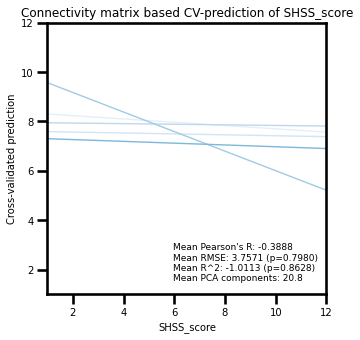

--- raw_change_ANA ---
Permutation test for r2 values: p=0.0864


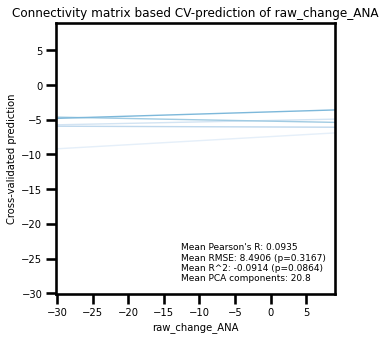

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.1522


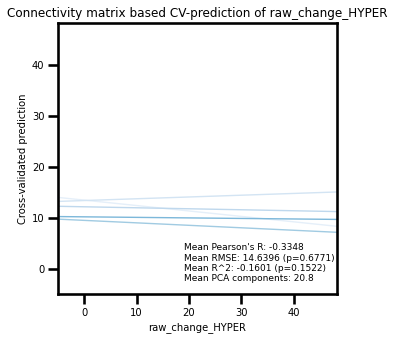

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.2567


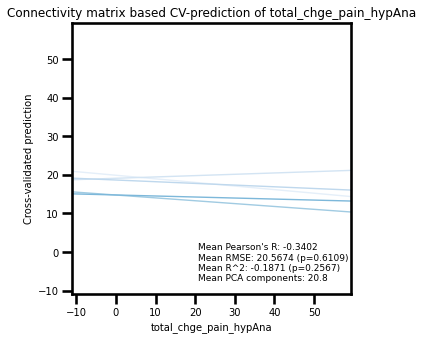

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.9420


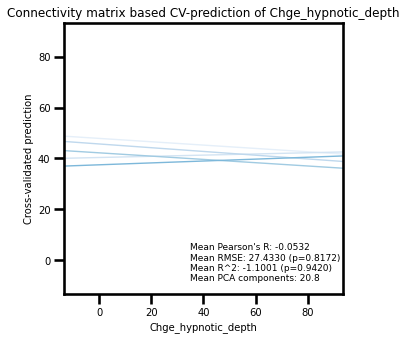

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.1298


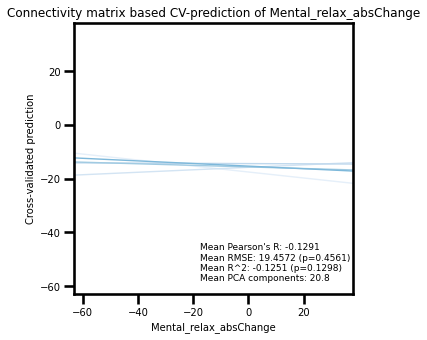

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.4569


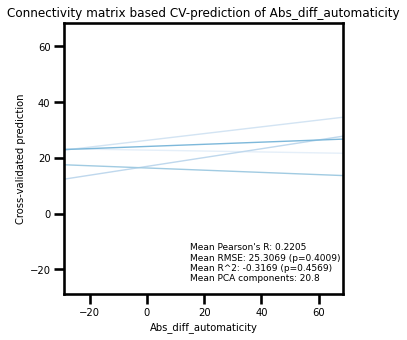

Degree
--- SHSS_score ---
Permutation test for r2 values: p=0.6617


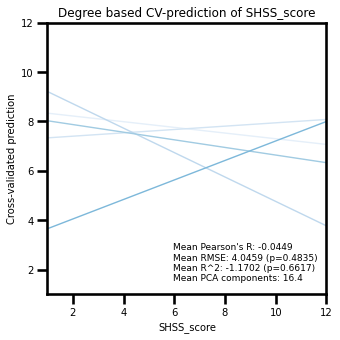

--- raw_change_ANA ---
Permutation test for r2 values: p=0.4421


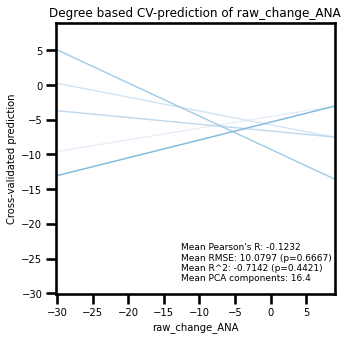

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.0016


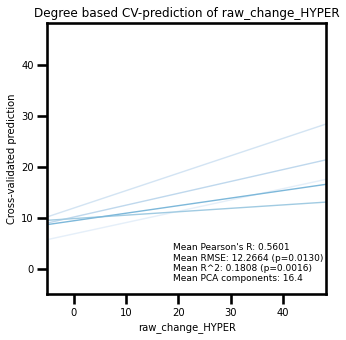

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.0116


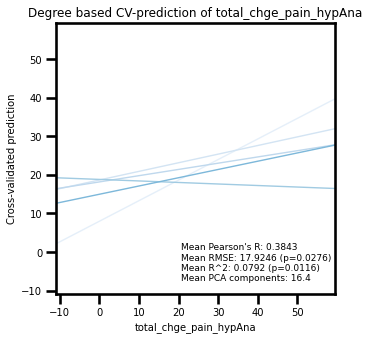

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.7674


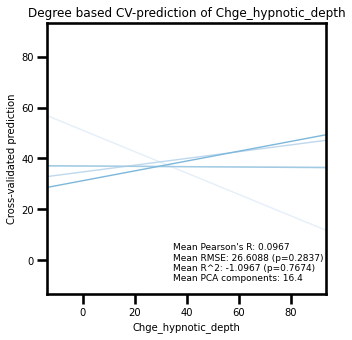

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.2366


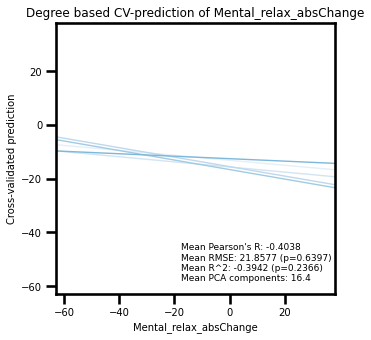

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.3945


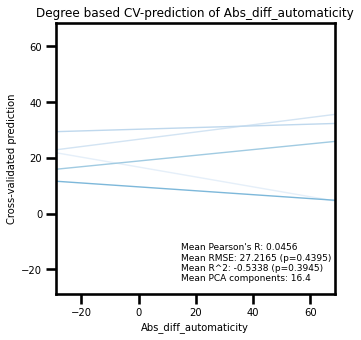

Closeness centrality
--- SHSS_score ---
Permutation test for r2 values: p=0.4669


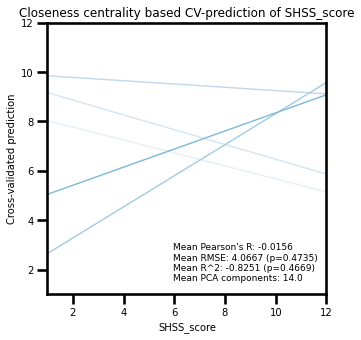

--- raw_change_ANA ---
Permutation test for r2 values: p=0.2529


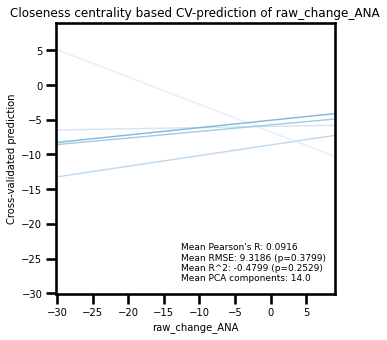

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.1060


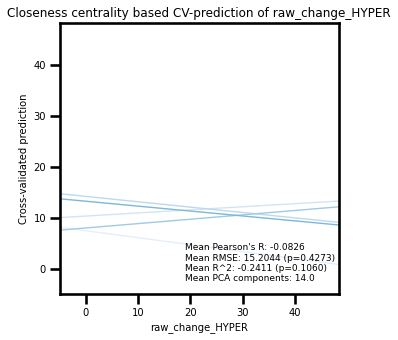

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.1492


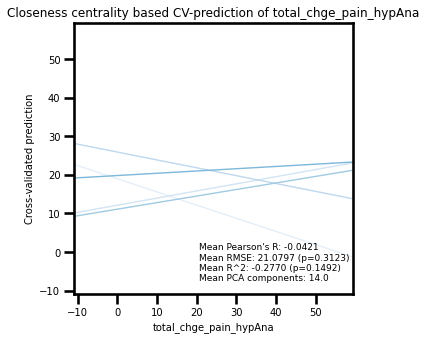

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.8982


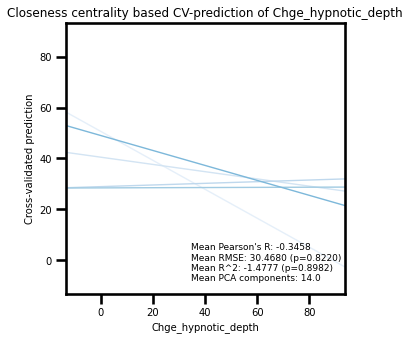

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.6413


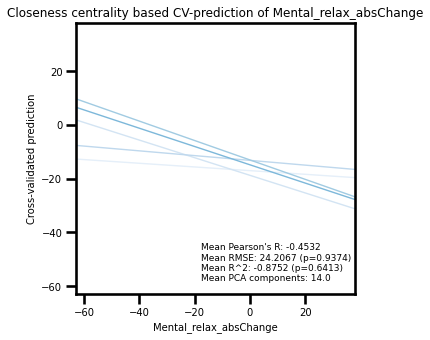

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.3271


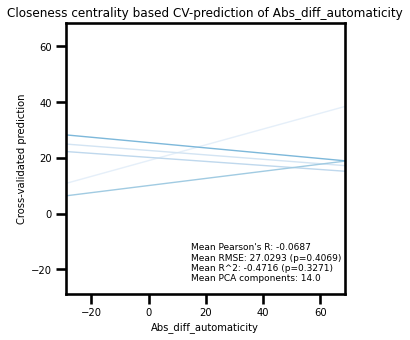

Betweenness centrality
--- SHSS_score ---
Permutation test for r2 values: p=0.8478


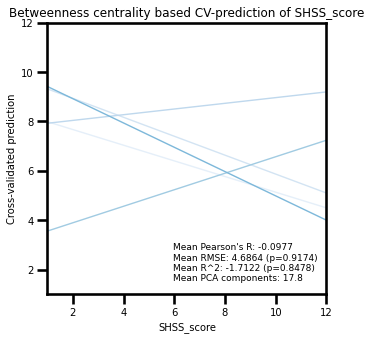

--- raw_change_ANA ---
Permutation test for r2 values: p=0.3723


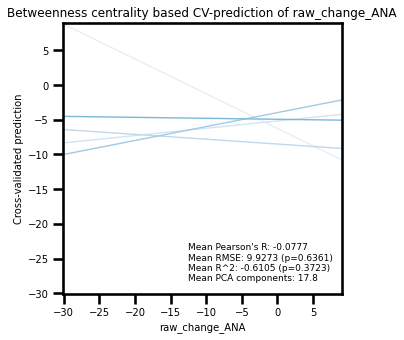

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.5079


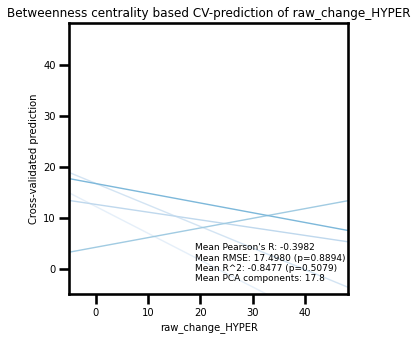

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.6347


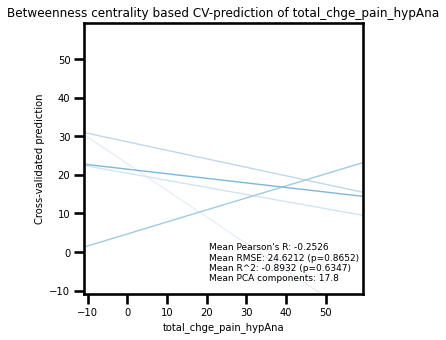

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.9622


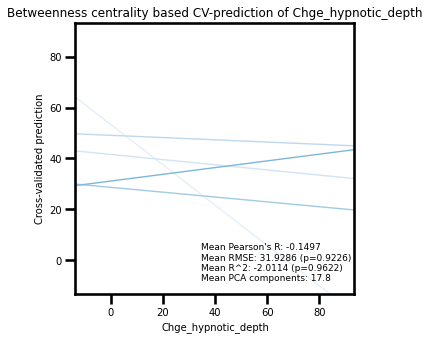

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.0524


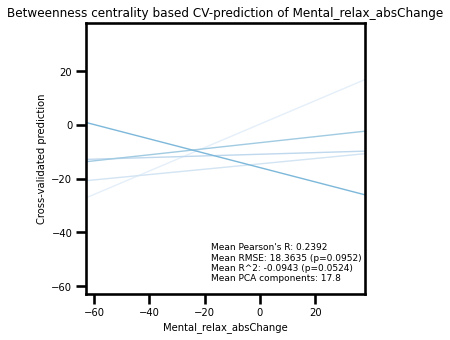

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.6345


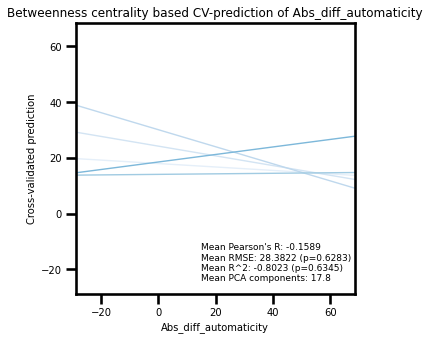

Clustering
--- SHSS_score ---
Permutation test for r2 values: p=0.8846


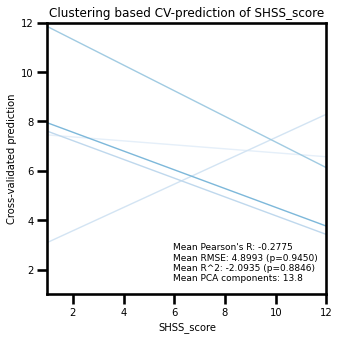

--- raw_change_ANA ---
Permutation test for r2 values: p=0.2543


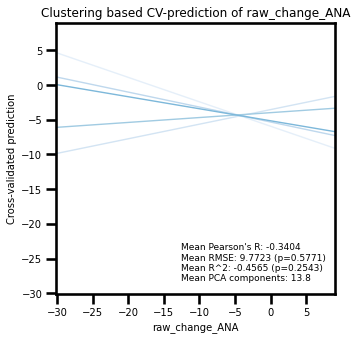

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.1508


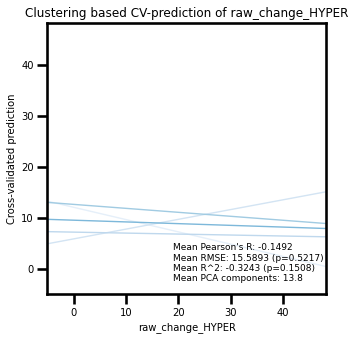

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.2825


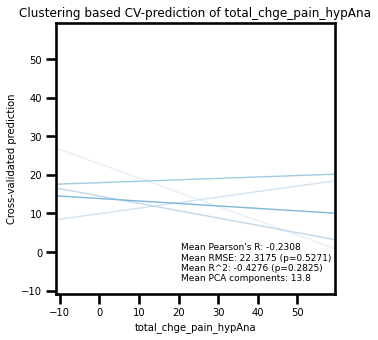

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.8024


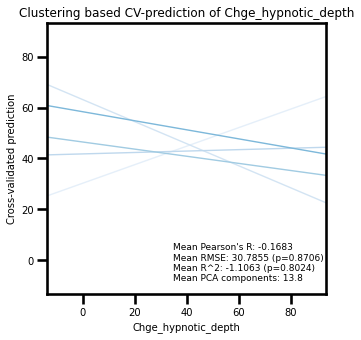

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.0464


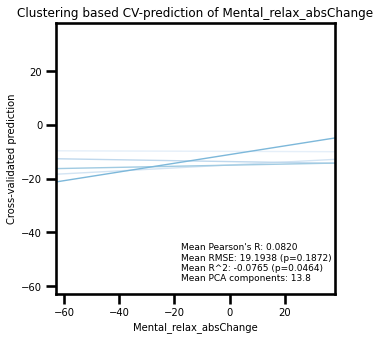

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.5743


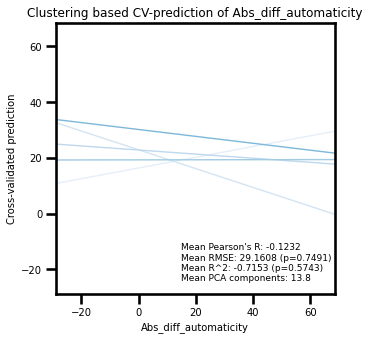

In [674]:
# Ridge model and output for each graph metric and dependent variable
#feature_matrices = [X_degree, X_degreeCentrality, X_closeness, X_betweenness, X_clustering]
#concatenated_matrices = np.vstack(feature_matrices)
#num_participants = X_degree.shape[0]
#group_column = np.tile(np.arange(1, num_participants + 1), len(feature_matrices))

random_seed = 0
for rawfeatures_matrix, g_metric in zip([X_con, X_degree, X_closeness, X_betweenness, X_clustering], ['Connectivity matrix', 'Degree', 'Closeness centrality', 'Betweenness centrality', 'Clustering']):
    print('================ \n{}\n================'.format(g_metric))
    
    prePipeline = Pipeline([('scaler', StandardScaler())])
    features_matrix = prePipeline.fit_transform(rawfeatures_matrix)

    #pipeline = Pipeline([('std', QuantileTransformer(n_quantiles=22)), ('pca', PCA(n_components=0.80)), ('ridge', Ridge())])
    pipeline = Pipeline([('pca', PCA(n_components=0.90)), ('reg', SVR(kernel='linear'))])
    cv = KFold(n_splits=5, random_state=random_seed, shuffle=True)
    #cv = ShuffleSplit(n_splits=10, test_size=0.20, random_state=random_seed)

    for target_column in target_columns:
        print(f"--- {target_column} ---")
        y_preds = []
        y_tests = []
        y = Y[target_column].values
        # Add covariates to the feature matrix (?!!)
        add_cov = False
        #if  target_column != 'SHSS_score':
            #add_cov = True
            #covariate_column = 'SHSS_score'
        '''
        if target_column != 'SHSS_score':
            covariate_column = 'Abs_diff_automaticity'
            add_cov = True
        if add_cov:    
            features_matrix = np.hstack((features_matrix, Y[covariate_column].values.reshape(-1, 1)))
            covariate_corr, p_value = pearsonr(Y[covariate_column], y)
            p_value_corrected = fdrcorrection([p_value])[1][0]  # Apply FDR correction
            print(f"Pearson correlation between {covariate_column} and {target_column}:\n r={covariate_corr:.4f} (FDR corrected p-value: p={p_value_corrected:.4f})")
        '''
        
        pearson_r_scores = []
        r2_scores = []
        mse_scores = []
        rmse_scores = []
        n_components = []
        all_coefficients = []
        
        for train_index, test_index in cv.split(features_matrix):
            # Split the data into train and test sets based on the current fold
            X_train, X_test = features_matrix[train_index], features_matrix[test_index]
            y_train, y_test = y[train_index], y[test_index]
            # Fit pipeline model with best hyperparameters
            pipeline.fit(X_train, y_train)
            y_pred = pipeline.predict(X_test)
            y_preds.append(y_pred)
            y_tests.append(y_test)

            # Calculate evaluation metrics
            pearson_r, _ = pearsonr(y_test, y_pred)
            r2 = r2_score(y_test, y_pred)
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)

            # Append metrics to the respective lists
            pearson_r_scores.append(pearson_r)
            r2_scores.append(r2)
            mse_scores.append(mse)
            rmse_scores.append(rmse)
            n_components.append(pipeline.named_steps['pca'].n_components_)
            coefficients = pipeline.named_steps['reg'].coef_
            all_coefficients.append(coefficients)

        #Permutation tests
        r2score, _, r2p_value = compute_permutation(features_matrix, y, pipeline, cv = cv, scoring='r2', random_seed=random_seed)
        rmse_score, _, rmse_p_value = compute_permutation(features_matrix, y, pipeline, cv = cv, scoring='neg_root_mean_squared_error', random_seed=random_seed)
        #r2p_value,rmse_p_value = 0.00001, 0.00001
        
        print(f"Permutation test for r2 values: p={r2p_value:.4f}")
        # Calculate mean metrics across all folds
        mean_pearson_r = np.mean(pearson_r_scores)
        mean_r2 = np.mean(r2_scores)
        mean_mse = np.mean(mse_scores)
        mean_rmse = np.mean(rmse_scores)
        mean_n_components = np.mean(n_components)
        # Calculate standard deviation metrics across all folds
        # avg_z_score = np.mean(np.array(all_coefficients), axis=0) / np.std(all_coefficients, axis=0)
        # print(f"Average z-score = {avg_z_score} std = {np.std(all_coefficients, axis=0)}")
        # Plot
        plot_title = f"{g_metric} based CV-prediction of {target_column}"
        reg_plot_performance(y_tests, y_preds, target_column, mean_pearson_r, mean_rmse, mean_r2, r2p_value,rmse_p_value, mean_n_components, title=plot_title)


Connectivity matrix
--- SHSS_score ---
Permutation test for r2 values: p=0.3653


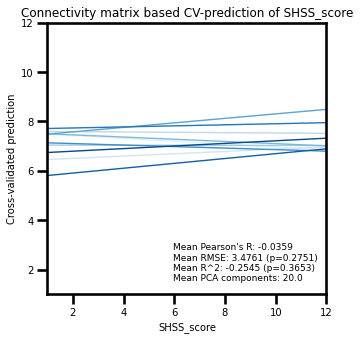

--- raw_change_ANA ---
Permutation test for r2 values: p=0.1594


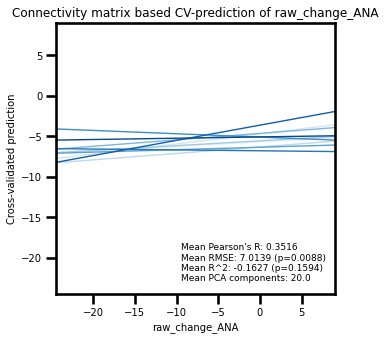

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.2200


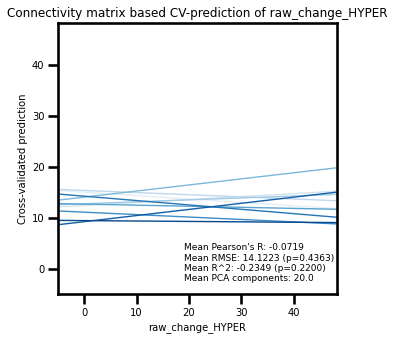

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.1118


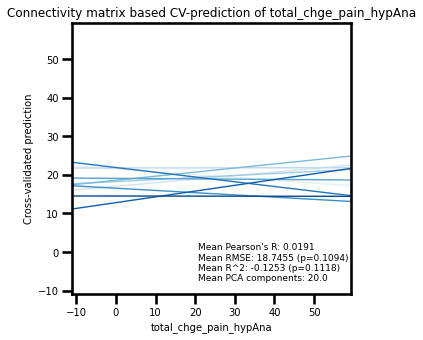

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.8198


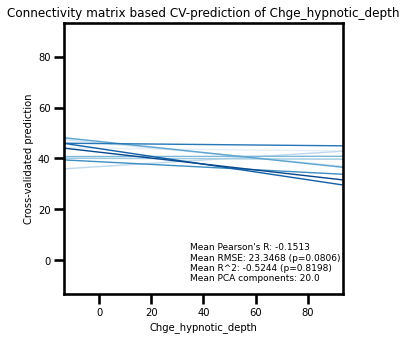

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.3485


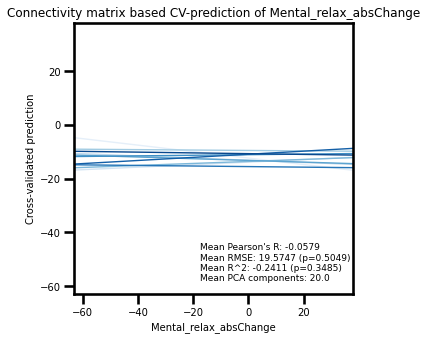

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.0612


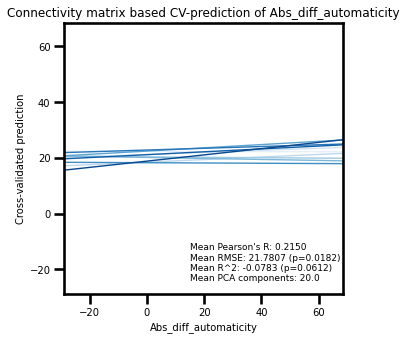

Degree
--- SHSS_score ---
Permutation test for r2 values: p=0.5539


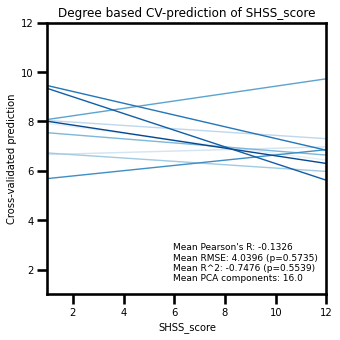

--- raw_change_ANA ---
Permutation test for r2 values: p=0.6915


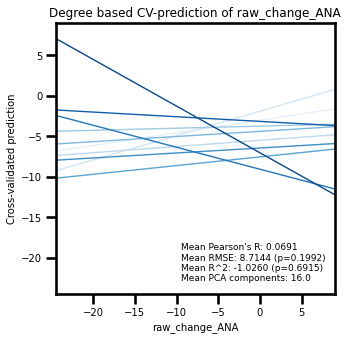

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.0006


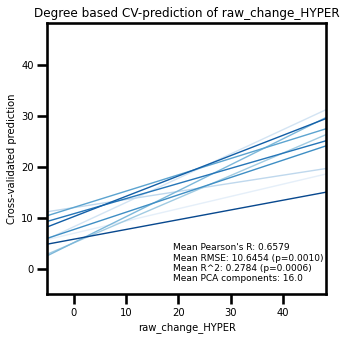

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.0050


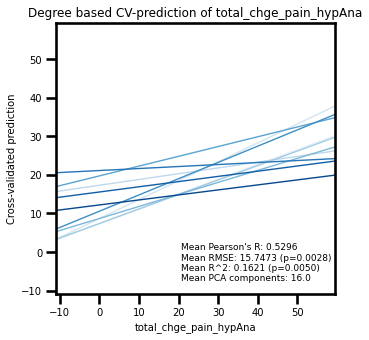

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.4225


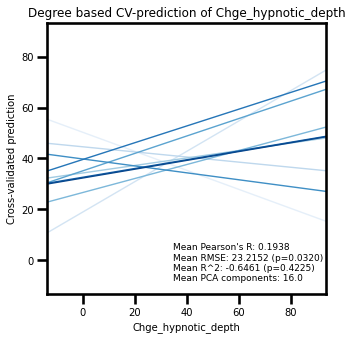

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.4653


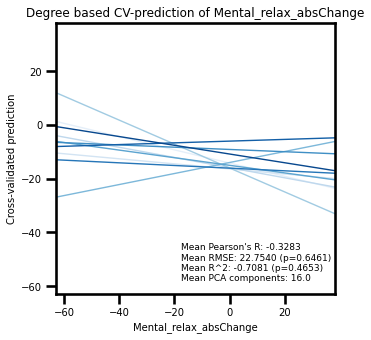

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.5979


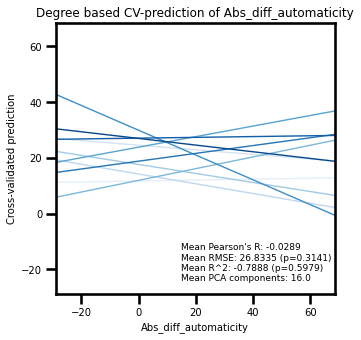

Closeness centrality
--- SHSS_score ---
Permutation test for r2 values: p=0.6847


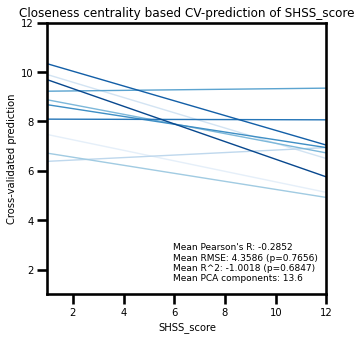

--- raw_change_ANA ---
Permutation test for r2 values: p=0.8774


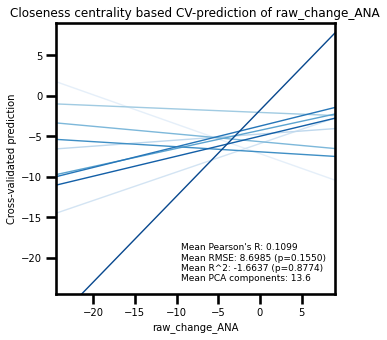

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.4095


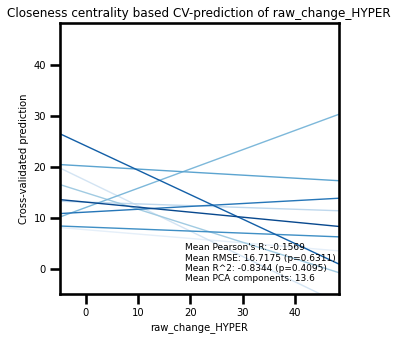

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.2633


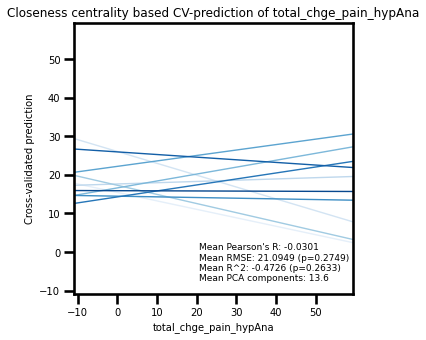

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.8766


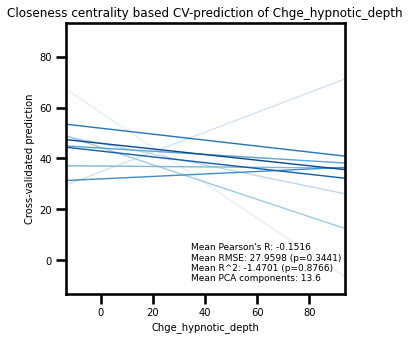

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.8246


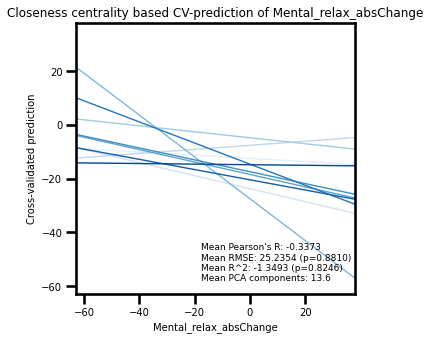

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.2721


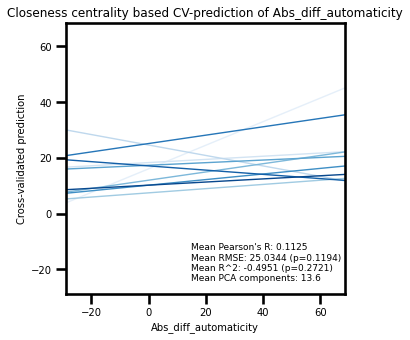

Betweenness centrality
--- SHSS_score ---
Permutation test for r2 values: p=0.7784


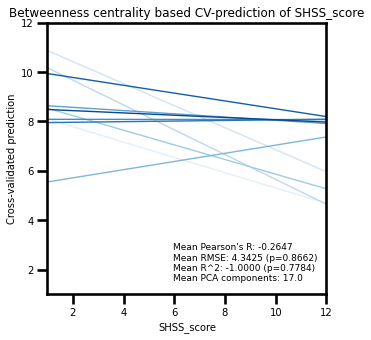

--- raw_change_ANA ---
Permutation test for r2 values: p=0.8420


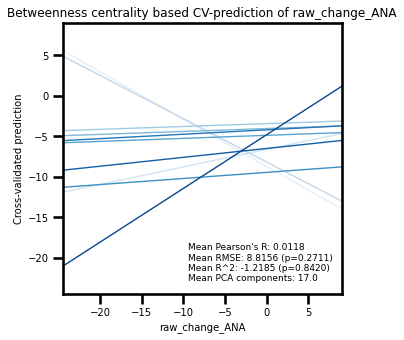

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.6041


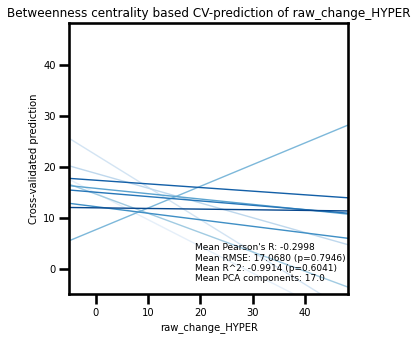

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.6667


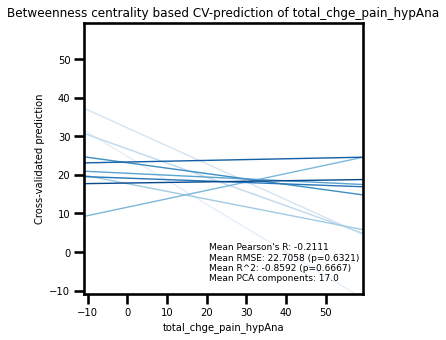

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.9750


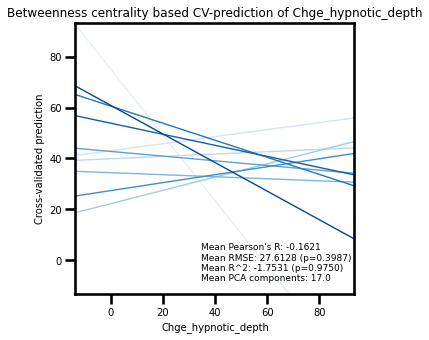

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.4043


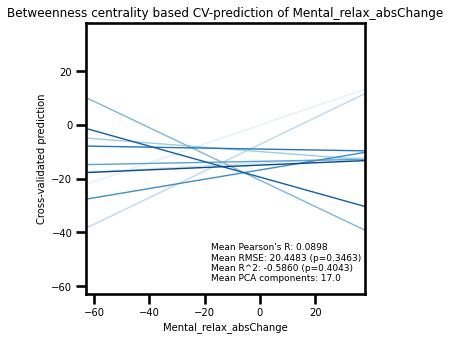

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.6793


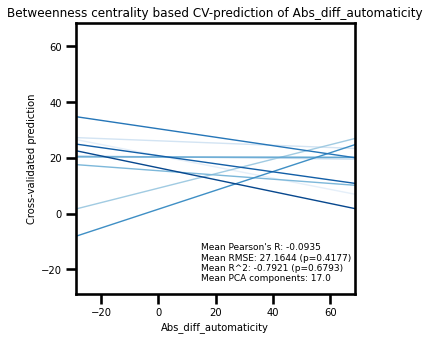

Clustering
--- SHSS_score ---
Permutation test for r2 values: p=0.6609


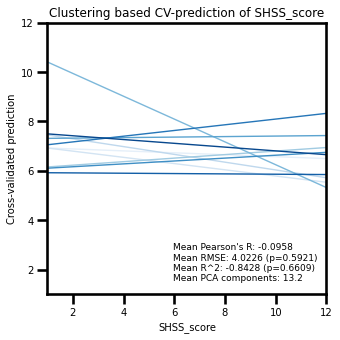

--- raw_change_ANA ---
Permutation test for r2 values: p=0.9012


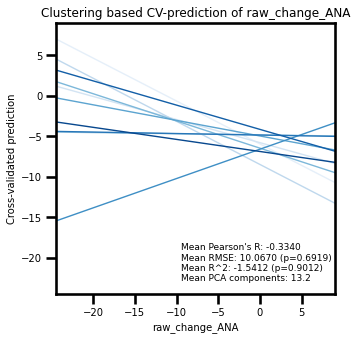

--- raw_change_HYPER ---
Permutation test for r2 values: p=0.3197


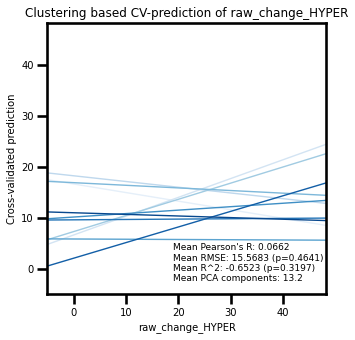

--- total_chge_pain_hypAna ---
Permutation test for r2 values: p=0.5347


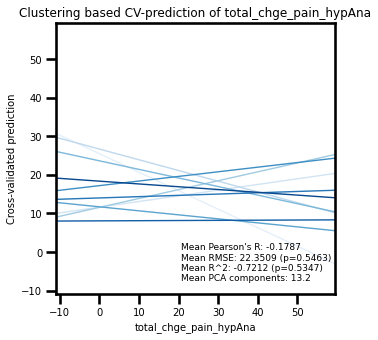

--- Chge_hypnotic_depth ---
Permutation test for r2 values: p=0.1004


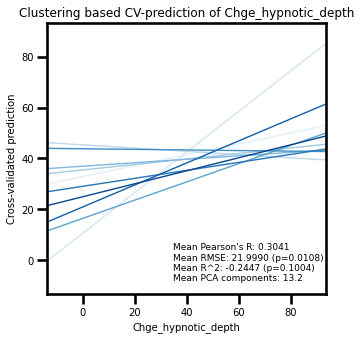

--- Mental_relax_absChange ---
Permutation test for r2 values: p=0.1272


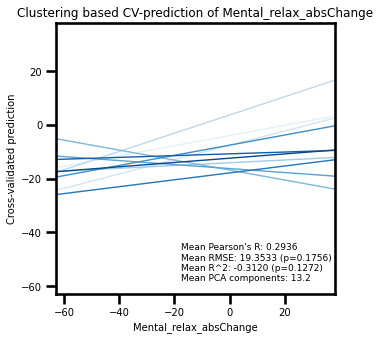

--- Abs_diff_automaticity ---
Permutation test for r2 values: p=0.3629


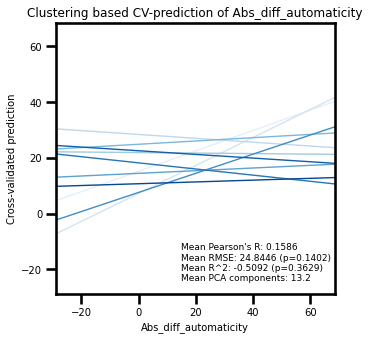

In [675]:
# Ridge model and output for each graph metric and dependent variable
#feature_matrices = [X_degree, X_degreeCentrality, X_closeness, X_betweenness, X_clustering]
#concatenated_matrices = np.vstack(feature_matrices)
#num_participants = X_degree.shape[0]
#group_column = np.tile(np.arange(1, num_participants + 1), len(feature_matrices))

random_seed = 0
for rawfeatures_matrix, g_metric in zip([X_con, X_degree, X_closeness, X_betweenness, X_clustering], ['Connectivity matrix', 'Degree', 'Closeness centrality', 'Betweenness centrality', 'Clustering']):
    print('================ \n{}\n================'.format(g_metric))
    
    prePipeline = Pipeline([('scaler', StandardScaler())])
    features_matrix = prePipeline.fit_transform(rawfeatures_matrix)

    #pipeline = Pipeline([('std', QuantileTransformer(n_quantiles=22)), ('pca', PCA(n_components=0.80)), ('ridge', Ridge())])
    pipeline = Pipeline([('pca', PCA(n_components=0.90)), ('reg', Ridge())])
    #cv = KFold(n_splits=5, random_state=random_seed, shuffle=True)
    cv = ShuffleSplit(n_splits=10, test_size=0.20, random_state=random_seed)

    for target_column in target_columns:
        print(f"--- {target_column} ---")
        y_preds = []
        y_tests = []
        y = Y[target_column].values
        # Add covariates to the feature matrix (?!!)
        add_cov = False
        #if  target_column != 'SHSS_score':
            #add_cov = True
            #covariate_column = 'SHSS_score'
        '''
        if target_column != 'SHSS_score':
            covariate_column = 'Abs_diff_automaticity'
            add_cov = True
        if add_cov:    
            features_matrix = np.hstack((features_matrix, Y[covariate_column].values.reshape(-1, 1)))
            covariate_corr, p_value = pearsonr(Y[covariate_column], y)
            p_value_corrected = fdrcorrection([p_value])[1][0]  # Apply FDR correction
            print(f"Pearson correlation between {covariate_column} and {target_column}:\n r={covariate_corr:.4f} (FDR corrected p-value: p={p_value_corrected:.4f})")
        '''
        
        pearson_r_scores = []
        r2_scores = []
        mse_scores = []
        rmse_scores = []
        n_components = []
        all_coefficients = []
        
        for train_index, test_index in cv.split(features_matrix):
            # Split the data into train and test sets based on the current fold
            X_train, X_test = features_matrix[train_index], features_matrix[test_index]
            y_train, y_test = y[train_index], y[test_index]
            # Fit pipeline model with best hyperparameters
            pipeline.fit(X_train, y_train)
            y_pred = pipeline.predict(X_test)
            y_preds.append(y_pred)
            y_tests.append(y_test)

            # Calculate evaluation metrics
            pearson_r, _ = pearsonr(y_test, y_pred)
            r2 = r2_score(y_test, y_pred)
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)

            # Append metrics to the respective lists
            pearson_r_scores.append(pearson_r)
            r2_scores.append(r2)
            mse_scores.append(mse)
            rmse_scores.append(rmse)
            n_components.append(pipeline.named_steps['pca'].n_components_)
            coefficients = pipeline.named_steps['reg'].coef_
            all_coefficients.append(coefficients)

        #Permutation tests
        r2score, _, r2p_value = compute_permutation(features_matrix, y, pipeline, cv = cv, scoring='r2', random_seed=random_seed)
        rmse_score, _, rmse_p_value = compute_permutation(features_matrix, y, pipeline, cv = cv, scoring='neg_root_mean_squared_error', random_seed=random_seed)
        #r2p_value,rmse_p_value = 0.00001, 0.00001
        
        print(f"Permutation test for r2 values: p={r2p_value:.4f}")
        # Calculate mean metrics across all folds
        mean_pearson_r = np.mean(pearson_r_scores)
        mean_r2 = np.mean(r2_scores)
        mean_mse = np.mean(mse_scores)
        mean_rmse = np.mean(rmse_scores)
        mean_n_components = np.mean(n_components)
        # Calculate standard deviation metrics across all folds
        # avg_z_score = np.mean(np.array(all_coefficients), axis=0) / np.std(all_coefficients, axis=0)
        # print(f"Average z-score = {avg_z_score} std = {np.std(all_coefficients, axis=0)}")
        # Plot
        plot_title = f"{g_metric} based CV-prediction of {target_column}"
        reg_plot_performance(y_tests, y_preds, target_column, mean_pearson_r, mean_rmse, mean_r2, r2p_value,rmse_p_value, mean_n_components, title=plot_title)


In [ ]:
#Regular OLS model
from sklearn import datasets, linear_model
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score, ShuffleSplit
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.stats.multitest import fdrcorrection   
import statsmodels.api as sm

y_col = ["Abs_chge_pain_hypAna", "Chge_hypnotic_depth", "Mental_relax_absChange", "Abs_diff_automaticity"]


for col in y_col:
    y = Y[target_column].values
    x = PCA(n_components=10).fit_transform(X_con)
    lin_reg = sm.OLS(y, sm.add_constant(x)).fit()
    #lin_reg_log = sm.OLS(y_log, x_constant).fit()
    lin_reg_wls = sm.WLS(y, sm.add_constant(x)).fit()
    
    ols_res = lin_reg.summary()
    print(col, '\n-----------',ols_res)
    corr_ps = fdrcorrection(lin_reg.pvalues)[0]
    for i in range(len(corr_ps)):
        if corr_ps[i] == True:
            print('Feature', i, 'is significant with FDR correction')
    model = SVR()
    ss = ShuffleSplit(n_splits=5, test_size=0.25, random_state=0)
    print(cross_val_score(model, x, y, cv=ss))

        


### Classification

In [1]:
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold, cross_val_predict, StratifiedShuffleSplit
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline


y = Y['SHSS_groups']
class_freq = y.value_counts().to_dict()
class_weight = {k: class_freq[k] for k in sorted(class_freq.keys())}

# Plot histogram of Y variable (SHSS groups)
plt.figure(figsize=(8, 6))
sns.histplot(data=y, kde=False, bins=len(y.unique()), color='blue')
plt.title(f'Histogram of SHSS Groups - {g_metric}')
plt.xlabel('SHSS Groups')
plt.ylabel('Frequency')
plt.show()

# Define classifiers
svc_clf = SVC(kernel='linear', C=1,class_weight = 'balanced',decision_function_shape = 'ovo',probability = True, random_state=42)
log_reg_clf = LogisticRegression(C=1, class_weight = 'balanced')
tree_clf = DecisionTreeClassifier(class_weight = 'balanced')

classifiers = [('svc', svc_clf), ('log_reg', log_reg_clf), ('tree', tree_clf)]

for features_matrix, g_metric in zip([X_con, X_degree, X_closeness, X_clustering], ['connectome','Degree', 'closeness', 'Clustering']):
    # Assuming X is your feature matrix and y is the 'SHSS_groups' column
    X = features_matrix
    voting_clf = VotingClassifier(estimators=classifiers, voting='hard')

    pipeline = Pipeline([('std', StandardScaler()), ('pca', PCA(n_components=0.80)), ('clf', voting_clf)])

    skf = StratifiedKFold(n_splits=5,shuffle= True, random_state=42)
    y_pred = cross_val_predict(pipeline, X, y, cv=skf)
    scores = cross_val_score(pipeline, X, y, cv=skf)
    print('scores :', scores)
    # Calculate evaluation metrics
    accuracy = accuracy_score(y, y_pred)
    precision = precision_score(y, y_pred, average='weighted')
    recall = recall_score(y, y_pred, average='weighted')
    f1 = f1_score(y, y_pred, average='weighted')

    print("---", g_metric, "---")
    print("Accuracy:",f"{accuracy:.4f}" )
    print("Precision:", f"{precision:.4f}")
    print("Recall:", f"{recall:.4f}")
    print("F1-score:", f"{f1:.4f}")

    cm = confusion_matrix(y, y_pred)
    print("Confusion Matrix:")
   # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f'Confusion Matrix - {g_metric} prediction of SHSS groups')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

   

NameError: name 'Y' is not defined

### Scale comparison from diff. cov. estimator

In [ ]:
resultspz, atlas, labels = load_all(p, 'difumo64_z_precision', 'difumo64') # z precision
resultspp, atlas, labels = load_all(p, 'difumo64_precision', 'difumo64') # psc precision
resultscovz, atlas, labels = load_all(p, 'difumo64_z_covariance', 'difumo64') # z covariance
resultscorz, atlas, labels = load_all(p, 'difumo64_z_correlation', 'difumo64') # z correlation (+arctanh correction)

In [ ]:
resultspz.keys()
# comparison of precisionz, precisionp, covz, corz
print('pre_mean_connectome', resultspz['pre_mean_connectome'].max(), '{:f}'.format(resultspp['pre_mean_connectome'].max()), resultscovz['pre_mean_connectome'].max(), resultscorz['pre_mean_connectome'].max())
print('post_mean_connectome', resultspz['post_mean_connectome'].max(), '{:f}'.format(resultspp['post_mean_connectome'].max()), resultscovz['post_mean_connectome'].max(), resultscorz['post_mean_connectome'].max())
print('zcontrast_mean_connectome', resultspz['zcontrast_mean_connectome'].max(), '{:f}'.format(resultspp['zcontrast_mean_connectome'].max()), resultscovz['zcontrast_mean_connectome'].max(), resultscorz['zcontrast_mean_connectome'].max())
print('pre_series', resultspz['pre_series'][0].max(), '{:f}'.format(resultspp['pre_series'][0].max()), resultscovz['pre_series'][0].max(), resultscorz['pre_series'][0].max())


# Graph theory (single graph)

In [ ]:
import matplotlib.cm as cm
from scipy import stats
from scipy.stats import ttest_1samp

A = results['zcontrast_mean_connectome']
G = nx.from_numpy_matrix(np.matrix(A), create_using=nx.Graph)
G = nx.relabel_nodes(G, dict(zip(range(len(G.nodes())),labels)))
G.edges.data('weight')
edge_weights = G.edges.data('weight')


In [ ]:
# Get the basic structure and dimensions of the keys
print("Number of nodes:", G.number_of_nodes())
print("Number of edges:", G.number_of_edges())
print("Nodes:", G.nodes())
print("Edges:", G.edges())

### Edge density plot

In [ ]:
# plot heatmap
#plt.figure(figsize = (20, 20))
#_ = sns.heatmap(A, cmap='coolwarm', cbar=True, square=False, mask=None)
matrix = A
matrixdiagNaN = matrix.copy()
np.fill_diagonal(matrixdiagNaN,np.nan)

# Weight distribution plot
bins = np.arange(np.sqrt(len(np.concatenate(matrix))))
bins = (bins - np.min(bins))/np.ptp(bins)
fig, axes = plt.subplots(1,2, figsize=(15,5))

# Distribution of raw weights
rawdist = sns.distplot(matrixdiagNaN.flatten(), bins=bins, kde=False, ax=axes[0], norm_hist=True)
rawdist.set(xlabel='Correlation Values', ylabel = 'Density Frequency')

# Probability density of log10
log10dist = sns.distplot(np.log10(matrixdiagNaN).flatten(), kde=False, ax=axes[1], norm_hist=True)
log10dist.set(xlabel='log(weights)')

## Metrics

In [ ]:
import pygsp
G_fd = pygsp.graphs.Graph(A)
G_fd.compute_laplacian(lap_type="normalized")
G_fd.compute_fourier_basis()  # compute connectome harmonics

### Efficiency

In [ ]:

nx.global_efficiency(G)  # this gives efficiency for node 2 and 3


### Degree/Strength

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
from nilearn import plotting

# Compute the degree of the graph
degree = dict(G.degree(weight='weight'))

# Sort the nodes by degree (highest to lowest)
sorted_degree = sorted(degree.items(), key=lambda x: x[1], reverse=True)

# Get the highest 5% of nodes and their degree values
top_5_percent = int(len(sorted_degree) * 0.05)
highest_nodes = sorted_degree[:top_5_percent]

# Print all nodes and their degree values
print("Nodes sorted by degree (highest to lowest):")
for node_label, deg in sorted_degree:
    print(f"{node_label}: {deg}")

# Print the threshold value
threshold = highest_nodes[-1][1]
print(f"Threshold (highest 5%): {threshold}")

# Degree Histogram
sns.distplot(list(degree.values()), kde=False, norm_hist=False)
plt.xlabel('Degree Values')
plt.ylabel('Counts')

# Plot the highest 5% values on the histogram
plt.axvline(x=threshold, color='red', linestyle='--', label='Threshold (highest 5%)')
plt.legend()
plt.show()

# Plot the graph with degree values as the node markers
coords = plotting.find_probabilistic_atlas_cut_coords(atlas) 

# Plot the marker plot with all nodes
plt.figure(figsize=(8, 6))
plotting.plot_markers([degree[node] for node in G.nodes], coords, title='Node densities (correlation estim.) - All Nodes')
plt.show()

# Replace degree values below threshold with 0
for node_label, deg in degree.items():
    if deg < threshold:
        degree[node_label] = 0

# Plot the marker plot with only nodes above the threshold
plt.figure(figsize=(8, 6))
plotting.plot_markers([degree[node] for node in G.nodes], coords, title='Node densities (correlation estim.) - Nodes above Threshold')
plt.show()


In [ ]:
# degree
#Vertex degree quantifies the total number of vertex connections in an undirected binary network (Fornito et al. 2016)
G.degree(weight='weight')
strength = G.degree(weight='weight')
strengths = {node: val for (node, val) in strength}
nx.set_node_attributes(G, dict(strength), 'strength') # Add as nodal attribute

# Normalized node strength values 1/N-1
normstrenghts = {node: val * 1/(len(G.nodes)-1) for (node, val) in strength}
nx.set_node_attributes(G, normstrenghts, 'strengthnorm') # Add as nodal attribute

# Computing the mean degree of the network
normstrengthlist = np.array([val * 1/(len(G.nodes)-1) for (node, val) in strength])
mean_degree = np.sum(normstrengthlist)/len(G.nodes)
print('mean_degree :', mean_degree)
print(strengths)


### closeness

In [ ]:
# The function accepts a argument 'distance' that, in correlation-based networks, must be seen as the inverse ... 
# of the weight value. Thus, a high correlation value (e.g., 0.8) means a shorter distance (i.e., 0.2).
G_distance_dict = {(e1, e2): 1 / abs(weight) for e1, e2, weight in G.edges(data='weight')}

# Then add them as attributes to the graph edges
nx.set_edge_attributes(G, G_distance_dict, 'distance')

# Computation of Closeness closeness
closeness = nx.closeness_closeness(G, distance='distance')

# Now we add the closeness closeness value as an attribute to the nodes
nx.set_node_attributes(G, closeness, 'closecent')

# Closeness closeness Histogram
sns.distplot(list(closeness.values()), kde=False, norm_hist=False)
plt.xlabel('closeness Values')
plt.ylabel('Counts')

plotting.plot_markers([closeness[key] for key in sorted(closeness.keys())], coords)

print(['{} : {}'.format(node, G.nodes[node]['closecent']) for node in G.nodes if G.nodes[node]['closecent'] > 0.135])

Clossness closeness

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
from nilearn import plotting

# The function accepts a argument 'distance' that, in correlation-based networks, must be seen as the inverse ... 
# of the weight value. Thus, a high correlation value (e.g., 0.8) means a shorter distance (i.e., 0.2).
G_distance_dict = {(e1, e2): 1 / abs(weight) for e1, e2, weight in G.edges(data='weight')}

# Then add them as attributes to the graph edges
nx.set_edge_attributes(G, G_distance_dict, 'distance')

# Computation of Closeness closeness
closeness = nx.closeness_closeness(G, distance='distance')

# Now we add the closeness closeness value as an attribute to the nodes
nx.set_node_attributes(G, closeness, 'closecent')

# Sort the nodes by closeness closeness (highest to lowest)
sorted_closeness = sorted(closeness.items(), key=lambda x: x[1], reverse=True)

# Get the highest 5% of nodes and their closeness values
top_5_percent = int(len(sorted_closeness) * 0.05)
highest_nodes = sorted_closeness[:top_5_percent]

# Print all nodes and their closeness closeness values
print("Nodes sorted by closeness closeness (highest to lowest):")
for node_label, closeness in sorted_closeness:
    print(f"{node_label}: {closeness}")

# Print the threshold value
threshold = highest_nodes[-1][1]
print(f"Threshold (highest 5%): {threshold}")

# Closeness closeness Histogram
sns.distplot(list(closeness.values()), kde=False, norm_hist=False)
plt.xlabel('closeness Values')
plt.ylabel('Counts')

# Plot the highest 5% values on the histogram
plt.axvline(x=threshold, color='red', linestyle='--', label='Threshold (highest 5%)')
plt.legend()
plt.show()

# Plot the graph with closeness closeness values as the node markers
coords = plotting.find_probabilistic_atlas_cut_coords(atlas) 

# Plot the marker plot with all nodes
plt.figure(figsize=(8, 6))
plotting.plot_markers([closeness[node] for node in G.nodes], coords, title='Node densities (correlation estim.) - All Nodes')
plt.show()

# Replace closeness values below threshold with 0
for node_label, closeness in closeness.items():
    if closeness < threshold:
        closeness[node_label] = 0

# Plot the marker plot with only nodes above the threshold
plt.figure(figsize=(8, 6))
plotting.plot_markers([closeness[node] for node in G.nodes], coords, title='Node densities (correlation estim.) - Nodes above Threshold')
plt.show()


### Distance and shortest path

"The shortest path is the path with the least number of edges (or least total weight) between two vertices in a network. In a weighted graph, the shortest path is calculated by the minimum sum of the weights of edges between two vertices (Fornito et al. 2016). 
he weights must be converted to ‘distance’ by computing the inverse of the original weight (1−weight or 1weight); a higher correlation value represents a shorter distance (Fornito et al. 2016)"(Centeno,2022)

In [ ]:
# Distance
dist_dict = {(e1,e2): 1/abs(weight) for e1,e2 ,weight in G.edges.data('weight')}
nx.set_edge_attributes(G, dist_dict,'distance')

# Shortest path
short_path = dict(nx.all_pairs_dijkstra_path_length(G, weight='distance'))

In [ ]:
short_path

### *Clustering coefficient
The clustering coefficient assesses the tendency for any two neighbours of a vertex to be directly connected (or more strongly connected in the weighted case) to each other and can also be termed cliquishness (Hallquist and Hillary 2018)

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
from nilearn import plotting

# Clustering Coefficient Calculation
clustering = nx.clustering(G, weight='weight')
nx.set_node_attributes(G, clustering, 'cc')

# Sort the nodes by clustering coefficient (highest to lowest)
sorted_clustering = sorted(clustering.items(), key=lambda x: x[1], reverse=True)

# Get the highest 5% of nodes and their clustering coefficients
top_5_percent = int(len(sorted_clustering) * 0.05)
highest_nodes = sorted_clustering[:top_5_percent]

# Print all nodes and their clustering coefficients
print("Nodes sorted by clustering coefficient (highest to lowest):")
for node_label, cc in sorted_clustering:
    print(f"{node_label}: {cc}")

# Print the threshold value
threshold = highest_nodes[-1][1]
print(f"Threshold (highest 5%): {threshold}")

# Clustering Coefficient Histogram
plt.figure(figsize=(8, 6))
sns.distplot(list(clustering.values()), kde=False, norm_hist=False)
plt.xlabel('Clustering Coefficient')
plt.ylabel('Counts')
plt.axvline(x=threshold, color='red', linestyle='--', label='Threshold (highest 5%)')
plt.legend()
plt.title('Clustering Coefficient Distribution')
plt.show()

# Plot the graph with clustering coefficients as the node markers
coords = plotting.find_probabilistic_atlas_cut_coords(atlas) 

# Plot the marker plot with all nodes
plt.figure(figsize=(8, 6))
plotting.plot_markers([clustering[node] for node in G.nodes], coords, title='Node Clustering Coefficients - All Nodes')
plt.show()

# Replace clustering coefficients values below threshold with 0
for node_label, cc in clustering.items():
    if cc < threshold:
        clustering[node_label] = 0

# Plot the marker plot with only nodes above the threshold
plt.figure(figsize=(8, 6))
plotting.plot_markers([clustering[node] for node in G.nodes], coords, title='Node Clustering Coefficients - Nodes above Threshold')
plt.show()


### ? *Modularity


In [ ]:
#part = nx.community.best_partition(G, weight='weight') # Louvain algorithm
from networkx import community
#part = community.best_partition(G, weight='weight')

# check number of communities
#set(part.values()).union()
communities_generator = nx.community.girvan_newman(G)
top_level_communities = next(communities_generator)
nx.community.modularity(G, top_level_communities)
top_level_communities


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch

# Your code to generate the communities
communities_generator = nx.community.girvan_newman(G)
top_level_communities = next(communities_generator)
modularity = nx.community.modularity(G, top_level_communities)

# Create a dendrogram of the community structure
dendrogram = sch.dendrogram(sch.linkage(nx.to_numpy_array(G), method='ward'))

# Set plot labels and title
plt.xlabel('Nodes')
plt.ylabel('Distance')
plt.title('Dendrogram of Community Structure')

# Show the plot
plt.show()

# Create a bar plot to show the modularity of each community
community_modularities = [nx.community.modularity(G, community) for community in top_level_communities]
community_labels = [f'Community {i + 1}' for i in range(len(top_level_communities))]

plt.bar(community_labels, community_modularities)
plt.xlabel('Community')
plt.ylabel('Modularity')
plt.title('Modularity of Top-Level Communities')
plt.xticks(rotation=45)

# Show the plot
plt.show()


### Visualization

## Clustering

In [ ]:
lcc = nx.clustering(G, weight='weight')

In [ ]:
# minimum spanning tree
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
from nilearn import plotting

# Compute the minimum spanning tree
mst = nx.minimum_spanning_tree(G, weight='weight')

# Plot the MST on the brain template
coords = plotting.find_probabilistic_atlas_cut_coords(atlas) 

plt.figure(figsize=(8, 6))
plotting.plot_connectome(adjacency_matrix=nx.to_numpy_array(mst),
                         node_coords=coords,
                         node_color='skyblue',
                         edge_cmap='coolwarm',
                         edge_threshold='98%',
                         title='Minimum Spanning Tree (MST)')
plt.show()
